In [2]:
import argparse
import requests
import json

from pytineye import TinEyeAPIRequest
from tqdm.notebook import tnrange, tqdm_notebook
import cv2, pafy
import os

from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
from matplotlib import image
%matplotlib inline
import numpy as np
import cv2

from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

from PIL import Image
from IPython.display import Image, display

import os

<font color='burnt orange'>

<p style="font-family:Book Antiqua"><B> Problem Statement: </B></P>
<p style="font-family:Book Antiqua"> Clash of Clans(COC) is an addictive game where you build a base to defend from other player attacking your base, train troops, and attack others. The goal of the attacker is to destroy all the building on the base and vice a versa for defender i.e. defend as building as possible. <BR> <BR>
Now that we understand the mechanics, let's dive into the need and what problem we will solve. In 2018 Supercell introduced the world championship cup for COC, which attracted players all over the world and 2019 there was a prize pool of 1 Million US dollars at stake. <BR><BR>
This led to extensive YouTube content creation of how to attack videos from professional gamers such as Carbonfin, ITZU etc. COC player would spend hours going through each video on YouTube to check if bases are burnt i.e. if there is a video that shows how someone else has attacked the base. This gives the Clan (Team) a huge competitive advantage.
<BR><BR> 
In my capstone project I wanted to see if we could use statistical algorithm to reverse search an image on YouTube and return back the link to the video if the image is found.<BR><BR>
    The inspiration for this project came from wondering if computer vision & Statistics can be used to solve an age-old problem faced by clash of clan gaming community or grinding for strategies on YouTube is part and parcel of the a gamers life
</p> 

<font color='burnt orange'>
<p style="font-family:Book Antiqua"><B> Process Followed: </B></P>
<p style="font-family:Book Antiqua">- Data Collection<BR>
- Data Cleanup<BR>
- Model Evaluation<BR>
- Final Moden<BR><BR>
The process for my project consisted of collecting and cleaning image data gathered from YouTube. Exploring and using multiple statistical algorithms to compare images for similarity and ultimately fine tuning the model to improve the accuracy score![image.png](attachment:image.png)<BR><BR>
<p style="font-family:Book Antiqua"><B> Data Collection: </B></P>
For the data collection I first had to manually created the list of YouTube links for famous Clash of Clans content creators. After that I used Pyton open cv,pafy libraries to extract frames from the videos.<BR><BR>
<p style="font-family:Book Antiqua"><B> EDA: </B></P>
<p style="font-family:Book Antiqua"><B> Data Cleanup: </B></P>
Data Cleanup was done in 3 steps <BR>
Step 1: Rename frames captured in chronological order <BR>
Step 2: Move the frames of each YouTube video in seperate folder <BR>
Step 3: Rename the folders with corresponding YouTube ID <BR>


In [4]:
# List of YouTube url's for famous Clash of Clans content creator. I have reduced the list to only 2 links 
#incase you would like to download images

url_list = ['https://www.youtube.com/watch?v=VvL5Q7YVyWM',\
            'https://www.youtube.com/watch?v=J-V8fffpgvw']


for urlname in url_list:

    #url   = "https://www.youtube.com/watch?v=VvL5Q7YVyWM"
    #url = "https://www.youtube.com/watch?v=ScGt9Ie8gmw"
    url = urlname
    splitby = "v="
    vid = url[url.index(splitby) + len(splitby):]
    print (vid)

    video = pafy.new(url)
    best  = video.getbest(preftype="mp4")
    #documentation: https://pypi.org/project/pafy/

    cam = cv2.VideoCapture(best.url)
    #cam = cv2.VideoCapture("http://www.youtube.com/watch?v=3764Jpy0MRg")
    try: 

        # creating a folder named data 
        if not os.path.exists(vid): 
            os.makedirs(vid) 

    # if not created then raise error 
    except OSError: 
        print ('Error: Creating directory of data') 

    # frame 
    currentframe = 0

    while(True): 

        # reading from frame 
        ret,frame = cam.read() 

        if ret: 
            # if video is still left continue creating images 
            name = './'+ vid + '/frame' + str(currentframe) + '.jpg'
            print ('Creating...' + name) 
            #display(Image(filename=frame))

            # writing the extracted images 
            cv2.imwrite(name, frame)

            # increasing counter so that it will 
            # show how many frames are created 
            currentframe += 1
        else: 
            break

    # Release all space and windows once done 
    cam.release() 
    cv2.destroyAllWindows() 

VvL5Q7YVyWM
Creating..../VvL5Q7YVyWM/frame0.jpg
Creating..../VvL5Q7YVyWM/frame1.jpg
Creating..../VvL5Q7YVyWM/frame2.jpg
Creating..../VvL5Q7YVyWM/frame3.jpg
Creating..../VvL5Q7YVyWM/frame4.jpg
Creating..../VvL5Q7YVyWM/frame5.jpg
Creating..../VvL5Q7YVyWM/frame6.jpg
Creating..../VvL5Q7YVyWM/frame7.jpg
Creating..../VvL5Q7YVyWM/frame8.jpg
Creating..../VvL5Q7YVyWM/frame9.jpg
Creating..../VvL5Q7YVyWM/frame10.jpg
Creating..../VvL5Q7YVyWM/frame11.jpg
Creating..../VvL5Q7YVyWM/frame12.jpg
Creating..../VvL5Q7YVyWM/frame13.jpg
Creating..../VvL5Q7YVyWM/frame14.jpg
Creating..../VvL5Q7YVyWM/frame15.jpg
Creating..../VvL5Q7YVyWM/frame16.jpg
Creating..../VvL5Q7YVyWM/frame17.jpg
Creating..../VvL5Q7YVyWM/frame18.jpg
Creating..../VvL5Q7YVyWM/frame19.jpg
Creating..../VvL5Q7YVyWM/frame20.jpg
Creating..../VvL5Q7YVyWM/frame21.jpg
Creating..../VvL5Q7YVyWM/frame22.jpg
Creating..../VvL5Q7YVyWM/frame23.jpg
Creating..../VvL5Q7YVyWM/frame24.jpg
Creating..../VvL5Q7YVyWM/frame25.jpg
Creating..../VvL5Q7YVyWM/frame26.jpg

Creating..../VvL5Q7YVyWM/frame220.jpg
Creating..../VvL5Q7YVyWM/frame221.jpg
Creating..../VvL5Q7YVyWM/frame222.jpg
Creating..../VvL5Q7YVyWM/frame223.jpg
Creating..../VvL5Q7YVyWM/frame224.jpg
Creating..../VvL5Q7YVyWM/frame225.jpg
Creating..../VvL5Q7YVyWM/frame226.jpg
Creating..../VvL5Q7YVyWM/frame227.jpg
Creating..../VvL5Q7YVyWM/frame228.jpg
Creating..../VvL5Q7YVyWM/frame229.jpg
Creating..../VvL5Q7YVyWM/frame230.jpg
Creating..../VvL5Q7YVyWM/frame231.jpg
Creating..../VvL5Q7YVyWM/frame232.jpg
Creating..../VvL5Q7YVyWM/frame233.jpg
Creating..../VvL5Q7YVyWM/frame234.jpg
Creating..../VvL5Q7YVyWM/frame235.jpg
Creating..../VvL5Q7YVyWM/frame236.jpg
Creating..../VvL5Q7YVyWM/frame237.jpg
Creating..../VvL5Q7YVyWM/frame238.jpg
Creating..../VvL5Q7YVyWM/frame239.jpg
Creating..../VvL5Q7YVyWM/frame240.jpg
Creating..../VvL5Q7YVyWM/frame241.jpg
Creating..../VvL5Q7YVyWM/frame242.jpg
Creating..../VvL5Q7YVyWM/frame243.jpg
Creating..../VvL5Q7YVyWM/frame244.jpg
Creating..../VvL5Q7YVyWM/frame245.jpg
Creating....

Creating..../VvL5Q7YVyWM/frame444.jpg
Creating..../VvL5Q7YVyWM/frame445.jpg
Creating..../VvL5Q7YVyWM/frame446.jpg
Creating..../VvL5Q7YVyWM/frame447.jpg
Creating..../VvL5Q7YVyWM/frame448.jpg
Creating..../VvL5Q7YVyWM/frame449.jpg
Creating..../VvL5Q7YVyWM/frame450.jpg
Creating..../VvL5Q7YVyWM/frame451.jpg
Creating..../VvL5Q7YVyWM/frame452.jpg
Creating..../VvL5Q7YVyWM/frame453.jpg
Creating..../VvL5Q7YVyWM/frame454.jpg
Creating..../VvL5Q7YVyWM/frame455.jpg
Creating..../VvL5Q7YVyWM/frame456.jpg
Creating..../VvL5Q7YVyWM/frame457.jpg
Creating..../VvL5Q7YVyWM/frame458.jpg
Creating..../VvL5Q7YVyWM/frame459.jpg
Creating..../VvL5Q7YVyWM/frame460.jpg
Creating..../VvL5Q7YVyWM/frame461.jpg
Creating..../VvL5Q7YVyWM/frame462.jpg
Creating..../VvL5Q7YVyWM/frame463.jpg
Creating..../VvL5Q7YVyWM/frame464.jpg
Creating..../VvL5Q7YVyWM/frame465.jpg
Creating..../VvL5Q7YVyWM/frame466.jpg
Creating..../VvL5Q7YVyWM/frame467.jpg
Creating..../VvL5Q7YVyWM/frame468.jpg
Creating..../VvL5Q7YVyWM/frame469.jpg
Creating....

Creating..../VvL5Q7YVyWM/frame675.jpg
Creating..../VvL5Q7YVyWM/frame676.jpg
Creating..../VvL5Q7YVyWM/frame677.jpg
Creating..../VvL5Q7YVyWM/frame678.jpg
Creating..../VvL5Q7YVyWM/frame679.jpg
Creating..../VvL5Q7YVyWM/frame680.jpg
Creating..../VvL5Q7YVyWM/frame681.jpg
Creating..../VvL5Q7YVyWM/frame682.jpg
Creating..../VvL5Q7YVyWM/frame683.jpg
Creating..../VvL5Q7YVyWM/frame684.jpg
Creating..../VvL5Q7YVyWM/frame685.jpg
Creating..../VvL5Q7YVyWM/frame686.jpg
Creating..../VvL5Q7YVyWM/frame687.jpg
Creating..../VvL5Q7YVyWM/frame688.jpg
Creating..../VvL5Q7YVyWM/frame689.jpg
Creating..../VvL5Q7YVyWM/frame690.jpg
Creating..../VvL5Q7YVyWM/frame691.jpg
Creating..../VvL5Q7YVyWM/frame692.jpg
Creating..../VvL5Q7YVyWM/frame693.jpg
Creating..../VvL5Q7YVyWM/frame694.jpg
Creating..../VvL5Q7YVyWM/frame695.jpg
Creating..../VvL5Q7YVyWM/frame696.jpg
Creating..../VvL5Q7YVyWM/frame697.jpg
Creating..../VvL5Q7YVyWM/frame698.jpg
Creating..../VvL5Q7YVyWM/frame699.jpg
Creating..../VvL5Q7YVyWM/frame700.jpg
Creating....

Creating..../VvL5Q7YVyWM/frame891.jpg
Creating..../VvL5Q7YVyWM/frame892.jpg
Creating..../VvL5Q7YVyWM/frame893.jpg
Creating..../VvL5Q7YVyWM/frame894.jpg
Creating..../VvL5Q7YVyWM/frame895.jpg
Creating..../VvL5Q7YVyWM/frame896.jpg
Creating..../VvL5Q7YVyWM/frame897.jpg
Creating..../VvL5Q7YVyWM/frame898.jpg
Creating..../VvL5Q7YVyWM/frame899.jpg
Creating..../VvL5Q7YVyWM/frame900.jpg
Creating..../VvL5Q7YVyWM/frame901.jpg
Creating..../VvL5Q7YVyWM/frame902.jpg
Creating..../VvL5Q7YVyWM/frame903.jpg
Creating..../VvL5Q7YVyWM/frame904.jpg
Creating..../VvL5Q7YVyWM/frame905.jpg
Creating..../VvL5Q7YVyWM/frame906.jpg
Creating..../VvL5Q7YVyWM/frame907.jpg
Creating..../VvL5Q7YVyWM/frame908.jpg
Creating..../VvL5Q7YVyWM/frame909.jpg
Creating..../VvL5Q7YVyWM/frame910.jpg
Creating..../VvL5Q7YVyWM/frame911.jpg
Creating..../VvL5Q7YVyWM/frame912.jpg
Creating..../VvL5Q7YVyWM/frame913.jpg
Creating..../VvL5Q7YVyWM/frame914.jpg
Creating..../VvL5Q7YVyWM/frame915.jpg
Creating..../VvL5Q7YVyWM/frame916.jpg
Creating....

Creating..../VvL5Q7YVyWM/frame1109.jpg
Creating..../VvL5Q7YVyWM/frame1110.jpg
Creating..../VvL5Q7YVyWM/frame1111.jpg
Creating..../VvL5Q7YVyWM/frame1112.jpg
Creating..../VvL5Q7YVyWM/frame1113.jpg
Creating..../VvL5Q7YVyWM/frame1114.jpg
Creating..../VvL5Q7YVyWM/frame1115.jpg
Creating..../VvL5Q7YVyWM/frame1116.jpg
Creating..../VvL5Q7YVyWM/frame1117.jpg
Creating..../VvL5Q7YVyWM/frame1118.jpg
Creating..../VvL5Q7YVyWM/frame1119.jpg
Creating..../VvL5Q7YVyWM/frame1120.jpg
Creating..../VvL5Q7YVyWM/frame1121.jpg
Creating..../VvL5Q7YVyWM/frame1122.jpg
Creating..../VvL5Q7YVyWM/frame1123.jpg
Creating..../VvL5Q7YVyWM/frame1124.jpg
Creating..../VvL5Q7YVyWM/frame1125.jpg
Creating..../VvL5Q7YVyWM/frame1126.jpg
Creating..../VvL5Q7YVyWM/frame1127.jpg
Creating..../VvL5Q7YVyWM/frame1128.jpg
Creating..../VvL5Q7YVyWM/frame1129.jpg
Creating..../VvL5Q7YVyWM/frame1130.jpg
Creating..../VvL5Q7YVyWM/frame1131.jpg
Creating..../VvL5Q7YVyWM/frame1132.jpg
Creating..../VvL5Q7YVyWM/frame1133.jpg
Creating..../VvL5Q7YVyWM/

Creating..../VvL5Q7YVyWM/frame1331.jpg
Creating..../VvL5Q7YVyWM/frame1332.jpg
Creating..../VvL5Q7YVyWM/frame1333.jpg
Creating..../VvL5Q7YVyWM/frame1334.jpg
Creating..../VvL5Q7YVyWM/frame1335.jpg
Creating..../VvL5Q7YVyWM/frame1336.jpg
Creating..../VvL5Q7YVyWM/frame1337.jpg
Creating..../VvL5Q7YVyWM/frame1338.jpg
Creating..../VvL5Q7YVyWM/frame1339.jpg
Creating..../VvL5Q7YVyWM/frame1340.jpg
Creating..../VvL5Q7YVyWM/frame1341.jpg
Creating..../VvL5Q7YVyWM/frame1342.jpg
Creating..../VvL5Q7YVyWM/frame1343.jpg
Creating..../VvL5Q7YVyWM/frame1344.jpg
Creating..../VvL5Q7YVyWM/frame1345.jpg
Creating..../VvL5Q7YVyWM/frame1346.jpg
Creating..../VvL5Q7YVyWM/frame1347.jpg
Creating..../VvL5Q7YVyWM/frame1348.jpg
Creating..../VvL5Q7YVyWM/frame1349.jpg
Creating..../VvL5Q7YVyWM/frame1350.jpg
Creating..../VvL5Q7YVyWM/frame1351.jpg
Creating..../VvL5Q7YVyWM/frame1352.jpg
Creating..../VvL5Q7YVyWM/frame1353.jpg
Creating..../VvL5Q7YVyWM/frame1354.jpg
Creating..../VvL5Q7YVyWM/frame1355.jpg
Creating..../VvL5Q7YVyWM/

Creating..../J-V8fffpgvw/frame163.jpg
Creating..../J-V8fffpgvw/frame164.jpg
Creating..../J-V8fffpgvw/frame165.jpg
Creating..../J-V8fffpgvw/frame166.jpg
Creating..../J-V8fffpgvw/frame167.jpg
Creating..../J-V8fffpgvw/frame168.jpg
Creating..../J-V8fffpgvw/frame169.jpg
Creating..../J-V8fffpgvw/frame170.jpg
Creating..../J-V8fffpgvw/frame171.jpg
Creating..../J-V8fffpgvw/frame172.jpg
Creating..../J-V8fffpgvw/frame173.jpg
Creating..../J-V8fffpgvw/frame174.jpg
Creating..../J-V8fffpgvw/frame175.jpg
Creating..../J-V8fffpgvw/frame176.jpg
Creating..../J-V8fffpgvw/frame177.jpg
Creating..../J-V8fffpgvw/frame178.jpg
Creating..../J-V8fffpgvw/frame179.jpg
Creating..../J-V8fffpgvw/frame180.jpg
Creating..../J-V8fffpgvw/frame181.jpg
Creating..../J-V8fffpgvw/frame182.jpg
Creating..../J-V8fffpgvw/frame183.jpg
Creating..../J-V8fffpgvw/frame184.jpg
Creating..../J-V8fffpgvw/frame185.jpg
Creating..../J-V8fffpgvw/frame186.jpg
Creating..../J-V8fffpgvw/frame187.jpg
Creating..../J-V8fffpgvw/frame188.jpg
Creating....

Creating..../J-V8fffpgvw/frame388.jpg
Creating..../J-V8fffpgvw/frame389.jpg
Creating..../J-V8fffpgvw/frame390.jpg
Creating..../J-V8fffpgvw/frame391.jpg
Creating..../J-V8fffpgvw/frame392.jpg
Creating..../J-V8fffpgvw/frame393.jpg
Creating..../J-V8fffpgvw/frame394.jpg
Creating..../J-V8fffpgvw/frame395.jpg
Creating..../J-V8fffpgvw/frame396.jpg
Creating..../J-V8fffpgvw/frame397.jpg
Creating..../J-V8fffpgvw/frame398.jpg
Creating..../J-V8fffpgvw/frame399.jpg
Creating..../J-V8fffpgvw/frame400.jpg
Creating..../J-V8fffpgvw/frame401.jpg
Creating..../J-V8fffpgvw/frame402.jpg
Creating..../J-V8fffpgvw/frame403.jpg
Creating..../J-V8fffpgvw/frame404.jpg
Creating..../J-V8fffpgvw/frame405.jpg
Creating..../J-V8fffpgvw/frame406.jpg
Creating..../J-V8fffpgvw/frame407.jpg
Creating..../J-V8fffpgvw/frame408.jpg
Creating..../J-V8fffpgvw/frame409.jpg
Creating..../J-V8fffpgvw/frame410.jpg
Creating..../J-V8fffpgvw/frame411.jpg
Creating..../J-V8fffpgvw/frame412.jpg
Creating..../J-V8fffpgvw/frame413.jpg
Creating....

Creating..../J-V8fffpgvw/frame605.jpg
Creating..../J-V8fffpgvw/frame606.jpg
Creating..../J-V8fffpgvw/frame607.jpg
Creating..../J-V8fffpgvw/frame608.jpg
Creating..../J-V8fffpgvw/frame609.jpg
Creating..../J-V8fffpgvw/frame610.jpg
Creating..../J-V8fffpgvw/frame611.jpg
Creating..../J-V8fffpgvw/frame612.jpg
Creating..../J-V8fffpgvw/frame613.jpg
Creating..../J-V8fffpgvw/frame614.jpg
Creating..../J-V8fffpgvw/frame615.jpg
Creating..../J-V8fffpgvw/frame616.jpg
Creating..../J-V8fffpgvw/frame617.jpg
Creating..../J-V8fffpgvw/frame618.jpg
Creating..../J-V8fffpgvw/frame619.jpg
Creating..../J-V8fffpgvw/frame620.jpg
Creating..../J-V8fffpgvw/frame621.jpg
Creating..../J-V8fffpgvw/frame622.jpg
Creating..../J-V8fffpgvw/frame623.jpg
Creating..../J-V8fffpgvw/frame624.jpg
Creating..../J-V8fffpgvw/frame625.jpg
Creating..../J-V8fffpgvw/frame626.jpg
Creating..../J-V8fffpgvw/frame627.jpg
Creating..../J-V8fffpgvw/frame628.jpg
Creating..../J-V8fffpgvw/frame629.jpg
Creating..../J-V8fffpgvw/frame630.jpg
Creating....

Creating..../J-V8fffpgvw/frame827.jpg
Creating..../J-V8fffpgvw/frame828.jpg
Creating..../J-V8fffpgvw/frame829.jpg
Creating..../J-V8fffpgvw/frame830.jpg
Creating..../J-V8fffpgvw/frame831.jpg
Creating..../J-V8fffpgvw/frame832.jpg
Creating..../J-V8fffpgvw/frame833.jpg
Creating..../J-V8fffpgvw/frame834.jpg
Creating..../J-V8fffpgvw/frame835.jpg
Creating..../J-V8fffpgvw/frame836.jpg
Creating..../J-V8fffpgvw/frame837.jpg
Creating..../J-V8fffpgvw/frame838.jpg
Creating..../J-V8fffpgvw/frame839.jpg
Creating..../J-V8fffpgvw/frame840.jpg
Creating..../J-V8fffpgvw/frame841.jpg
Creating..../J-V8fffpgvw/frame842.jpg
Creating..../J-V8fffpgvw/frame843.jpg
Creating..../J-V8fffpgvw/frame844.jpg
Creating..../J-V8fffpgvw/frame845.jpg
Creating..../J-V8fffpgvw/frame846.jpg
Creating..../J-V8fffpgvw/frame847.jpg
Creating..../J-V8fffpgvw/frame848.jpg
Creating..../J-V8fffpgvw/frame849.jpg
Creating..../J-V8fffpgvw/frame850.jpg
Creating..../J-V8fffpgvw/frame851.jpg
Creating..../J-V8fffpgvw/frame852.jpg
Creating....

Creating..../J-V8fffpgvw/frame1046.jpg
Creating..../J-V8fffpgvw/frame1047.jpg
Creating..../J-V8fffpgvw/frame1048.jpg
Creating..../J-V8fffpgvw/frame1049.jpg
Creating..../J-V8fffpgvw/frame1050.jpg
Creating..../J-V8fffpgvw/frame1051.jpg
Creating..../J-V8fffpgvw/frame1052.jpg
Creating..../J-V8fffpgvw/frame1053.jpg
Creating..../J-V8fffpgvw/frame1054.jpg
Creating..../J-V8fffpgvw/frame1055.jpg
Creating..../J-V8fffpgvw/frame1056.jpg
Creating..../J-V8fffpgvw/frame1057.jpg
Creating..../J-V8fffpgvw/frame1058.jpg
Creating..../J-V8fffpgvw/frame1059.jpg
Creating..../J-V8fffpgvw/frame1060.jpg
Creating..../J-V8fffpgvw/frame1061.jpg
Creating..../J-V8fffpgvw/frame1062.jpg
Creating..../J-V8fffpgvw/frame1063.jpg
Creating..../J-V8fffpgvw/frame1064.jpg
Creating..../J-V8fffpgvw/frame1065.jpg
Creating..../J-V8fffpgvw/frame1066.jpg
Creating..../J-V8fffpgvw/frame1067.jpg
Creating..../J-V8fffpgvw/frame1068.jpg
Creating..../J-V8fffpgvw/frame1069.jpg
Creating..../J-V8fffpgvw/frame1070.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame1261.jpg
Creating..../J-V8fffpgvw/frame1262.jpg
Creating..../J-V8fffpgvw/frame1263.jpg
Creating..../J-V8fffpgvw/frame1264.jpg
Creating..../J-V8fffpgvw/frame1265.jpg
Creating..../J-V8fffpgvw/frame1266.jpg
Creating..../J-V8fffpgvw/frame1267.jpg
Creating..../J-V8fffpgvw/frame1268.jpg
Creating..../J-V8fffpgvw/frame1269.jpg
Creating..../J-V8fffpgvw/frame1270.jpg
Creating..../J-V8fffpgvw/frame1271.jpg
Creating..../J-V8fffpgvw/frame1272.jpg
Creating..../J-V8fffpgvw/frame1273.jpg
Creating..../J-V8fffpgvw/frame1274.jpg
Creating..../J-V8fffpgvw/frame1275.jpg
Creating..../J-V8fffpgvw/frame1276.jpg
Creating..../J-V8fffpgvw/frame1277.jpg
Creating..../J-V8fffpgvw/frame1278.jpg
Creating..../J-V8fffpgvw/frame1279.jpg
Creating..../J-V8fffpgvw/frame1280.jpg
Creating..../J-V8fffpgvw/frame1281.jpg
Creating..../J-V8fffpgvw/frame1282.jpg
Creating..../J-V8fffpgvw/frame1283.jpg
Creating..../J-V8fffpgvw/frame1284.jpg
Creating..../J-V8fffpgvw/frame1285.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame1476.jpg
Creating..../J-V8fffpgvw/frame1477.jpg
Creating..../J-V8fffpgvw/frame1478.jpg
Creating..../J-V8fffpgvw/frame1479.jpg
Creating..../J-V8fffpgvw/frame1480.jpg
Creating..../J-V8fffpgvw/frame1481.jpg
Creating..../J-V8fffpgvw/frame1482.jpg
Creating..../J-V8fffpgvw/frame1483.jpg
Creating..../J-V8fffpgvw/frame1484.jpg
Creating..../J-V8fffpgvw/frame1485.jpg
Creating..../J-V8fffpgvw/frame1486.jpg
Creating..../J-V8fffpgvw/frame1487.jpg
Creating..../J-V8fffpgvw/frame1488.jpg
Creating..../J-V8fffpgvw/frame1489.jpg
Creating..../J-V8fffpgvw/frame1490.jpg
Creating..../J-V8fffpgvw/frame1491.jpg
Creating..../J-V8fffpgvw/frame1492.jpg
Creating..../J-V8fffpgvw/frame1493.jpg
Creating..../J-V8fffpgvw/frame1494.jpg
Creating..../J-V8fffpgvw/frame1495.jpg
Creating..../J-V8fffpgvw/frame1496.jpg
Creating..../J-V8fffpgvw/frame1497.jpg
Creating..../J-V8fffpgvw/frame1498.jpg
Creating..../J-V8fffpgvw/frame1499.jpg
Creating..../J-V8fffpgvw/frame1500.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame1697.jpg
Creating..../J-V8fffpgvw/frame1698.jpg
Creating..../J-V8fffpgvw/frame1699.jpg
Creating..../J-V8fffpgvw/frame1700.jpg
Creating..../J-V8fffpgvw/frame1701.jpg
Creating..../J-V8fffpgvw/frame1702.jpg
Creating..../J-V8fffpgvw/frame1703.jpg
Creating..../J-V8fffpgvw/frame1704.jpg
Creating..../J-V8fffpgvw/frame1705.jpg
Creating..../J-V8fffpgvw/frame1706.jpg
Creating..../J-V8fffpgvw/frame1707.jpg
Creating..../J-V8fffpgvw/frame1708.jpg
Creating..../J-V8fffpgvw/frame1709.jpg
Creating..../J-V8fffpgvw/frame1710.jpg
Creating..../J-V8fffpgvw/frame1711.jpg
Creating..../J-V8fffpgvw/frame1712.jpg
Creating..../J-V8fffpgvw/frame1713.jpg
Creating..../J-V8fffpgvw/frame1714.jpg
Creating..../J-V8fffpgvw/frame1715.jpg
Creating..../J-V8fffpgvw/frame1716.jpg
Creating..../J-V8fffpgvw/frame1717.jpg
Creating..../J-V8fffpgvw/frame1718.jpg
Creating..../J-V8fffpgvw/frame1719.jpg
Creating..../J-V8fffpgvw/frame1720.jpg
Creating..../J-V8fffpgvw/frame1721.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame1917.jpg
Creating..../J-V8fffpgvw/frame1918.jpg
Creating..../J-V8fffpgvw/frame1919.jpg
Creating..../J-V8fffpgvw/frame1920.jpg
Creating..../J-V8fffpgvw/frame1921.jpg
Creating..../J-V8fffpgvw/frame1922.jpg
Creating..../J-V8fffpgvw/frame1923.jpg
Creating..../J-V8fffpgvw/frame1924.jpg
Creating..../J-V8fffpgvw/frame1925.jpg
Creating..../J-V8fffpgvw/frame1926.jpg
Creating..../J-V8fffpgvw/frame1927.jpg
Creating..../J-V8fffpgvw/frame1928.jpg
Creating..../J-V8fffpgvw/frame1929.jpg
Creating..../J-V8fffpgvw/frame1930.jpg
Creating..../J-V8fffpgvw/frame1931.jpg
Creating..../J-V8fffpgvw/frame1932.jpg
Creating..../J-V8fffpgvw/frame1933.jpg
Creating..../J-V8fffpgvw/frame1934.jpg
Creating..../J-V8fffpgvw/frame1935.jpg
Creating..../J-V8fffpgvw/frame1936.jpg
Creating..../J-V8fffpgvw/frame1937.jpg
Creating..../J-V8fffpgvw/frame1938.jpg
Creating..../J-V8fffpgvw/frame1939.jpg
Creating..../J-V8fffpgvw/frame1940.jpg
Creating..../J-V8fffpgvw/frame1941.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame2132.jpg
Creating..../J-V8fffpgvw/frame2133.jpg
Creating..../J-V8fffpgvw/frame2134.jpg
Creating..../J-V8fffpgvw/frame2135.jpg
Creating..../J-V8fffpgvw/frame2136.jpg
Creating..../J-V8fffpgvw/frame2137.jpg
Creating..../J-V8fffpgvw/frame2138.jpg
Creating..../J-V8fffpgvw/frame2139.jpg
Creating..../J-V8fffpgvw/frame2140.jpg
Creating..../J-V8fffpgvw/frame2141.jpg
Creating..../J-V8fffpgvw/frame2142.jpg
Creating..../J-V8fffpgvw/frame2143.jpg
Creating..../J-V8fffpgvw/frame2144.jpg
Creating..../J-V8fffpgvw/frame2145.jpg
Creating..../J-V8fffpgvw/frame2146.jpg
Creating..../J-V8fffpgvw/frame2147.jpg
Creating..../J-V8fffpgvw/frame2148.jpg
Creating..../J-V8fffpgvw/frame2149.jpg
Creating..../J-V8fffpgvw/frame2150.jpg
Creating..../J-V8fffpgvw/frame2151.jpg
Creating..../J-V8fffpgvw/frame2152.jpg
Creating..../J-V8fffpgvw/frame2153.jpg
Creating..../J-V8fffpgvw/frame2154.jpg
Creating..../J-V8fffpgvw/frame2155.jpg
Creating..../J-V8fffpgvw/frame2156.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame2348.jpg
Creating..../J-V8fffpgvw/frame2349.jpg
Creating..../J-V8fffpgvw/frame2350.jpg
Creating..../J-V8fffpgvw/frame2351.jpg
Creating..../J-V8fffpgvw/frame2352.jpg
Creating..../J-V8fffpgvw/frame2353.jpg
Creating..../J-V8fffpgvw/frame2354.jpg
Creating..../J-V8fffpgvw/frame2355.jpg
Creating..../J-V8fffpgvw/frame2356.jpg
Creating..../J-V8fffpgvw/frame2357.jpg
Creating..../J-V8fffpgvw/frame2358.jpg
Creating..../J-V8fffpgvw/frame2359.jpg
Creating..../J-V8fffpgvw/frame2360.jpg
Creating..../J-V8fffpgvw/frame2361.jpg
Creating..../J-V8fffpgvw/frame2362.jpg
Creating..../J-V8fffpgvw/frame2363.jpg
Creating..../J-V8fffpgvw/frame2364.jpg
Creating..../J-V8fffpgvw/frame2365.jpg
Creating..../J-V8fffpgvw/frame2366.jpg
Creating..../J-V8fffpgvw/frame2367.jpg
Creating..../J-V8fffpgvw/frame2368.jpg
Creating..../J-V8fffpgvw/frame2369.jpg
Creating..../J-V8fffpgvw/frame2370.jpg
Creating..../J-V8fffpgvw/frame2371.jpg
Creating..../J-V8fffpgvw/frame2372.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame2564.jpg
Creating..../J-V8fffpgvw/frame2565.jpg
Creating..../J-V8fffpgvw/frame2566.jpg
Creating..../J-V8fffpgvw/frame2567.jpg
Creating..../J-V8fffpgvw/frame2568.jpg
Creating..../J-V8fffpgvw/frame2569.jpg
Creating..../J-V8fffpgvw/frame2570.jpg
Creating..../J-V8fffpgvw/frame2571.jpg
Creating..../J-V8fffpgvw/frame2572.jpg
Creating..../J-V8fffpgvw/frame2573.jpg
Creating..../J-V8fffpgvw/frame2574.jpg
Creating..../J-V8fffpgvw/frame2575.jpg
Creating..../J-V8fffpgvw/frame2576.jpg
Creating..../J-V8fffpgvw/frame2577.jpg
Creating..../J-V8fffpgvw/frame2578.jpg
Creating..../J-V8fffpgvw/frame2579.jpg
Creating..../J-V8fffpgvw/frame2580.jpg
Creating..../J-V8fffpgvw/frame2581.jpg
Creating..../J-V8fffpgvw/frame2582.jpg
Creating..../J-V8fffpgvw/frame2583.jpg
Creating..../J-V8fffpgvw/frame2584.jpg
Creating..../J-V8fffpgvw/frame2585.jpg
Creating..../J-V8fffpgvw/frame2586.jpg
Creating..../J-V8fffpgvw/frame2587.jpg
Creating..../J-V8fffpgvw/frame2588.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame2780.jpg
Creating..../J-V8fffpgvw/frame2781.jpg
Creating..../J-V8fffpgvw/frame2782.jpg
Creating..../J-V8fffpgvw/frame2783.jpg
Creating..../J-V8fffpgvw/frame2784.jpg
Creating..../J-V8fffpgvw/frame2785.jpg
Creating..../J-V8fffpgvw/frame2786.jpg
Creating..../J-V8fffpgvw/frame2787.jpg
Creating..../J-V8fffpgvw/frame2788.jpg
Creating..../J-V8fffpgvw/frame2789.jpg
Creating..../J-V8fffpgvw/frame2790.jpg
Creating..../J-V8fffpgvw/frame2791.jpg
Creating..../J-V8fffpgvw/frame2792.jpg
Creating..../J-V8fffpgvw/frame2793.jpg
Creating..../J-V8fffpgvw/frame2794.jpg
Creating..../J-V8fffpgvw/frame2795.jpg
Creating..../J-V8fffpgvw/frame2796.jpg
Creating..../J-V8fffpgvw/frame2797.jpg
Creating..../J-V8fffpgvw/frame2798.jpg
Creating..../J-V8fffpgvw/frame2799.jpg
Creating..../J-V8fffpgvw/frame2800.jpg
Creating..../J-V8fffpgvw/frame2801.jpg
Creating..../J-V8fffpgvw/frame2802.jpg
Creating..../J-V8fffpgvw/frame2803.jpg
Creating..../J-V8fffpgvw/frame2804.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame3003.jpg
Creating..../J-V8fffpgvw/frame3004.jpg
Creating..../J-V8fffpgvw/frame3005.jpg
Creating..../J-V8fffpgvw/frame3006.jpg
Creating..../J-V8fffpgvw/frame3007.jpg
Creating..../J-V8fffpgvw/frame3008.jpg
Creating..../J-V8fffpgvw/frame3009.jpg
Creating..../J-V8fffpgvw/frame3010.jpg
Creating..../J-V8fffpgvw/frame3011.jpg
Creating..../J-V8fffpgvw/frame3012.jpg
Creating..../J-V8fffpgvw/frame3013.jpg
Creating..../J-V8fffpgvw/frame3014.jpg
Creating..../J-V8fffpgvw/frame3015.jpg
Creating..../J-V8fffpgvw/frame3016.jpg
Creating..../J-V8fffpgvw/frame3017.jpg
Creating..../J-V8fffpgvw/frame3018.jpg
Creating..../J-V8fffpgvw/frame3019.jpg
Creating..../J-V8fffpgvw/frame3020.jpg
Creating..../J-V8fffpgvw/frame3021.jpg
Creating..../J-V8fffpgvw/frame3022.jpg
Creating..../J-V8fffpgvw/frame3023.jpg
Creating..../J-V8fffpgvw/frame3024.jpg
Creating..../J-V8fffpgvw/frame3025.jpg
Creating..../J-V8fffpgvw/frame3026.jpg
Creating..../J-V8fffpgvw/frame3027.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame3223.jpg
Creating..../J-V8fffpgvw/frame3224.jpg
Creating..../J-V8fffpgvw/frame3225.jpg
Creating..../J-V8fffpgvw/frame3226.jpg
Creating..../J-V8fffpgvw/frame3227.jpg
Creating..../J-V8fffpgvw/frame3228.jpg
Creating..../J-V8fffpgvw/frame3229.jpg
Creating..../J-V8fffpgvw/frame3230.jpg
Creating..../J-V8fffpgvw/frame3231.jpg
Creating..../J-V8fffpgvw/frame3232.jpg
Creating..../J-V8fffpgvw/frame3233.jpg
Creating..../J-V8fffpgvw/frame3234.jpg
Creating..../J-V8fffpgvw/frame3235.jpg
Creating..../J-V8fffpgvw/frame3236.jpg
Creating..../J-V8fffpgvw/frame3237.jpg
Creating..../J-V8fffpgvw/frame3238.jpg
Creating..../J-V8fffpgvw/frame3239.jpg
Creating..../J-V8fffpgvw/frame3240.jpg
Creating..../J-V8fffpgvw/frame3241.jpg
Creating..../J-V8fffpgvw/frame3242.jpg
Creating..../J-V8fffpgvw/frame3243.jpg
Creating..../J-V8fffpgvw/frame3244.jpg
Creating..../J-V8fffpgvw/frame3245.jpg
Creating..../J-V8fffpgvw/frame3246.jpg
Creating..../J-V8fffpgvw/frame3247.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame3439.jpg
Creating..../J-V8fffpgvw/frame3440.jpg
Creating..../J-V8fffpgvw/frame3441.jpg
Creating..../J-V8fffpgvw/frame3442.jpg
Creating..../J-V8fffpgvw/frame3443.jpg
Creating..../J-V8fffpgvw/frame3444.jpg
Creating..../J-V8fffpgvw/frame3445.jpg
Creating..../J-V8fffpgvw/frame3446.jpg
Creating..../J-V8fffpgvw/frame3447.jpg
Creating..../J-V8fffpgvw/frame3448.jpg
Creating..../J-V8fffpgvw/frame3449.jpg
Creating..../J-V8fffpgvw/frame3450.jpg
Creating..../J-V8fffpgvw/frame3451.jpg
Creating..../J-V8fffpgvw/frame3452.jpg
Creating..../J-V8fffpgvw/frame3453.jpg
Creating..../J-V8fffpgvw/frame3454.jpg
Creating..../J-V8fffpgvw/frame3455.jpg
Creating..../J-V8fffpgvw/frame3456.jpg
Creating..../J-V8fffpgvw/frame3457.jpg
Creating..../J-V8fffpgvw/frame3458.jpg
Creating..../J-V8fffpgvw/frame3459.jpg
Creating..../J-V8fffpgvw/frame3460.jpg
Creating..../J-V8fffpgvw/frame3461.jpg
Creating..../J-V8fffpgvw/frame3462.jpg
Creating..../J-V8fffpgvw/frame3463.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame3659.jpg
Creating..../J-V8fffpgvw/frame3660.jpg
Creating..../J-V8fffpgvw/frame3661.jpg
Creating..../J-V8fffpgvw/frame3662.jpg
Creating..../J-V8fffpgvw/frame3663.jpg
Creating..../J-V8fffpgvw/frame3664.jpg
Creating..../J-V8fffpgvw/frame3665.jpg
Creating..../J-V8fffpgvw/frame3666.jpg
Creating..../J-V8fffpgvw/frame3667.jpg
Creating..../J-V8fffpgvw/frame3668.jpg
Creating..../J-V8fffpgvw/frame3669.jpg
Creating..../J-V8fffpgvw/frame3670.jpg
Creating..../J-V8fffpgvw/frame3671.jpg
Creating..../J-V8fffpgvw/frame3672.jpg
Creating..../J-V8fffpgvw/frame3673.jpg
Creating..../J-V8fffpgvw/frame3674.jpg
Creating..../J-V8fffpgvw/frame3675.jpg
Creating..../J-V8fffpgvw/frame3676.jpg
Creating..../J-V8fffpgvw/frame3677.jpg
Creating..../J-V8fffpgvw/frame3678.jpg
Creating..../J-V8fffpgvw/frame3679.jpg
Creating..../J-V8fffpgvw/frame3680.jpg
Creating..../J-V8fffpgvw/frame3681.jpg
Creating..../J-V8fffpgvw/frame3682.jpg
Creating..../J-V8fffpgvw/frame3683.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame3871.jpg
Creating..../J-V8fffpgvw/frame3872.jpg
Creating..../J-V8fffpgvw/frame3873.jpg
Creating..../J-V8fffpgvw/frame3874.jpg
Creating..../J-V8fffpgvw/frame3875.jpg
Creating..../J-V8fffpgvw/frame3876.jpg
Creating..../J-V8fffpgvw/frame3877.jpg
Creating..../J-V8fffpgvw/frame3878.jpg
Creating..../J-V8fffpgvw/frame3879.jpg
Creating..../J-V8fffpgvw/frame3880.jpg
Creating..../J-V8fffpgvw/frame3881.jpg
Creating..../J-V8fffpgvw/frame3882.jpg
Creating..../J-V8fffpgvw/frame3883.jpg
Creating..../J-V8fffpgvw/frame3884.jpg
Creating..../J-V8fffpgvw/frame3885.jpg
Creating..../J-V8fffpgvw/frame3886.jpg
Creating..../J-V8fffpgvw/frame3887.jpg
Creating..../J-V8fffpgvw/frame3888.jpg
Creating..../J-V8fffpgvw/frame3889.jpg
Creating..../J-V8fffpgvw/frame3890.jpg
Creating..../J-V8fffpgvw/frame3891.jpg
Creating..../J-V8fffpgvw/frame3892.jpg
Creating..../J-V8fffpgvw/frame3893.jpg
Creating..../J-V8fffpgvw/frame3894.jpg
Creating..../J-V8fffpgvw/frame3895.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame4082.jpg
Creating..../J-V8fffpgvw/frame4083.jpg
Creating..../J-V8fffpgvw/frame4084.jpg
Creating..../J-V8fffpgvw/frame4085.jpg
Creating..../J-V8fffpgvw/frame4086.jpg
Creating..../J-V8fffpgvw/frame4087.jpg
Creating..../J-V8fffpgvw/frame4088.jpg
Creating..../J-V8fffpgvw/frame4089.jpg
Creating..../J-V8fffpgvw/frame4090.jpg
Creating..../J-V8fffpgvw/frame4091.jpg
Creating..../J-V8fffpgvw/frame4092.jpg
Creating..../J-V8fffpgvw/frame4093.jpg
Creating..../J-V8fffpgvw/frame4094.jpg
Creating..../J-V8fffpgvw/frame4095.jpg
Creating..../J-V8fffpgvw/frame4096.jpg
Creating..../J-V8fffpgvw/frame4097.jpg
Creating..../J-V8fffpgvw/frame4098.jpg
Creating..../J-V8fffpgvw/frame4099.jpg
Creating..../J-V8fffpgvw/frame4100.jpg
Creating..../J-V8fffpgvw/frame4101.jpg
Creating..../J-V8fffpgvw/frame4102.jpg
Creating..../J-V8fffpgvw/frame4103.jpg
Creating..../J-V8fffpgvw/frame4104.jpg
Creating..../J-V8fffpgvw/frame4105.jpg
Creating..../J-V8fffpgvw/frame4106.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame4295.jpg
Creating..../J-V8fffpgvw/frame4296.jpg
Creating..../J-V8fffpgvw/frame4297.jpg
Creating..../J-V8fffpgvw/frame4298.jpg
Creating..../J-V8fffpgvw/frame4299.jpg
Creating..../J-V8fffpgvw/frame4300.jpg
Creating..../J-V8fffpgvw/frame4301.jpg
Creating..../J-V8fffpgvw/frame4302.jpg
Creating..../J-V8fffpgvw/frame4303.jpg
Creating..../J-V8fffpgvw/frame4304.jpg
Creating..../J-V8fffpgvw/frame4305.jpg
Creating..../J-V8fffpgvw/frame4306.jpg
Creating..../J-V8fffpgvw/frame4307.jpg
Creating..../J-V8fffpgvw/frame4308.jpg
Creating..../J-V8fffpgvw/frame4309.jpg
Creating..../J-V8fffpgvw/frame4310.jpg
Creating..../J-V8fffpgvw/frame4311.jpg
Creating..../J-V8fffpgvw/frame4312.jpg
Creating..../J-V8fffpgvw/frame4313.jpg
Creating..../J-V8fffpgvw/frame4314.jpg
Creating..../J-V8fffpgvw/frame4315.jpg
Creating..../J-V8fffpgvw/frame4316.jpg
Creating..../J-V8fffpgvw/frame4317.jpg
Creating..../J-V8fffpgvw/frame4318.jpg
Creating..../J-V8fffpgvw/frame4319.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame4512.jpg
Creating..../J-V8fffpgvw/frame4513.jpg
Creating..../J-V8fffpgvw/frame4514.jpg
Creating..../J-V8fffpgvw/frame4515.jpg
Creating..../J-V8fffpgvw/frame4516.jpg
Creating..../J-V8fffpgvw/frame4517.jpg
Creating..../J-V8fffpgvw/frame4518.jpg
Creating..../J-V8fffpgvw/frame4519.jpg
Creating..../J-V8fffpgvw/frame4520.jpg
Creating..../J-V8fffpgvw/frame4521.jpg
Creating..../J-V8fffpgvw/frame4522.jpg
Creating..../J-V8fffpgvw/frame4523.jpg
Creating..../J-V8fffpgvw/frame4524.jpg
Creating..../J-V8fffpgvw/frame4525.jpg
Creating..../J-V8fffpgvw/frame4526.jpg
Creating..../J-V8fffpgvw/frame4527.jpg
Creating..../J-V8fffpgvw/frame4528.jpg
Creating..../J-V8fffpgvw/frame4529.jpg
Creating..../J-V8fffpgvw/frame4530.jpg
Creating..../J-V8fffpgvw/frame4531.jpg
Creating..../J-V8fffpgvw/frame4532.jpg
Creating..../J-V8fffpgvw/frame4533.jpg
Creating..../J-V8fffpgvw/frame4534.jpg
Creating..../J-V8fffpgvw/frame4535.jpg
Creating..../J-V8fffpgvw/frame4536.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame4724.jpg
Creating..../J-V8fffpgvw/frame4725.jpg
Creating..../J-V8fffpgvw/frame4726.jpg
Creating..../J-V8fffpgvw/frame4727.jpg
Creating..../J-V8fffpgvw/frame4728.jpg
Creating..../J-V8fffpgvw/frame4729.jpg
Creating..../J-V8fffpgvw/frame4730.jpg
Creating..../J-V8fffpgvw/frame4731.jpg
Creating..../J-V8fffpgvw/frame4732.jpg
Creating..../J-V8fffpgvw/frame4733.jpg
Creating..../J-V8fffpgvw/frame4734.jpg
Creating..../J-V8fffpgvw/frame4735.jpg
Creating..../J-V8fffpgvw/frame4736.jpg
Creating..../J-V8fffpgvw/frame4737.jpg
Creating..../J-V8fffpgvw/frame4738.jpg
Creating..../J-V8fffpgvw/frame4739.jpg
Creating..../J-V8fffpgvw/frame4740.jpg
Creating..../J-V8fffpgvw/frame4741.jpg
Creating..../J-V8fffpgvw/frame4742.jpg
Creating..../J-V8fffpgvw/frame4743.jpg
Creating..../J-V8fffpgvw/frame4744.jpg
Creating..../J-V8fffpgvw/frame4745.jpg
Creating..../J-V8fffpgvw/frame4746.jpg
Creating..../J-V8fffpgvw/frame4747.jpg
Creating..../J-V8fffpgvw/frame4748.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame4939.jpg
Creating..../J-V8fffpgvw/frame4940.jpg
Creating..../J-V8fffpgvw/frame4941.jpg
Creating..../J-V8fffpgvw/frame4942.jpg
Creating..../J-V8fffpgvw/frame4943.jpg
Creating..../J-V8fffpgvw/frame4944.jpg
Creating..../J-V8fffpgvw/frame4945.jpg
Creating..../J-V8fffpgvw/frame4946.jpg
Creating..../J-V8fffpgvw/frame4947.jpg
Creating..../J-V8fffpgvw/frame4948.jpg
Creating..../J-V8fffpgvw/frame4949.jpg
Creating..../J-V8fffpgvw/frame4950.jpg
Creating..../J-V8fffpgvw/frame4951.jpg
Creating..../J-V8fffpgvw/frame4952.jpg
Creating..../J-V8fffpgvw/frame4953.jpg
Creating..../J-V8fffpgvw/frame4954.jpg
Creating..../J-V8fffpgvw/frame4955.jpg
Creating..../J-V8fffpgvw/frame4956.jpg
Creating..../J-V8fffpgvw/frame4957.jpg
Creating..../J-V8fffpgvw/frame4958.jpg
Creating..../J-V8fffpgvw/frame4959.jpg
Creating..../J-V8fffpgvw/frame4960.jpg
Creating..../J-V8fffpgvw/frame4961.jpg
Creating..../J-V8fffpgvw/frame4962.jpg
Creating..../J-V8fffpgvw/frame4963.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame5154.jpg
Creating..../J-V8fffpgvw/frame5155.jpg
Creating..../J-V8fffpgvw/frame5156.jpg
Creating..../J-V8fffpgvw/frame5157.jpg
Creating..../J-V8fffpgvw/frame5158.jpg
Creating..../J-V8fffpgvw/frame5159.jpg
Creating..../J-V8fffpgvw/frame5160.jpg
Creating..../J-V8fffpgvw/frame5161.jpg
Creating..../J-V8fffpgvw/frame5162.jpg
Creating..../J-V8fffpgvw/frame5163.jpg
Creating..../J-V8fffpgvw/frame5164.jpg
Creating..../J-V8fffpgvw/frame5165.jpg
Creating..../J-V8fffpgvw/frame5166.jpg
Creating..../J-V8fffpgvw/frame5167.jpg
Creating..../J-V8fffpgvw/frame5168.jpg
Creating..../J-V8fffpgvw/frame5169.jpg
Creating..../J-V8fffpgvw/frame5170.jpg
Creating..../J-V8fffpgvw/frame5171.jpg
Creating..../J-V8fffpgvw/frame5172.jpg
Creating..../J-V8fffpgvw/frame5173.jpg
Creating..../J-V8fffpgvw/frame5174.jpg
Creating..../J-V8fffpgvw/frame5175.jpg
Creating..../J-V8fffpgvw/frame5176.jpg
Creating..../J-V8fffpgvw/frame5177.jpg
Creating..../J-V8fffpgvw/frame5178.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame5366.jpg
Creating..../J-V8fffpgvw/frame5367.jpg
Creating..../J-V8fffpgvw/frame5368.jpg
Creating..../J-V8fffpgvw/frame5369.jpg
Creating..../J-V8fffpgvw/frame5370.jpg
Creating..../J-V8fffpgvw/frame5371.jpg
Creating..../J-V8fffpgvw/frame5372.jpg
Creating..../J-V8fffpgvw/frame5373.jpg
Creating..../J-V8fffpgvw/frame5374.jpg
Creating..../J-V8fffpgvw/frame5375.jpg
Creating..../J-V8fffpgvw/frame5376.jpg
Creating..../J-V8fffpgvw/frame5377.jpg
Creating..../J-V8fffpgvw/frame5378.jpg
Creating..../J-V8fffpgvw/frame5379.jpg
Creating..../J-V8fffpgvw/frame5380.jpg
Creating..../J-V8fffpgvw/frame5381.jpg
Creating..../J-V8fffpgvw/frame5382.jpg
Creating..../J-V8fffpgvw/frame5383.jpg
Creating..../J-V8fffpgvw/frame5384.jpg
Creating..../J-V8fffpgvw/frame5385.jpg
Creating..../J-V8fffpgvw/frame5386.jpg
Creating..../J-V8fffpgvw/frame5387.jpg
Creating..../J-V8fffpgvw/frame5388.jpg
Creating..../J-V8fffpgvw/frame5389.jpg
Creating..../J-V8fffpgvw/frame5390.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame5580.jpg
Creating..../J-V8fffpgvw/frame5581.jpg
Creating..../J-V8fffpgvw/frame5582.jpg
Creating..../J-V8fffpgvw/frame5583.jpg
Creating..../J-V8fffpgvw/frame5584.jpg
Creating..../J-V8fffpgvw/frame5585.jpg
Creating..../J-V8fffpgvw/frame5586.jpg
Creating..../J-V8fffpgvw/frame5587.jpg
Creating..../J-V8fffpgvw/frame5588.jpg
Creating..../J-V8fffpgvw/frame5589.jpg
Creating..../J-V8fffpgvw/frame5590.jpg
Creating..../J-V8fffpgvw/frame5591.jpg
Creating..../J-V8fffpgvw/frame5592.jpg
Creating..../J-V8fffpgvw/frame5593.jpg
Creating..../J-V8fffpgvw/frame5594.jpg
Creating..../J-V8fffpgvw/frame5595.jpg
Creating..../J-V8fffpgvw/frame5596.jpg
Creating..../J-V8fffpgvw/frame5597.jpg
Creating..../J-V8fffpgvw/frame5598.jpg
Creating..../J-V8fffpgvw/frame5599.jpg
Creating..../J-V8fffpgvw/frame5600.jpg
Creating..../J-V8fffpgvw/frame5601.jpg
Creating..../J-V8fffpgvw/frame5602.jpg
Creating..../J-V8fffpgvw/frame5603.jpg
Creating..../J-V8fffpgvw/frame5604.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame5798.jpg
Creating..../J-V8fffpgvw/frame5799.jpg
Creating..../J-V8fffpgvw/frame5800.jpg
Creating..../J-V8fffpgvw/frame5801.jpg
Creating..../J-V8fffpgvw/frame5802.jpg
Creating..../J-V8fffpgvw/frame5803.jpg
Creating..../J-V8fffpgvw/frame5804.jpg
Creating..../J-V8fffpgvw/frame5805.jpg
Creating..../J-V8fffpgvw/frame5806.jpg
Creating..../J-V8fffpgvw/frame5807.jpg
Creating..../J-V8fffpgvw/frame5808.jpg
Creating..../J-V8fffpgvw/frame5809.jpg
Creating..../J-V8fffpgvw/frame5810.jpg
Creating..../J-V8fffpgvw/frame5811.jpg
Creating..../J-V8fffpgvw/frame5812.jpg
Creating..../J-V8fffpgvw/frame5813.jpg
Creating..../J-V8fffpgvw/frame5814.jpg
Creating..../J-V8fffpgvw/frame5815.jpg
Creating..../J-V8fffpgvw/frame5816.jpg
Creating..../J-V8fffpgvw/frame5817.jpg
Creating..../J-V8fffpgvw/frame5818.jpg
Creating..../J-V8fffpgvw/frame5819.jpg
Creating..../J-V8fffpgvw/frame5820.jpg
Creating..../J-V8fffpgvw/frame5821.jpg
Creating..../J-V8fffpgvw/frame5822.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame6013.jpg
Creating..../J-V8fffpgvw/frame6014.jpg
Creating..../J-V8fffpgvw/frame6015.jpg
Creating..../J-V8fffpgvw/frame6016.jpg
Creating..../J-V8fffpgvw/frame6017.jpg
Creating..../J-V8fffpgvw/frame6018.jpg
Creating..../J-V8fffpgvw/frame6019.jpg
Creating..../J-V8fffpgvw/frame6020.jpg
Creating..../J-V8fffpgvw/frame6021.jpg
Creating..../J-V8fffpgvw/frame6022.jpg
Creating..../J-V8fffpgvw/frame6023.jpg
Creating..../J-V8fffpgvw/frame6024.jpg
Creating..../J-V8fffpgvw/frame6025.jpg
Creating..../J-V8fffpgvw/frame6026.jpg
Creating..../J-V8fffpgvw/frame6027.jpg
Creating..../J-V8fffpgvw/frame6028.jpg
Creating..../J-V8fffpgvw/frame6029.jpg
Creating..../J-V8fffpgvw/frame6030.jpg
Creating..../J-V8fffpgvw/frame6031.jpg
Creating..../J-V8fffpgvw/frame6032.jpg
Creating..../J-V8fffpgvw/frame6033.jpg
Creating..../J-V8fffpgvw/frame6034.jpg
Creating..../J-V8fffpgvw/frame6035.jpg
Creating..../J-V8fffpgvw/frame6036.jpg
Creating..../J-V8fffpgvw/frame6037.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame6232.jpg
Creating..../J-V8fffpgvw/frame6233.jpg
Creating..../J-V8fffpgvw/frame6234.jpg
Creating..../J-V8fffpgvw/frame6235.jpg
Creating..../J-V8fffpgvw/frame6236.jpg
Creating..../J-V8fffpgvw/frame6237.jpg
Creating..../J-V8fffpgvw/frame6238.jpg
Creating..../J-V8fffpgvw/frame6239.jpg
Creating..../J-V8fffpgvw/frame6240.jpg
Creating..../J-V8fffpgvw/frame6241.jpg
Creating..../J-V8fffpgvw/frame6242.jpg
Creating..../J-V8fffpgvw/frame6243.jpg
Creating..../J-V8fffpgvw/frame6244.jpg
Creating..../J-V8fffpgvw/frame6245.jpg
Creating..../J-V8fffpgvw/frame6246.jpg
Creating..../J-V8fffpgvw/frame6247.jpg
Creating..../J-V8fffpgvw/frame6248.jpg
Creating..../J-V8fffpgvw/frame6249.jpg
Creating..../J-V8fffpgvw/frame6250.jpg
Creating..../J-V8fffpgvw/frame6251.jpg
Creating..../J-V8fffpgvw/frame6252.jpg
Creating..../J-V8fffpgvw/frame6253.jpg
Creating..../J-V8fffpgvw/frame6254.jpg
Creating..../J-V8fffpgvw/frame6255.jpg
Creating..../J-V8fffpgvw/frame6256.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame6445.jpg
Creating..../J-V8fffpgvw/frame6446.jpg
Creating..../J-V8fffpgvw/frame6447.jpg
Creating..../J-V8fffpgvw/frame6448.jpg
Creating..../J-V8fffpgvw/frame6449.jpg
Creating..../J-V8fffpgvw/frame6450.jpg
Creating..../J-V8fffpgvw/frame6451.jpg
Creating..../J-V8fffpgvw/frame6452.jpg
Creating..../J-V8fffpgvw/frame6453.jpg
Creating..../J-V8fffpgvw/frame6454.jpg
Creating..../J-V8fffpgvw/frame6455.jpg
Creating..../J-V8fffpgvw/frame6456.jpg
Creating..../J-V8fffpgvw/frame6457.jpg
Creating..../J-V8fffpgvw/frame6458.jpg
Creating..../J-V8fffpgvw/frame6459.jpg
Creating..../J-V8fffpgvw/frame6460.jpg
Creating..../J-V8fffpgvw/frame6461.jpg
Creating..../J-V8fffpgvw/frame6462.jpg
Creating..../J-V8fffpgvw/frame6463.jpg
Creating..../J-V8fffpgvw/frame6464.jpg
Creating..../J-V8fffpgvw/frame6465.jpg
Creating..../J-V8fffpgvw/frame6466.jpg
Creating..../J-V8fffpgvw/frame6467.jpg
Creating..../J-V8fffpgvw/frame6468.jpg
Creating..../J-V8fffpgvw/frame6469.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame6658.jpg
Creating..../J-V8fffpgvw/frame6659.jpg
Creating..../J-V8fffpgvw/frame6660.jpg
Creating..../J-V8fffpgvw/frame6661.jpg
Creating..../J-V8fffpgvw/frame6662.jpg
Creating..../J-V8fffpgvw/frame6663.jpg
Creating..../J-V8fffpgvw/frame6664.jpg
Creating..../J-V8fffpgvw/frame6665.jpg
Creating..../J-V8fffpgvw/frame6666.jpg
Creating..../J-V8fffpgvw/frame6667.jpg
Creating..../J-V8fffpgvw/frame6668.jpg
Creating..../J-V8fffpgvw/frame6669.jpg
Creating..../J-V8fffpgvw/frame6670.jpg
Creating..../J-V8fffpgvw/frame6671.jpg
Creating..../J-V8fffpgvw/frame6672.jpg
Creating..../J-V8fffpgvw/frame6673.jpg
Creating..../J-V8fffpgvw/frame6674.jpg
Creating..../J-V8fffpgvw/frame6675.jpg
Creating..../J-V8fffpgvw/frame6676.jpg
Creating..../J-V8fffpgvw/frame6677.jpg
Creating..../J-V8fffpgvw/frame6678.jpg
Creating..../J-V8fffpgvw/frame6679.jpg
Creating..../J-V8fffpgvw/frame6680.jpg
Creating..../J-V8fffpgvw/frame6681.jpg
Creating..../J-V8fffpgvw/frame6682.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame6869.jpg
Creating..../J-V8fffpgvw/frame6870.jpg
Creating..../J-V8fffpgvw/frame6871.jpg
Creating..../J-V8fffpgvw/frame6872.jpg
Creating..../J-V8fffpgvw/frame6873.jpg
Creating..../J-V8fffpgvw/frame6874.jpg
Creating..../J-V8fffpgvw/frame6875.jpg
Creating..../J-V8fffpgvw/frame6876.jpg
Creating..../J-V8fffpgvw/frame6877.jpg
Creating..../J-V8fffpgvw/frame6878.jpg
Creating..../J-V8fffpgvw/frame6879.jpg
Creating..../J-V8fffpgvw/frame6880.jpg
Creating..../J-V8fffpgvw/frame6881.jpg
Creating..../J-V8fffpgvw/frame6882.jpg
Creating..../J-V8fffpgvw/frame6883.jpg
Creating..../J-V8fffpgvw/frame6884.jpg
Creating..../J-V8fffpgvw/frame6885.jpg
Creating..../J-V8fffpgvw/frame6886.jpg
Creating..../J-V8fffpgvw/frame6887.jpg
Creating..../J-V8fffpgvw/frame6888.jpg
Creating..../J-V8fffpgvw/frame6889.jpg
Creating..../J-V8fffpgvw/frame6890.jpg
Creating..../J-V8fffpgvw/frame6891.jpg
Creating..../J-V8fffpgvw/frame6892.jpg
Creating..../J-V8fffpgvw/frame6893.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame7087.jpg
Creating..../J-V8fffpgvw/frame7088.jpg
Creating..../J-V8fffpgvw/frame7089.jpg
Creating..../J-V8fffpgvw/frame7090.jpg
Creating..../J-V8fffpgvw/frame7091.jpg
Creating..../J-V8fffpgvw/frame7092.jpg
Creating..../J-V8fffpgvw/frame7093.jpg
Creating..../J-V8fffpgvw/frame7094.jpg
Creating..../J-V8fffpgvw/frame7095.jpg
Creating..../J-V8fffpgvw/frame7096.jpg
Creating..../J-V8fffpgvw/frame7097.jpg
Creating..../J-V8fffpgvw/frame7098.jpg
Creating..../J-V8fffpgvw/frame7099.jpg
Creating..../J-V8fffpgvw/frame7100.jpg
Creating..../J-V8fffpgvw/frame7101.jpg
Creating..../J-V8fffpgvw/frame7102.jpg
Creating..../J-V8fffpgvw/frame7103.jpg
Creating..../J-V8fffpgvw/frame7104.jpg
Creating..../J-V8fffpgvw/frame7105.jpg
Creating..../J-V8fffpgvw/frame7106.jpg
Creating..../J-V8fffpgvw/frame7107.jpg
Creating..../J-V8fffpgvw/frame7108.jpg
Creating..../J-V8fffpgvw/frame7109.jpg
Creating..../J-V8fffpgvw/frame7110.jpg
Creating..../J-V8fffpgvw/frame7111.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame7305.jpg
Creating..../J-V8fffpgvw/frame7306.jpg
Creating..../J-V8fffpgvw/frame7307.jpg
Creating..../J-V8fffpgvw/frame7308.jpg
Creating..../J-V8fffpgvw/frame7309.jpg
Creating..../J-V8fffpgvw/frame7310.jpg
Creating..../J-V8fffpgvw/frame7311.jpg
Creating..../J-V8fffpgvw/frame7312.jpg
Creating..../J-V8fffpgvw/frame7313.jpg
Creating..../J-V8fffpgvw/frame7314.jpg
Creating..../J-V8fffpgvw/frame7315.jpg
Creating..../J-V8fffpgvw/frame7316.jpg
Creating..../J-V8fffpgvw/frame7317.jpg
Creating..../J-V8fffpgvw/frame7318.jpg
Creating..../J-V8fffpgvw/frame7319.jpg
Creating..../J-V8fffpgvw/frame7320.jpg
Creating..../J-V8fffpgvw/frame7321.jpg
Creating..../J-V8fffpgvw/frame7322.jpg
Creating..../J-V8fffpgvw/frame7323.jpg
Creating..../J-V8fffpgvw/frame7324.jpg
Creating..../J-V8fffpgvw/frame7325.jpg
Creating..../J-V8fffpgvw/frame7326.jpg
Creating..../J-V8fffpgvw/frame7327.jpg
Creating..../J-V8fffpgvw/frame7328.jpg
Creating..../J-V8fffpgvw/frame7329.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame7523.jpg
Creating..../J-V8fffpgvw/frame7524.jpg
Creating..../J-V8fffpgvw/frame7525.jpg
Creating..../J-V8fffpgvw/frame7526.jpg
Creating..../J-V8fffpgvw/frame7527.jpg
Creating..../J-V8fffpgvw/frame7528.jpg
Creating..../J-V8fffpgvw/frame7529.jpg
Creating..../J-V8fffpgvw/frame7530.jpg
Creating..../J-V8fffpgvw/frame7531.jpg
Creating..../J-V8fffpgvw/frame7532.jpg
Creating..../J-V8fffpgvw/frame7533.jpg
Creating..../J-V8fffpgvw/frame7534.jpg
Creating..../J-V8fffpgvw/frame7535.jpg
Creating..../J-V8fffpgvw/frame7536.jpg
Creating..../J-V8fffpgvw/frame7537.jpg
Creating..../J-V8fffpgvw/frame7538.jpg
Creating..../J-V8fffpgvw/frame7539.jpg
Creating..../J-V8fffpgvw/frame7540.jpg
Creating..../J-V8fffpgvw/frame7541.jpg
Creating..../J-V8fffpgvw/frame7542.jpg
Creating..../J-V8fffpgvw/frame7543.jpg
Creating..../J-V8fffpgvw/frame7544.jpg
Creating..../J-V8fffpgvw/frame7545.jpg
Creating..../J-V8fffpgvw/frame7546.jpg
Creating..../J-V8fffpgvw/frame7547.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame7735.jpg
Creating..../J-V8fffpgvw/frame7736.jpg
Creating..../J-V8fffpgvw/frame7737.jpg
Creating..../J-V8fffpgvw/frame7738.jpg
Creating..../J-V8fffpgvw/frame7739.jpg
Creating..../J-V8fffpgvw/frame7740.jpg
Creating..../J-V8fffpgvw/frame7741.jpg
Creating..../J-V8fffpgvw/frame7742.jpg
Creating..../J-V8fffpgvw/frame7743.jpg
Creating..../J-V8fffpgvw/frame7744.jpg
Creating..../J-V8fffpgvw/frame7745.jpg
Creating..../J-V8fffpgvw/frame7746.jpg
Creating..../J-V8fffpgvw/frame7747.jpg
Creating..../J-V8fffpgvw/frame7748.jpg
Creating..../J-V8fffpgvw/frame7749.jpg
Creating..../J-V8fffpgvw/frame7750.jpg
Creating..../J-V8fffpgvw/frame7751.jpg
Creating..../J-V8fffpgvw/frame7752.jpg
Creating..../J-V8fffpgvw/frame7753.jpg
Creating..../J-V8fffpgvw/frame7754.jpg
Creating..../J-V8fffpgvw/frame7755.jpg
Creating..../J-V8fffpgvw/frame7756.jpg
Creating..../J-V8fffpgvw/frame7757.jpg
Creating..../J-V8fffpgvw/frame7758.jpg
Creating..../J-V8fffpgvw/frame7759.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame7954.jpg
Creating..../J-V8fffpgvw/frame7955.jpg
Creating..../J-V8fffpgvw/frame7956.jpg
Creating..../J-V8fffpgvw/frame7957.jpg
Creating..../J-V8fffpgvw/frame7958.jpg
Creating..../J-V8fffpgvw/frame7959.jpg
Creating..../J-V8fffpgvw/frame7960.jpg
Creating..../J-V8fffpgvw/frame7961.jpg
Creating..../J-V8fffpgvw/frame7962.jpg
Creating..../J-V8fffpgvw/frame7963.jpg
Creating..../J-V8fffpgvw/frame7964.jpg
Creating..../J-V8fffpgvw/frame7965.jpg
Creating..../J-V8fffpgvw/frame7966.jpg
Creating..../J-V8fffpgvw/frame7967.jpg
Creating..../J-V8fffpgvw/frame7968.jpg
Creating..../J-V8fffpgvw/frame7969.jpg
Creating..../J-V8fffpgvw/frame7970.jpg
Creating..../J-V8fffpgvw/frame7971.jpg
Creating..../J-V8fffpgvw/frame7972.jpg
Creating..../J-V8fffpgvw/frame7973.jpg
Creating..../J-V8fffpgvw/frame7974.jpg
Creating..../J-V8fffpgvw/frame7975.jpg
Creating..../J-V8fffpgvw/frame7976.jpg
Creating..../J-V8fffpgvw/frame7977.jpg
Creating..../J-V8fffpgvw/frame7978.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame8169.jpg
Creating..../J-V8fffpgvw/frame8170.jpg
Creating..../J-V8fffpgvw/frame8171.jpg
Creating..../J-V8fffpgvw/frame8172.jpg
Creating..../J-V8fffpgvw/frame8173.jpg
Creating..../J-V8fffpgvw/frame8174.jpg
Creating..../J-V8fffpgvw/frame8175.jpg
Creating..../J-V8fffpgvw/frame8176.jpg
Creating..../J-V8fffpgvw/frame8177.jpg
Creating..../J-V8fffpgvw/frame8178.jpg
Creating..../J-V8fffpgvw/frame8179.jpg
Creating..../J-V8fffpgvw/frame8180.jpg
Creating..../J-V8fffpgvw/frame8181.jpg
Creating..../J-V8fffpgvw/frame8182.jpg
Creating..../J-V8fffpgvw/frame8183.jpg
Creating..../J-V8fffpgvw/frame8184.jpg
Creating..../J-V8fffpgvw/frame8185.jpg
Creating..../J-V8fffpgvw/frame8186.jpg
Creating..../J-V8fffpgvw/frame8187.jpg
Creating..../J-V8fffpgvw/frame8188.jpg
Creating..../J-V8fffpgvw/frame8189.jpg
Creating..../J-V8fffpgvw/frame8190.jpg
Creating..../J-V8fffpgvw/frame8191.jpg
Creating..../J-V8fffpgvw/frame8192.jpg
Creating..../J-V8fffpgvw/frame8193.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame8389.jpg
Creating..../J-V8fffpgvw/frame8390.jpg
Creating..../J-V8fffpgvw/frame8391.jpg
Creating..../J-V8fffpgvw/frame8392.jpg
Creating..../J-V8fffpgvw/frame8393.jpg
Creating..../J-V8fffpgvw/frame8394.jpg
Creating..../J-V8fffpgvw/frame8395.jpg
Creating..../J-V8fffpgvw/frame8396.jpg
Creating..../J-V8fffpgvw/frame8397.jpg
Creating..../J-V8fffpgvw/frame8398.jpg
Creating..../J-V8fffpgvw/frame8399.jpg
Creating..../J-V8fffpgvw/frame8400.jpg
Creating..../J-V8fffpgvw/frame8401.jpg
Creating..../J-V8fffpgvw/frame8402.jpg
Creating..../J-V8fffpgvw/frame8403.jpg
Creating..../J-V8fffpgvw/frame8404.jpg
Creating..../J-V8fffpgvw/frame8405.jpg
Creating..../J-V8fffpgvw/frame8406.jpg
Creating..../J-V8fffpgvw/frame8407.jpg
Creating..../J-V8fffpgvw/frame8408.jpg
Creating..../J-V8fffpgvw/frame8409.jpg
Creating..../J-V8fffpgvw/frame8410.jpg
Creating..../J-V8fffpgvw/frame8411.jpg
Creating..../J-V8fffpgvw/frame8412.jpg
Creating..../J-V8fffpgvw/frame8413.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame8607.jpg
Creating..../J-V8fffpgvw/frame8608.jpg
Creating..../J-V8fffpgvw/frame8609.jpg
Creating..../J-V8fffpgvw/frame8610.jpg
Creating..../J-V8fffpgvw/frame8611.jpg
Creating..../J-V8fffpgvw/frame8612.jpg
Creating..../J-V8fffpgvw/frame8613.jpg
Creating..../J-V8fffpgvw/frame8614.jpg
Creating..../J-V8fffpgvw/frame8615.jpg
Creating..../J-V8fffpgvw/frame8616.jpg
Creating..../J-V8fffpgvw/frame8617.jpg
Creating..../J-V8fffpgvw/frame8618.jpg
Creating..../J-V8fffpgvw/frame8619.jpg
Creating..../J-V8fffpgvw/frame8620.jpg
Creating..../J-V8fffpgvw/frame8621.jpg
Creating..../J-V8fffpgvw/frame8622.jpg
Creating..../J-V8fffpgvw/frame8623.jpg
Creating..../J-V8fffpgvw/frame8624.jpg
Creating..../J-V8fffpgvw/frame8625.jpg
Creating..../J-V8fffpgvw/frame8626.jpg
Creating..../J-V8fffpgvw/frame8627.jpg
Creating..../J-V8fffpgvw/frame8628.jpg
Creating..../J-V8fffpgvw/frame8629.jpg
Creating..../J-V8fffpgvw/frame8630.jpg
Creating..../J-V8fffpgvw/frame8631.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame8820.jpg
Creating..../J-V8fffpgvw/frame8821.jpg
Creating..../J-V8fffpgvw/frame8822.jpg
Creating..../J-V8fffpgvw/frame8823.jpg
Creating..../J-V8fffpgvw/frame8824.jpg
Creating..../J-V8fffpgvw/frame8825.jpg
Creating..../J-V8fffpgvw/frame8826.jpg
Creating..../J-V8fffpgvw/frame8827.jpg
Creating..../J-V8fffpgvw/frame8828.jpg
Creating..../J-V8fffpgvw/frame8829.jpg
Creating..../J-V8fffpgvw/frame8830.jpg
Creating..../J-V8fffpgvw/frame8831.jpg
Creating..../J-V8fffpgvw/frame8832.jpg
Creating..../J-V8fffpgvw/frame8833.jpg
Creating..../J-V8fffpgvw/frame8834.jpg
Creating..../J-V8fffpgvw/frame8835.jpg
Creating..../J-V8fffpgvw/frame8836.jpg
Creating..../J-V8fffpgvw/frame8837.jpg
Creating..../J-V8fffpgvw/frame8838.jpg
Creating..../J-V8fffpgvw/frame8839.jpg
Creating..../J-V8fffpgvw/frame8840.jpg
Creating..../J-V8fffpgvw/frame8841.jpg
Creating..../J-V8fffpgvw/frame8842.jpg
Creating..../J-V8fffpgvw/frame8843.jpg
Creating..../J-V8fffpgvw/frame8844.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame9034.jpg
Creating..../J-V8fffpgvw/frame9035.jpg
Creating..../J-V8fffpgvw/frame9036.jpg
Creating..../J-V8fffpgvw/frame9037.jpg
Creating..../J-V8fffpgvw/frame9038.jpg
Creating..../J-V8fffpgvw/frame9039.jpg
Creating..../J-V8fffpgvw/frame9040.jpg
Creating..../J-V8fffpgvw/frame9041.jpg
Creating..../J-V8fffpgvw/frame9042.jpg
Creating..../J-V8fffpgvw/frame9043.jpg
Creating..../J-V8fffpgvw/frame9044.jpg
Creating..../J-V8fffpgvw/frame9045.jpg
Creating..../J-V8fffpgvw/frame9046.jpg
Creating..../J-V8fffpgvw/frame9047.jpg
Creating..../J-V8fffpgvw/frame9048.jpg
Creating..../J-V8fffpgvw/frame9049.jpg
Creating..../J-V8fffpgvw/frame9050.jpg
Creating..../J-V8fffpgvw/frame9051.jpg
Creating..../J-V8fffpgvw/frame9052.jpg
Creating..../J-V8fffpgvw/frame9053.jpg
Creating..../J-V8fffpgvw/frame9054.jpg
Creating..../J-V8fffpgvw/frame9055.jpg
Creating..../J-V8fffpgvw/frame9056.jpg
Creating..../J-V8fffpgvw/frame9057.jpg
Creating..../J-V8fffpgvw/frame9058.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame9252.jpg
Creating..../J-V8fffpgvw/frame9253.jpg
Creating..../J-V8fffpgvw/frame9254.jpg
Creating..../J-V8fffpgvw/frame9255.jpg
Creating..../J-V8fffpgvw/frame9256.jpg
Creating..../J-V8fffpgvw/frame9257.jpg
Creating..../J-V8fffpgvw/frame9258.jpg
Creating..../J-V8fffpgvw/frame9259.jpg
Creating..../J-V8fffpgvw/frame9260.jpg
Creating..../J-V8fffpgvw/frame9261.jpg
Creating..../J-V8fffpgvw/frame9262.jpg
Creating..../J-V8fffpgvw/frame9263.jpg
Creating..../J-V8fffpgvw/frame9264.jpg
Creating..../J-V8fffpgvw/frame9265.jpg
Creating..../J-V8fffpgvw/frame9266.jpg
Creating..../J-V8fffpgvw/frame9267.jpg
Creating..../J-V8fffpgvw/frame9268.jpg
Creating..../J-V8fffpgvw/frame9269.jpg
Creating..../J-V8fffpgvw/frame9270.jpg
Creating..../J-V8fffpgvw/frame9271.jpg
Creating..../J-V8fffpgvw/frame9272.jpg
Creating..../J-V8fffpgvw/frame9273.jpg
Creating..../J-V8fffpgvw/frame9274.jpg
Creating..../J-V8fffpgvw/frame9275.jpg
Creating..../J-V8fffpgvw/frame9276.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame9465.jpg
Creating..../J-V8fffpgvw/frame9466.jpg
Creating..../J-V8fffpgvw/frame9467.jpg
Creating..../J-V8fffpgvw/frame9468.jpg
Creating..../J-V8fffpgvw/frame9469.jpg
Creating..../J-V8fffpgvw/frame9470.jpg
Creating..../J-V8fffpgvw/frame9471.jpg
Creating..../J-V8fffpgvw/frame9472.jpg
Creating..../J-V8fffpgvw/frame9473.jpg
Creating..../J-V8fffpgvw/frame9474.jpg
Creating..../J-V8fffpgvw/frame9475.jpg
Creating..../J-V8fffpgvw/frame9476.jpg
Creating..../J-V8fffpgvw/frame9477.jpg
Creating..../J-V8fffpgvw/frame9478.jpg
Creating..../J-V8fffpgvw/frame9479.jpg
Creating..../J-V8fffpgvw/frame9480.jpg
Creating..../J-V8fffpgvw/frame9481.jpg
Creating..../J-V8fffpgvw/frame9482.jpg
Creating..../J-V8fffpgvw/frame9483.jpg
Creating..../J-V8fffpgvw/frame9484.jpg
Creating..../J-V8fffpgvw/frame9485.jpg
Creating..../J-V8fffpgvw/frame9486.jpg
Creating..../J-V8fffpgvw/frame9487.jpg
Creating..../J-V8fffpgvw/frame9488.jpg
Creating..../J-V8fffpgvw/frame9489.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame9685.jpg
Creating..../J-V8fffpgvw/frame9686.jpg
Creating..../J-V8fffpgvw/frame9687.jpg
Creating..../J-V8fffpgvw/frame9688.jpg
Creating..../J-V8fffpgvw/frame9689.jpg
Creating..../J-V8fffpgvw/frame9690.jpg
Creating..../J-V8fffpgvw/frame9691.jpg
Creating..../J-V8fffpgvw/frame9692.jpg
Creating..../J-V8fffpgvw/frame9693.jpg
Creating..../J-V8fffpgvw/frame9694.jpg
Creating..../J-V8fffpgvw/frame9695.jpg
Creating..../J-V8fffpgvw/frame9696.jpg
Creating..../J-V8fffpgvw/frame9697.jpg
Creating..../J-V8fffpgvw/frame9698.jpg
Creating..../J-V8fffpgvw/frame9699.jpg
Creating..../J-V8fffpgvw/frame9700.jpg
Creating..../J-V8fffpgvw/frame9701.jpg
Creating..../J-V8fffpgvw/frame9702.jpg
Creating..../J-V8fffpgvw/frame9703.jpg
Creating..../J-V8fffpgvw/frame9704.jpg
Creating..../J-V8fffpgvw/frame9705.jpg
Creating..../J-V8fffpgvw/frame9706.jpg
Creating..../J-V8fffpgvw/frame9707.jpg
Creating..../J-V8fffpgvw/frame9708.jpg
Creating..../J-V8fffpgvw/frame9709.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame9898.jpg
Creating..../J-V8fffpgvw/frame9899.jpg
Creating..../J-V8fffpgvw/frame9900.jpg
Creating..../J-V8fffpgvw/frame9901.jpg
Creating..../J-V8fffpgvw/frame9902.jpg
Creating..../J-V8fffpgvw/frame9903.jpg
Creating..../J-V8fffpgvw/frame9904.jpg
Creating..../J-V8fffpgvw/frame9905.jpg
Creating..../J-V8fffpgvw/frame9906.jpg
Creating..../J-V8fffpgvw/frame9907.jpg
Creating..../J-V8fffpgvw/frame9908.jpg
Creating..../J-V8fffpgvw/frame9909.jpg
Creating..../J-V8fffpgvw/frame9910.jpg
Creating..../J-V8fffpgvw/frame9911.jpg
Creating..../J-V8fffpgvw/frame9912.jpg
Creating..../J-V8fffpgvw/frame9913.jpg
Creating..../J-V8fffpgvw/frame9914.jpg
Creating..../J-V8fffpgvw/frame9915.jpg
Creating..../J-V8fffpgvw/frame9916.jpg
Creating..../J-V8fffpgvw/frame9917.jpg
Creating..../J-V8fffpgvw/frame9918.jpg
Creating..../J-V8fffpgvw/frame9919.jpg
Creating..../J-V8fffpgvw/frame9920.jpg
Creating..../J-V8fffpgvw/frame9921.jpg
Creating..../J-V8fffpgvw/frame9922.jpg
Creating..../J-V8fffpgvw/

Creating..../J-V8fffpgvw/frame10113.jpg
Creating..../J-V8fffpgvw/frame10114.jpg
Creating..../J-V8fffpgvw/frame10115.jpg
Creating..../J-V8fffpgvw/frame10116.jpg
Creating..../J-V8fffpgvw/frame10117.jpg
Creating..../J-V8fffpgvw/frame10118.jpg
Creating..../J-V8fffpgvw/frame10119.jpg
Creating..../J-V8fffpgvw/frame10120.jpg
Creating..../J-V8fffpgvw/frame10121.jpg
Creating..../J-V8fffpgvw/frame10122.jpg
Creating..../J-V8fffpgvw/frame10123.jpg
Creating..../J-V8fffpgvw/frame10124.jpg
Creating..../J-V8fffpgvw/frame10125.jpg
Creating..../J-V8fffpgvw/frame10126.jpg
Creating..../J-V8fffpgvw/frame10127.jpg
Creating..../J-V8fffpgvw/frame10128.jpg
Creating..../J-V8fffpgvw/frame10129.jpg
Creating..../J-V8fffpgvw/frame10130.jpg
Creating..../J-V8fffpgvw/frame10131.jpg
Creating..../J-V8fffpgvw/frame10132.jpg
Creating..../J-V8fffpgvw/frame10133.jpg
Creating..../J-V8fffpgvw/frame10134.jpg
Creating..../J-V8fffpgvw/frame10135.jpg
Creating..../J-V8fffpgvw/frame10136.jpg
Creating..../J-V8fffpgvw/frame10137.jpg


Creating..../J-V8fffpgvw/frame10323.jpg
Creating..../J-V8fffpgvw/frame10324.jpg
Creating..../J-V8fffpgvw/frame10325.jpg
Creating..../J-V8fffpgvw/frame10326.jpg
Creating..../J-V8fffpgvw/frame10327.jpg
Creating..../J-V8fffpgvw/frame10328.jpg
Creating..../J-V8fffpgvw/frame10329.jpg
Creating..../J-V8fffpgvw/frame10330.jpg
Creating..../J-V8fffpgvw/frame10331.jpg
Creating..../J-V8fffpgvw/frame10332.jpg
Creating..../J-V8fffpgvw/frame10333.jpg
Creating..../J-V8fffpgvw/frame10334.jpg
Creating..../J-V8fffpgvw/frame10335.jpg
Creating..../J-V8fffpgvw/frame10336.jpg
Creating..../J-V8fffpgvw/frame10337.jpg
Creating..../J-V8fffpgvw/frame10338.jpg
Creating..../J-V8fffpgvw/frame10339.jpg
Creating..../J-V8fffpgvw/frame10340.jpg
Creating..../J-V8fffpgvw/frame10341.jpg
Creating..../J-V8fffpgvw/frame10342.jpg
Creating..../J-V8fffpgvw/frame10343.jpg
Creating..../J-V8fffpgvw/frame10344.jpg
Creating..../J-V8fffpgvw/frame10345.jpg
Creating..../J-V8fffpgvw/frame10346.jpg
Creating..../J-V8fffpgvw/frame10347.jpg


Creating..../J-V8fffpgvw/frame10529.jpg
Creating..../J-V8fffpgvw/frame10530.jpg
Creating..../J-V8fffpgvw/frame10531.jpg
Creating..../J-V8fffpgvw/frame10532.jpg
Creating..../J-V8fffpgvw/frame10533.jpg
Creating..../J-V8fffpgvw/frame10534.jpg
Creating..../J-V8fffpgvw/frame10535.jpg
Creating..../J-V8fffpgvw/frame10536.jpg
Creating..../J-V8fffpgvw/frame10537.jpg
Creating..../J-V8fffpgvw/frame10538.jpg
Creating..../J-V8fffpgvw/frame10539.jpg
Creating..../J-V8fffpgvw/frame10540.jpg
Creating..../J-V8fffpgvw/frame10541.jpg
Creating..../J-V8fffpgvw/frame10542.jpg
Creating..../J-V8fffpgvw/frame10543.jpg
Creating..../J-V8fffpgvw/frame10544.jpg
Creating..../J-V8fffpgvw/frame10545.jpg
Creating..../J-V8fffpgvw/frame10546.jpg
Creating..../J-V8fffpgvw/frame10547.jpg
Creating..../J-V8fffpgvw/frame10548.jpg
Creating..../J-V8fffpgvw/frame10549.jpg
Creating..../J-V8fffpgvw/frame10550.jpg
Creating..../J-V8fffpgvw/frame10551.jpg
Creating..../J-V8fffpgvw/frame10552.jpg
Creating..../J-V8fffpgvw/frame10553.jpg


Creating..../J-V8fffpgvw/frame10734.jpg
Creating..../J-V8fffpgvw/frame10735.jpg
Creating..../J-V8fffpgvw/frame10736.jpg
Creating..../J-V8fffpgvw/frame10737.jpg
Creating..../J-V8fffpgvw/frame10738.jpg
Creating..../J-V8fffpgvw/frame10739.jpg
Creating..../J-V8fffpgvw/frame10740.jpg
Creating..../J-V8fffpgvw/frame10741.jpg
Creating..../J-V8fffpgvw/frame10742.jpg
Creating..../J-V8fffpgvw/frame10743.jpg
Creating..../J-V8fffpgvw/frame10744.jpg
Creating..../J-V8fffpgvw/frame10745.jpg
Creating..../J-V8fffpgvw/frame10746.jpg
Creating..../J-V8fffpgvw/frame10747.jpg
Creating..../J-V8fffpgvw/frame10748.jpg
Creating..../J-V8fffpgvw/frame10749.jpg
Creating..../J-V8fffpgvw/frame10750.jpg
Creating..../J-V8fffpgvw/frame10751.jpg
Creating..../J-V8fffpgvw/frame10752.jpg
Creating..../J-V8fffpgvw/frame10753.jpg
Creating..../J-V8fffpgvw/frame10754.jpg
Creating..../J-V8fffpgvw/frame10755.jpg
Creating..../J-V8fffpgvw/frame10756.jpg
Creating..../J-V8fffpgvw/frame10757.jpg
Creating..../J-V8fffpgvw/frame10758.jpg


Creating..../J-V8fffpgvw/frame10948.jpg
Creating..../J-V8fffpgvw/frame10949.jpg
Creating..../J-V8fffpgvw/frame10950.jpg
Creating..../J-V8fffpgvw/frame10951.jpg
Creating..../J-V8fffpgvw/frame10952.jpg
Creating..../J-V8fffpgvw/frame10953.jpg
Creating..../J-V8fffpgvw/frame10954.jpg
Creating..../J-V8fffpgvw/frame10955.jpg
Creating..../J-V8fffpgvw/frame10956.jpg
Creating..../J-V8fffpgvw/frame10957.jpg
Creating..../J-V8fffpgvw/frame10958.jpg
Creating..../J-V8fffpgvw/frame10959.jpg
Creating..../J-V8fffpgvw/frame10960.jpg
Creating..../J-V8fffpgvw/frame10961.jpg
Creating..../J-V8fffpgvw/frame10962.jpg
Creating..../J-V8fffpgvw/frame10963.jpg
Creating..../J-V8fffpgvw/frame10964.jpg
Creating..../J-V8fffpgvw/frame10965.jpg
Creating..../J-V8fffpgvw/frame10966.jpg
Creating..../J-V8fffpgvw/frame10967.jpg
Creating..../J-V8fffpgvw/frame10968.jpg
Creating..../J-V8fffpgvw/frame10969.jpg
Creating..../J-V8fffpgvw/frame10970.jpg
Creating..../J-V8fffpgvw/frame10971.jpg
Creating..../J-V8fffpgvw/frame10972.jpg


Creating..../J-V8fffpgvw/frame11155.jpg
Creating..../J-V8fffpgvw/frame11156.jpg
Creating..../J-V8fffpgvw/frame11157.jpg
Creating..../J-V8fffpgvw/frame11158.jpg
Creating..../J-V8fffpgvw/frame11159.jpg
Creating..../J-V8fffpgvw/frame11160.jpg
Creating..../J-V8fffpgvw/frame11161.jpg
Creating..../J-V8fffpgvw/frame11162.jpg
Creating..../J-V8fffpgvw/frame11163.jpg
Creating..../J-V8fffpgvw/frame11164.jpg
Creating..../J-V8fffpgvw/frame11165.jpg
Creating..../J-V8fffpgvw/frame11166.jpg
Creating..../J-V8fffpgvw/frame11167.jpg
Creating..../J-V8fffpgvw/frame11168.jpg
Creating..../J-V8fffpgvw/frame11169.jpg
Creating..../J-V8fffpgvw/frame11170.jpg
Creating..../J-V8fffpgvw/frame11171.jpg
Creating..../J-V8fffpgvw/frame11172.jpg
Creating..../J-V8fffpgvw/frame11173.jpg
Creating..../J-V8fffpgvw/frame11174.jpg
Creating..../J-V8fffpgvw/frame11175.jpg
Creating..../J-V8fffpgvw/frame11176.jpg
Creating..../J-V8fffpgvw/frame11177.jpg
Creating..../J-V8fffpgvw/frame11178.jpg
Creating..../J-V8fffpgvw/frame11179.jpg


Creating..../J-V8fffpgvw/frame11360.jpg
Creating..../J-V8fffpgvw/frame11361.jpg
Creating..../J-V8fffpgvw/frame11362.jpg
Creating..../J-V8fffpgvw/frame11363.jpg
Creating..../J-V8fffpgvw/frame11364.jpg
Creating..../J-V8fffpgvw/frame11365.jpg
Creating..../J-V8fffpgvw/frame11366.jpg
Creating..../J-V8fffpgvw/frame11367.jpg
Creating..../J-V8fffpgvw/frame11368.jpg
Creating..../J-V8fffpgvw/frame11369.jpg
Creating..../J-V8fffpgvw/frame11370.jpg
Creating..../J-V8fffpgvw/frame11371.jpg
Creating..../J-V8fffpgvw/frame11372.jpg
Creating..../J-V8fffpgvw/frame11373.jpg
Creating..../J-V8fffpgvw/frame11374.jpg
Creating..../J-V8fffpgvw/frame11375.jpg
Creating..../J-V8fffpgvw/frame11376.jpg
Creating..../J-V8fffpgvw/frame11377.jpg
Creating..../J-V8fffpgvw/frame11378.jpg
Creating..../J-V8fffpgvw/frame11379.jpg
Creating..../J-V8fffpgvw/frame11380.jpg
Creating..../J-V8fffpgvw/frame11381.jpg
Creating..../J-V8fffpgvw/frame11382.jpg
Creating..../J-V8fffpgvw/frame11383.jpg
Creating..../J-V8fffpgvw/frame11384.jpg


Creating..../J-V8fffpgvw/frame11565.jpg
Creating..../J-V8fffpgvw/frame11566.jpg
Creating..../J-V8fffpgvw/frame11567.jpg
Creating..../J-V8fffpgvw/frame11568.jpg
Creating..../J-V8fffpgvw/frame11569.jpg
Creating..../J-V8fffpgvw/frame11570.jpg
Creating..../J-V8fffpgvw/frame11571.jpg
Creating..../J-V8fffpgvw/frame11572.jpg
Creating..../J-V8fffpgvw/frame11573.jpg
Creating..../J-V8fffpgvw/frame11574.jpg
Creating..../J-V8fffpgvw/frame11575.jpg
Creating..../J-V8fffpgvw/frame11576.jpg
Creating..../J-V8fffpgvw/frame11577.jpg
Creating..../J-V8fffpgvw/frame11578.jpg
Creating..../J-V8fffpgvw/frame11579.jpg
Creating..../J-V8fffpgvw/frame11580.jpg
Creating..../J-V8fffpgvw/frame11581.jpg
Creating..../J-V8fffpgvw/frame11582.jpg
Creating..../J-V8fffpgvw/frame11583.jpg
Creating..../J-V8fffpgvw/frame11584.jpg
Creating..../J-V8fffpgvw/frame11585.jpg
Creating..../J-V8fffpgvw/frame11586.jpg
Creating..../J-V8fffpgvw/frame11587.jpg
Creating..../J-V8fffpgvw/frame11588.jpg
Creating..../J-V8fffpgvw/frame11589.jpg


Creating..../J-V8fffpgvw/frame11779.jpg
Creating..../J-V8fffpgvw/frame11780.jpg
Creating..../J-V8fffpgvw/frame11781.jpg
Creating..../J-V8fffpgvw/frame11782.jpg
Creating..../J-V8fffpgvw/frame11783.jpg
Creating..../J-V8fffpgvw/frame11784.jpg
Creating..../J-V8fffpgvw/frame11785.jpg
Creating..../J-V8fffpgvw/frame11786.jpg
Creating..../J-V8fffpgvw/frame11787.jpg
Creating..../J-V8fffpgvw/frame11788.jpg
Creating..../J-V8fffpgvw/frame11789.jpg
Creating..../J-V8fffpgvw/frame11790.jpg
Creating..../J-V8fffpgvw/frame11791.jpg
Creating..../J-V8fffpgvw/frame11792.jpg
Creating..../J-V8fffpgvw/frame11793.jpg
Creating..../J-V8fffpgvw/frame11794.jpg
Creating..../J-V8fffpgvw/frame11795.jpg
Creating..../J-V8fffpgvw/frame11796.jpg
Creating..../J-V8fffpgvw/frame11797.jpg
Creating..../J-V8fffpgvw/frame11798.jpg
Creating..../J-V8fffpgvw/frame11799.jpg
Creating..../J-V8fffpgvw/frame11800.jpg
Creating..../J-V8fffpgvw/frame11801.jpg
Creating..../J-V8fffpgvw/frame11802.jpg
Creating..../J-V8fffpgvw/frame11803.jpg


Creating..../J-V8fffpgvw/frame11985.jpg
Creating..../J-V8fffpgvw/frame11986.jpg
Creating..../J-V8fffpgvw/frame11987.jpg
Creating..../J-V8fffpgvw/frame11988.jpg
Creating..../J-V8fffpgvw/frame11989.jpg
Creating..../J-V8fffpgvw/frame11990.jpg
Creating..../J-V8fffpgvw/frame11991.jpg
Creating..../J-V8fffpgvw/frame11992.jpg
Creating..../J-V8fffpgvw/frame11993.jpg
Creating..../J-V8fffpgvw/frame11994.jpg
Creating..../J-V8fffpgvw/frame11995.jpg
Creating..../J-V8fffpgvw/frame11996.jpg
Creating..../J-V8fffpgvw/frame11997.jpg
Creating..../J-V8fffpgvw/frame11998.jpg
Creating..../J-V8fffpgvw/frame11999.jpg
Creating..../J-V8fffpgvw/frame12000.jpg
Creating..../J-V8fffpgvw/frame12001.jpg
Creating..../J-V8fffpgvw/frame12002.jpg
Creating..../J-V8fffpgvw/frame12003.jpg
Creating..../J-V8fffpgvw/frame12004.jpg
Creating..../J-V8fffpgvw/frame12005.jpg
Creating..../J-V8fffpgvw/frame12006.jpg
Creating..../J-V8fffpgvw/frame12007.jpg
Creating..../J-V8fffpgvw/frame12008.jpg
Creating..../J-V8fffpgvw/frame12009.jpg


Creating..../J-V8fffpgvw/frame12196.jpg
Creating..../J-V8fffpgvw/frame12197.jpg
Creating..../J-V8fffpgvw/frame12198.jpg
Creating..../J-V8fffpgvw/frame12199.jpg
Creating..../J-V8fffpgvw/frame12200.jpg
Creating..../J-V8fffpgvw/frame12201.jpg
Creating..../J-V8fffpgvw/frame12202.jpg
Creating..../J-V8fffpgvw/frame12203.jpg
Creating..../J-V8fffpgvw/frame12204.jpg
Creating..../J-V8fffpgvw/frame12205.jpg
Creating..../J-V8fffpgvw/frame12206.jpg
Creating..../J-V8fffpgvw/frame12207.jpg
Creating..../J-V8fffpgvw/frame12208.jpg
Creating..../J-V8fffpgvw/frame12209.jpg
Creating..../J-V8fffpgvw/frame12210.jpg
Creating..../J-V8fffpgvw/frame12211.jpg
Creating..../J-V8fffpgvw/frame12212.jpg
Creating..../J-V8fffpgvw/frame12213.jpg
Creating..../J-V8fffpgvw/frame12214.jpg
Creating..../J-V8fffpgvw/frame12215.jpg
Creating..../J-V8fffpgvw/frame12216.jpg
Creating..../J-V8fffpgvw/frame12217.jpg
Creating..../J-V8fffpgvw/frame12218.jpg
Creating..../J-V8fffpgvw/frame12219.jpg
Creating..../J-V8fffpgvw/frame12220.jpg


Creating..../J-V8fffpgvw/frame12402.jpg
Creating..../J-V8fffpgvw/frame12403.jpg
Creating..../J-V8fffpgvw/frame12404.jpg
Creating..../J-V8fffpgvw/frame12405.jpg
Creating..../J-V8fffpgvw/frame12406.jpg
Creating..../J-V8fffpgvw/frame12407.jpg
Creating..../J-V8fffpgvw/frame12408.jpg
Creating..../J-V8fffpgvw/frame12409.jpg
Creating..../J-V8fffpgvw/frame12410.jpg
Creating..../J-V8fffpgvw/frame12411.jpg
Creating..../J-V8fffpgvw/frame12412.jpg
Creating..../J-V8fffpgvw/frame12413.jpg
Creating..../J-V8fffpgvw/frame12414.jpg
Creating..../J-V8fffpgvw/frame12415.jpg
Creating..../J-V8fffpgvw/frame12416.jpg
Creating..../J-V8fffpgvw/frame12417.jpg
Creating..../J-V8fffpgvw/frame12418.jpg
Creating..../J-V8fffpgvw/frame12419.jpg
Creating..../J-V8fffpgvw/frame12420.jpg
Creating..../J-V8fffpgvw/frame12421.jpg
Creating..../J-V8fffpgvw/frame12422.jpg
Creating..../J-V8fffpgvw/frame12423.jpg
Creating..../J-V8fffpgvw/frame12424.jpg
Creating..../J-V8fffpgvw/frame12425.jpg
Creating..../J-V8fffpgvw/frame12426.jpg


Creating..../J-V8fffpgvw/frame12611.jpg
Creating..../J-V8fffpgvw/frame12612.jpg
Creating..../J-V8fffpgvw/frame12613.jpg
Creating..../J-V8fffpgvw/frame12614.jpg
Creating..../J-V8fffpgvw/frame12615.jpg
Creating..../J-V8fffpgvw/frame12616.jpg
Creating..../J-V8fffpgvw/frame12617.jpg
Creating..../J-V8fffpgvw/frame12618.jpg
Creating..../J-V8fffpgvw/frame12619.jpg
Creating..../J-V8fffpgvw/frame12620.jpg
Creating..../J-V8fffpgvw/frame12621.jpg
Creating..../J-V8fffpgvw/frame12622.jpg
Creating..../J-V8fffpgvw/frame12623.jpg
Creating..../J-V8fffpgvw/frame12624.jpg
Creating..../J-V8fffpgvw/frame12625.jpg
Creating..../J-V8fffpgvw/frame12626.jpg
Creating..../J-V8fffpgvw/frame12627.jpg
Creating..../J-V8fffpgvw/frame12628.jpg
Creating..../J-V8fffpgvw/frame12629.jpg
Creating..../J-V8fffpgvw/frame12630.jpg
Creating..../J-V8fffpgvw/frame12631.jpg
Creating..../J-V8fffpgvw/frame12632.jpg
Creating..../J-V8fffpgvw/frame12633.jpg
Creating..../J-V8fffpgvw/frame12634.jpg
Creating..../J-V8fffpgvw/frame12635.jpg


Creating..../J-V8fffpgvw/frame12816.jpg
Creating..../J-V8fffpgvw/frame12817.jpg
Creating..../J-V8fffpgvw/frame12818.jpg
Creating..../J-V8fffpgvw/frame12819.jpg
Creating..../J-V8fffpgvw/frame12820.jpg
Creating..../J-V8fffpgvw/frame12821.jpg
Creating..../J-V8fffpgvw/frame12822.jpg
Creating..../J-V8fffpgvw/frame12823.jpg
Creating..../J-V8fffpgvw/frame12824.jpg
Creating..../J-V8fffpgvw/frame12825.jpg
Creating..../J-V8fffpgvw/frame12826.jpg
Creating..../J-V8fffpgvw/frame12827.jpg
Creating..../J-V8fffpgvw/frame12828.jpg
Creating..../J-V8fffpgvw/frame12829.jpg
Creating..../J-V8fffpgvw/frame12830.jpg
Creating..../J-V8fffpgvw/frame12831.jpg
Creating..../J-V8fffpgvw/frame12832.jpg
Creating..../J-V8fffpgvw/frame12833.jpg
Creating..../J-V8fffpgvw/frame12834.jpg
Creating..../J-V8fffpgvw/frame12835.jpg
Creating..../J-V8fffpgvw/frame12836.jpg
Creating..../J-V8fffpgvw/frame12837.jpg
Creating..../J-V8fffpgvw/frame12838.jpg
Creating..../J-V8fffpgvw/frame12839.jpg
Creating..../J-V8fffpgvw/frame12840.jpg


Creating..../J-V8fffpgvw/frame13021.jpg
Creating..../J-V8fffpgvw/frame13022.jpg
Creating..../J-V8fffpgvw/frame13023.jpg
Creating..../J-V8fffpgvw/frame13024.jpg
Creating..../J-V8fffpgvw/frame13025.jpg
Creating..../J-V8fffpgvw/frame13026.jpg
Creating..../J-V8fffpgvw/frame13027.jpg
Creating..../J-V8fffpgvw/frame13028.jpg
Creating..../J-V8fffpgvw/frame13029.jpg
Creating..../J-V8fffpgvw/frame13030.jpg
Creating..../J-V8fffpgvw/frame13031.jpg
Creating..../J-V8fffpgvw/frame13032.jpg
Creating..../J-V8fffpgvw/frame13033.jpg
Creating..../J-V8fffpgvw/frame13034.jpg
Creating..../J-V8fffpgvw/frame13035.jpg
Creating..../J-V8fffpgvw/frame13036.jpg
Creating..../J-V8fffpgvw/frame13037.jpg
Creating..../J-V8fffpgvw/frame13038.jpg
Creating..../J-V8fffpgvw/frame13039.jpg
Creating..../J-V8fffpgvw/frame13040.jpg
Creating..../J-V8fffpgvw/frame13041.jpg
Creating..../J-V8fffpgvw/frame13042.jpg
Creating..../J-V8fffpgvw/frame13043.jpg
Creating..../J-V8fffpgvw/frame13044.jpg
Creating..../J-V8fffpgvw/frame13045.jpg


Creating..../J-V8fffpgvw/frame13228.jpg
Creating..../J-V8fffpgvw/frame13229.jpg
Creating..../J-V8fffpgvw/frame13230.jpg
Creating..../J-V8fffpgvw/frame13231.jpg
Creating..../J-V8fffpgvw/frame13232.jpg
Creating..../J-V8fffpgvw/frame13233.jpg
Creating..../J-V8fffpgvw/frame13234.jpg
Creating..../J-V8fffpgvw/frame13235.jpg
Creating..../J-V8fffpgvw/frame13236.jpg
Creating..../J-V8fffpgvw/frame13237.jpg
Creating..../J-V8fffpgvw/frame13238.jpg
Creating..../J-V8fffpgvw/frame13239.jpg
Creating..../J-V8fffpgvw/frame13240.jpg
Creating..../J-V8fffpgvw/frame13241.jpg
Creating..../J-V8fffpgvw/frame13242.jpg
Creating..../J-V8fffpgvw/frame13243.jpg
Creating..../J-V8fffpgvw/frame13244.jpg
Creating..../J-V8fffpgvw/frame13245.jpg
Creating..../J-V8fffpgvw/frame13246.jpg
Creating..../J-V8fffpgvw/frame13247.jpg
Creating..../J-V8fffpgvw/frame13248.jpg
Creating..../J-V8fffpgvw/frame13249.jpg
Creating..../J-V8fffpgvw/frame13250.jpg
Creating..../J-V8fffpgvw/frame13251.jpg
Creating..../J-V8fffpgvw/frame13252.jpg


Creating..../J-V8fffpgvw/frame13440.jpg
Creating..../J-V8fffpgvw/frame13441.jpg
Creating..../J-V8fffpgvw/frame13442.jpg
Creating..../J-V8fffpgvw/frame13443.jpg
Creating..../J-V8fffpgvw/frame13444.jpg
Creating..../J-V8fffpgvw/frame13445.jpg
Creating..../J-V8fffpgvw/frame13446.jpg
Creating..../J-V8fffpgvw/frame13447.jpg
Creating..../J-V8fffpgvw/frame13448.jpg
Creating..../J-V8fffpgvw/frame13449.jpg
Creating..../J-V8fffpgvw/frame13450.jpg
Creating..../J-V8fffpgvw/frame13451.jpg
Creating..../J-V8fffpgvw/frame13452.jpg
Creating..../J-V8fffpgvw/frame13453.jpg
Creating..../J-V8fffpgvw/frame13454.jpg
Creating..../J-V8fffpgvw/frame13455.jpg
Creating..../J-V8fffpgvw/frame13456.jpg
Creating..../J-V8fffpgvw/frame13457.jpg
Creating..../J-V8fffpgvw/frame13458.jpg
Creating..../J-V8fffpgvw/frame13459.jpg
Creating..../J-V8fffpgvw/frame13460.jpg
Creating..../J-V8fffpgvw/frame13461.jpg
Creating..../J-V8fffpgvw/frame13462.jpg
Creating..../J-V8fffpgvw/frame13463.jpg
Creating..../J-V8fffpgvw/frame13464.jpg


Creating..../J-V8fffpgvw/frame13645.jpg
Creating..../J-V8fffpgvw/frame13646.jpg
Creating..../J-V8fffpgvw/frame13647.jpg
Creating..../J-V8fffpgvw/frame13648.jpg
Creating..../J-V8fffpgvw/frame13649.jpg
Creating..../J-V8fffpgvw/frame13650.jpg
Creating..../J-V8fffpgvw/frame13651.jpg
Creating..../J-V8fffpgvw/frame13652.jpg
Creating..../J-V8fffpgvw/frame13653.jpg
Creating..../J-V8fffpgvw/frame13654.jpg
Creating..../J-V8fffpgvw/frame13655.jpg
Creating..../J-V8fffpgvw/frame13656.jpg
Creating..../J-V8fffpgvw/frame13657.jpg
Creating..../J-V8fffpgvw/frame13658.jpg
Creating..../J-V8fffpgvw/frame13659.jpg
Creating..../J-V8fffpgvw/frame13660.jpg
Creating..../J-V8fffpgvw/frame13661.jpg
Creating..../J-V8fffpgvw/frame13662.jpg
Creating..../J-V8fffpgvw/frame13663.jpg
Creating..../J-V8fffpgvw/frame13664.jpg
Creating..../J-V8fffpgvw/frame13665.jpg
Creating..../J-V8fffpgvw/frame13666.jpg
Creating..../J-V8fffpgvw/frame13667.jpg
Creating..../J-V8fffpgvw/frame13668.jpg
Creating..../J-V8fffpgvw/frame13669.jpg


Creating..../J-V8fffpgvw/frame13856.jpg
Creating..../J-V8fffpgvw/frame13857.jpg
Creating..../J-V8fffpgvw/frame13858.jpg
Creating..../J-V8fffpgvw/frame13859.jpg
Creating..../J-V8fffpgvw/frame13860.jpg
Creating..../J-V8fffpgvw/frame13861.jpg
Creating..../J-V8fffpgvw/frame13862.jpg
Creating..../J-V8fffpgvw/frame13863.jpg
Creating..../J-V8fffpgvw/frame13864.jpg
Creating..../J-V8fffpgvw/frame13865.jpg
Creating..../J-V8fffpgvw/frame13866.jpg
Creating..../J-V8fffpgvw/frame13867.jpg
Creating..../J-V8fffpgvw/frame13868.jpg
Creating..../J-V8fffpgvw/frame13869.jpg
Creating..../J-V8fffpgvw/frame13870.jpg
Creating..../J-V8fffpgvw/frame13871.jpg
Creating..../J-V8fffpgvw/frame13872.jpg
Creating..../J-V8fffpgvw/frame13873.jpg
Creating..../J-V8fffpgvw/frame13874.jpg
Creating..../J-V8fffpgvw/frame13875.jpg
Creating..../J-V8fffpgvw/frame13876.jpg
Creating..../J-V8fffpgvw/frame13877.jpg
Creating..../J-V8fffpgvw/frame13878.jpg
Creating..../J-V8fffpgvw/frame13879.jpg
Creating..../J-V8fffpgvw/frame13880.jpg


Creating..../J-V8fffpgvw/frame14066.jpg
Creating..../J-V8fffpgvw/frame14067.jpg
Creating..../J-V8fffpgvw/frame14068.jpg
Creating..../J-V8fffpgvw/frame14069.jpg
Creating..../J-V8fffpgvw/frame14070.jpg
Creating..../J-V8fffpgvw/frame14071.jpg
Creating..../J-V8fffpgvw/frame14072.jpg
Creating..../J-V8fffpgvw/frame14073.jpg
Creating..../J-V8fffpgvw/frame14074.jpg
Creating..../J-V8fffpgvw/frame14075.jpg
Creating..../J-V8fffpgvw/frame14076.jpg
Creating..../J-V8fffpgvw/frame14077.jpg
Creating..../J-V8fffpgvw/frame14078.jpg
Creating..../J-V8fffpgvw/frame14079.jpg
Creating..../J-V8fffpgvw/frame14080.jpg
Creating..../J-V8fffpgvw/frame14081.jpg
Creating..../J-V8fffpgvw/frame14082.jpg
Creating..../J-V8fffpgvw/frame14083.jpg
Creating..../J-V8fffpgvw/frame14084.jpg
Creating..../J-V8fffpgvw/frame14085.jpg
Creating..../J-V8fffpgvw/frame14086.jpg
Creating..../J-V8fffpgvw/frame14087.jpg
Creating..../J-V8fffpgvw/frame14088.jpg
Creating..../J-V8fffpgvw/frame14089.jpg
Creating..../J-V8fffpgvw/frame14090.jpg


Creating..../J-V8fffpgvw/frame14280.jpg
Creating..../J-V8fffpgvw/frame14281.jpg
Creating..../J-V8fffpgvw/frame14282.jpg
Creating..../J-V8fffpgvw/frame14283.jpg
Creating..../J-V8fffpgvw/frame14284.jpg
Creating..../J-V8fffpgvw/frame14285.jpg
Creating..../J-V8fffpgvw/frame14286.jpg
Creating..../J-V8fffpgvw/frame14287.jpg
Creating..../J-V8fffpgvw/frame14288.jpg
Creating..../J-V8fffpgvw/frame14289.jpg
Creating..../J-V8fffpgvw/frame14290.jpg
Creating..../J-V8fffpgvw/frame14291.jpg
Creating..../J-V8fffpgvw/frame14292.jpg
Creating..../J-V8fffpgvw/frame14293.jpg
Creating..../J-V8fffpgvw/frame14294.jpg
Creating..../J-V8fffpgvw/frame14295.jpg
Creating..../J-V8fffpgvw/frame14296.jpg
Creating..../J-V8fffpgvw/frame14297.jpg
Creating..../J-V8fffpgvw/frame14298.jpg
Creating..../J-V8fffpgvw/frame14299.jpg
Creating..../J-V8fffpgvw/frame14300.jpg
Creating..../J-V8fffpgvw/frame14301.jpg
Creating..../J-V8fffpgvw/frame14302.jpg
Creating..../J-V8fffpgvw/frame14303.jpg
Creating..../J-V8fffpgvw/frame14304.jpg


Creating..../J-V8fffpgvw/frame14491.jpg
Creating..../J-V8fffpgvw/frame14492.jpg
Creating..../J-V8fffpgvw/frame14493.jpg
Creating..../J-V8fffpgvw/frame14494.jpg
Creating..../J-V8fffpgvw/frame14495.jpg
Creating..../J-V8fffpgvw/frame14496.jpg
Creating..../J-V8fffpgvw/frame14497.jpg
Creating..../J-V8fffpgvw/frame14498.jpg
Creating..../J-V8fffpgvw/frame14499.jpg
Creating..../J-V8fffpgvw/frame14500.jpg
Creating..../J-V8fffpgvw/frame14501.jpg
Creating..../J-V8fffpgvw/frame14502.jpg
Creating..../J-V8fffpgvw/frame14503.jpg
Creating..../J-V8fffpgvw/frame14504.jpg
Creating..../J-V8fffpgvw/frame14505.jpg
Creating..../J-V8fffpgvw/frame14506.jpg
Creating..../J-V8fffpgvw/frame14507.jpg
Creating..../J-V8fffpgvw/frame14508.jpg
Creating..../J-V8fffpgvw/frame14509.jpg
Creating..../J-V8fffpgvw/frame14510.jpg
Creating..../J-V8fffpgvw/frame14511.jpg
Creating..../J-V8fffpgvw/frame14512.jpg
Creating..../J-V8fffpgvw/frame14513.jpg
Creating..../J-V8fffpgvw/frame14514.jpg
Creating..../J-V8fffpgvw/frame14515.jpg


Creating..../J-V8fffpgvw/frame14698.jpg
Creating..../J-V8fffpgvw/frame14699.jpg
Creating..../J-V8fffpgvw/frame14700.jpg
Creating..../J-V8fffpgvw/frame14701.jpg
Creating..../J-V8fffpgvw/frame14702.jpg
Creating..../J-V8fffpgvw/frame14703.jpg
Creating..../J-V8fffpgvw/frame14704.jpg
Creating..../J-V8fffpgvw/frame14705.jpg
Creating..../J-V8fffpgvw/frame14706.jpg
Creating..../J-V8fffpgvw/frame14707.jpg
Creating..../J-V8fffpgvw/frame14708.jpg
Creating..../J-V8fffpgvw/frame14709.jpg
Creating..../J-V8fffpgvw/frame14710.jpg
Creating..../J-V8fffpgvw/frame14711.jpg
Creating..../J-V8fffpgvw/frame14712.jpg
Creating..../J-V8fffpgvw/frame14713.jpg
Creating..../J-V8fffpgvw/frame14714.jpg
Creating..../J-V8fffpgvw/frame14715.jpg
Creating..../J-V8fffpgvw/frame14716.jpg
Creating..../J-V8fffpgvw/frame14717.jpg
Creating..../J-V8fffpgvw/frame14718.jpg
Creating..../J-V8fffpgvw/frame14719.jpg
Creating..../J-V8fffpgvw/frame14720.jpg
Creating..../J-V8fffpgvw/frame14721.jpg
Creating..../J-V8fffpgvw/frame14722.jpg


Creating..../J-V8fffpgvw/frame14911.jpg
Creating..../J-V8fffpgvw/frame14912.jpg
Creating..../J-V8fffpgvw/frame14913.jpg
Creating..../J-V8fffpgvw/frame14914.jpg
Creating..../J-V8fffpgvw/frame14915.jpg
Creating..../J-V8fffpgvw/frame14916.jpg
Creating..../J-V8fffpgvw/frame14917.jpg
Creating..../J-V8fffpgvw/frame14918.jpg
Creating..../J-V8fffpgvw/frame14919.jpg
Creating..../J-V8fffpgvw/frame14920.jpg
Creating..../J-V8fffpgvw/frame14921.jpg
Creating..../J-V8fffpgvw/frame14922.jpg
Creating..../J-V8fffpgvw/frame14923.jpg
Creating..../J-V8fffpgvw/frame14924.jpg
Creating..../J-V8fffpgvw/frame14925.jpg
Creating..../J-V8fffpgvw/frame14926.jpg
Creating..../J-V8fffpgvw/frame14927.jpg
Creating..../J-V8fffpgvw/frame14928.jpg
Creating..../J-V8fffpgvw/frame14929.jpg
Creating..../J-V8fffpgvw/frame14930.jpg
Creating..../J-V8fffpgvw/frame14931.jpg
Creating..../J-V8fffpgvw/frame14932.jpg
Creating..../J-V8fffpgvw/frame14933.jpg
Creating..../J-V8fffpgvw/frame14934.jpg
Creating..../J-V8fffpgvw/frame14935.jpg


Creating..../J-V8fffpgvw/frame15117.jpg
Creating..../J-V8fffpgvw/frame15118.jpg
Creating..../J-V8fffpgvw/frame15119.jpg
Creating..../J-V8fffpgvw/frame15120.jpg
Creating..../J-V8fffpgvw/frame15121.jpg
Creating..../J-V8fffpgvw/frame15122.jpg
Creating..../J-V8fffpgvw/frame15123.jpg
Creating..../J-V8fffpgvw/frame15124.jpg
Creating..../J-V8fffpgvw/frame15125.jpg
Creating..../J-V8fffpgvw/frame15126.jpg
Creating..../J-V8fffpgvw/frame15127.jpg
Creating..../J-V8fffpgvw/frame15128.jpg
Creating..../J-V8fffpgvw/frame15129.jpg
Creating..../J-V8fffpgvw/frame15130.jpg
Creating..../J-V8fffpgvw/frame15131.jpg
Creating..../J-V8fffpgvw/frame15132.jpg
Creating..../J-V8fffpgvw/frame15133.jpg
Creating..../J-V8fffpgvw/frame15134.jpg
Creating..../J-V8fffpgvw/frame15135.jpg
Creating..../J-V8fffpgvw/frame15136.jpg
Creating..../J-V8fffpgvw/frame15137.jpg
Creating..../J-V8fffpgvw/frame15138.jpg
Creating..../J-V8fffpgvw/frame15139.jpg
Creating..../J-V8fffpgvw/frame15140.jpg
Creating..../J-V8fffpgvw/frame15141.jpg


Creating..../J-V8fffpgvw/frame15324.jpg
Creating..../J-V8fffpgvw/frame15325.jpg
Creating..../J-V8fffpgvw/frame15326.jpg
Creating..../J-V8fffpgvw/frame15327.jpg
Creating..../J-V8fffpgvw/frame15328.jpg
Creating..../J-V8fffpgvw/frame15329.jpg
Creating..../J-V8fffpgvw/frame15330.jpg
Creating..../J-V8fffpgvw/frame15331.jpg
Creating..../J-V8fffpgvw/frame15332.jpg
Creating..../J-V8fffpgvw/frame15333.jpg
Creating..../J-V8fffpgvw/frame15334.jpg
Creating..../J-V8fffpgvw/frame15335.jpg
Creating..../J-V8fffpgvw/frame15336.jpg
Creating..../J-V8fffpgvw/frame15337.jpg
Creating..../J-V8fffpgvw/frame15338.jpg
Creating..../J-V8fffpgvw/frame15339.jpg
Creating..../J-V8fffpgvw/frame15340.jpg
Creating..../J-V8fffpgvw/frame15341.jpg
Creating..../J-V8fffpgvw/frame15342.jpg
Creating..../J-V8fffpgvw/frame15343.jpg
Creating..../J-V8fffpgvw/frame15344.jpg
Creating..../J-V8fffpgvw/frame15345.jpg
Creating..../J-V8fffpgvw/frame15346.jpg
Creating..../J-V8fffpgvw/frame15347.jpg
Creating..../J-V8fffpgvw/frame15348.jpg


Creating..../J-V8fffpgvw/frame15533.jpg
Creating..../J-V8fffpgvw/frame15534.jpg
Creating..../J-V8fffpgvw/frame15535.jpg
Creating..../J-V8fffpgvw/frame15536.jpg
Creating..../J-V8fffpgvw/frame15537.jpg
Creating..../J-V8fffpgvw/frame15538.jpg
Creating..../J-V8fffpgvw/frame15539.jpg
Creating..../J-V8fffpgvw/frame15540.jpg
Creating..../J-V8fffpgvw/frame15541.jpg
Creating..../J-V8fffpgvw/frame15542.jpg
Creating..../J-V8fffpgvw/frame15543.jpg
Creating..../J-V8fffpgvw/frame15544.jpg
Creating..../J-V8fffpgvw/frame15545.jpg
Creating..../J-V8fffpgvw/frame15546.jpg
Creating..../J-V8fffpgvw/frame15547.jpg
Creating..../J-V8fffpgvw/frame15548.jpg
Creating..../J-V8fffpgvw/frame15549.jpg
Creating..../J-V8fffpgvw/frame15550.jpg
Creating..../J-V8fffpgvw/frame15551.jpg
Creating..../J-V8fffpgvw/frame15552.jpg
Creating..../J-V8fffpgvw/frame15553.jpg
Creating..../J-V8fffpgvw/frame15554.jpg
Creating..../J-V8fffpgvw/frame15555.jpg
Creating..../J-V8fffpgvw/frame15556.jpg
Creating..../J-V8fffpgvw/frame15557.jpg


Creating..../J-V8fffpgvw/frame15744.jpg
Creating..../J-V8fffpgvw/frame15745.jpg
Creating..../J-V8fffpgvw/frame15746.jpg
Creating..../J-V8fffpgvw/frame15747.jpg
Creating..../J-V8fffpgvw/frame15748.jpg
Creating..../J-V8fffpgvw/frame15749.jpg
Creating..../J-V8fffpgvw/frame15750.jpg
Creating..../J-V8fffpgvw/frame15751.jpg
Creating..../J-V8fffpgvw/frame15752.jpg
Creating..../J-V8fffpgvw/frame15753.jpg
Creating..../J-V8fffpgvw/frame15754.jpg
Creating..../J-V8fffpgvw/frame15755.jpg
Creating..../J-V8fffpgvw/frame15756.jpg
Creating..../J-V8fffpgvw/frame15757.jpg
Creating..../J-V8fffpgvw/frame15758.jpg
Creating..../J-V8fffpgvw/frame15759.jpg
Creating..../J-V8fffpgvw/frame15760.jpg
Creating..../J-V8fffpgvw/frame15761.jpg
Creating..../J-V8fffpgvw/frame15762.jpg
Creating..../J-V8fffpgvw/frame15763.jpg
Creating..../J-V8fffpgvw/frame15764.jpg
Creating..../J-V8fffpgvw/frame15765.jpg
Creating..../J-V8fffpgvw/frame15766.jpg
Creating..../J-V8fffpgvw/frame15767.jpg
Creating..../J-V8fffpgvw/frame15768.jpg


Creating..../J-V8fffpgvw/frame15956.jpg
Creating..../J-V8fffpgvw/frame15957.jpg
Creating..../J-V8fffpgvw/frame15958.jpg
Creating..../J-V8fffpgvw/frame15959.jpg
Creating..../J-V8fffpgvw/frame15960.jpg
Creating..../J-V8fffpgvw/frame15961.jpg
Creating..../J-V8fffpgvw/frame15962.jpg
Creating..../J-V8fffpgvw/frame15963.jpg
Creating..../J-V8fffpgvw/frame15964.jpg
Creating..../J-V8fffpgvw/frame15965.jpg
Creating..../J-V8fffpgvw/frame15966.jpg
Creating..../J-V8fffpgvw/frame15967.jpg
Creating..../J-V8fffpgvw/frame15968.jpg
Creating..../J-V8fffpgvw/frame15969.jpg
Creating..../J-V8fffpgvw/frame15970.jpg
Creating..../J-V8fffpgvw/frame15971.jpg
Creating..../J-V8fffpgvw/frame15972.jpg
Creating..../J-V8fffpgvw/frame15973.jpg
Creating..../J-V8fffpgvw/frame15974.jpg
Creating..../J-V8fffpgvw/frame15975.jpg
Creating..../J-V8fffpgvw/frame15976.jpg
Creating..../J-V8fffpgvw/frame15977.jpg
Creating..../J-V8fffpgvw/frame15978.jpg
Creating..../J-V8fffpgvw/frame15979.jpg
Creating..../J-V8fffpgvw/frame15980.jpg


Creating..../J-V8fffpgvw/frame16170.jpg
Creating..../J-V8fffpgvw/frame16171.jpg
Creating..../J-V8fffpgvw/frame16172.jpg
Creating..../J-V8fffpgvw/frame16173.jpg
Creating..../J-V8fffpgvw/frame16174.jpg
Creating..../J-V8fffpgvw/frame16175.jpg
Creating..../J-V8fffpgvw/frame16176.jpg
Creating..../J-V8fffpgvw/frame16177.jpg
Creating..../J-V8fffpgvw/frame16178.jpg
Creating..../J-V8fffpgvw/frame16179.jpg
Creating..../J-V8fffpgvw/frame16180.jpg
Creating..../J-V8fffpgvw/frame16181.jpg
Creating..../J-V8fffpgvw/frame16182.jpg
Creating..../J-V8fffpgvw/frame16183.jpg
Creating..../J-V8fffpgvw/frame16184.jpg
Creating..../J-V8fffpgvw/frame16185.jpg
Creating..../J-V8fffpgvw/frame16186.jpg
Creating..../J-V8fffpgvw/frame16187.jpg
Creating..../J-V8fffpgvw/frame16188.jpg
Creating..../J-V8fffpgvw/frame16189.jpg
Creating..../J-V8fffpgvw/frame16190.jpg
Creating..../J-V8fffpgvw/frame16191.jpg
Creating..../J-V8fffpgvw/frame16192.jpg
Creating..../J-V8fffpgvw/frame16193.jpg
Creating..../J-V8fffpgvw/frame16194.jpg


Creating..../J-V8fffpgvw/frame16381.jpg
Creating..../J-V8fffpgvw/frame16382.jpg
Creating..../J-V8fffpgvw/frame16383.jpg
Creating..../J-V8fffpgvw/frame16384.jpg
Creating..../J-V8fffpgvw/frame16385.jpg
Creating..../J-V8fffpgvw/frame16386.jpg
Creating..../J-V8fffpgvw/frame16387.jpg
Creating..../J-V8fffpgvw/frame16388.jpg
Creating..../J-V8fffpgvw/frame16389.jpg
Creating..../J-V8fffpgvw/frame16390.jpg
Creating..../J-V8fffpgvw/frame16391.jpg
Creating..../J-V8fffpgvw/frame16392.jpg
Creating..../J-V8fffpgvw/frame16393.jpg
Creating..../J-V8fffpgvw/frame16394.jpg
Creating..../J-V8fffpgvw/frame16395.jpg
Creating..../J-V8fffpgvw/frame16396.jpg
Creating..../J-V8fffpgvw/frame16397.jpg
Creating..../J-V8fffpgvw/frame16398.jpg
Creating..../J-V8fffpgvw/frame16399.jpg
Creating..../J-V8fffpgvw/frame16400.jpg
Creating..../J-V8fffpgvw/frame16401.jpg
Creating..../J-V8fffpgvw/frame16402.jpg
Creating..../J-V8fffpgvw/frame16403.jpg
Creating..../J-V8fffpgvw/frame16404.jpg
Creating..../J-V8fffpgvw/frame16405.jpg


Creating..../J-V8fffpgvw/frame16589.jpg
Creating..../J-V8fffpgvw/frame16590.jpg
Creating..../J-V8fffpgvw/frame16591.jpg
Creating..../J-V8fffpgvw/frame16592.jpg
Creating..../J-V8fffpgvw/frame16593.jpg
Creating..../J-V8fffpgvw/frame16594.jpg
Creating..../J-V8fffpgvw/frame16595.jpg
Creating..../J-V8fffpgvw/frame16596.jpg
Creating..../J-V8fffpgvw/frame16597.jpg
Creating..../J-V8fffpgvw/frame16598.jpg
Creating..../J-V8fffpgvw/frame16599.jpg
Creating..../J-V8fffpgvw/frame16600.jpg
Creating..../J-V8fffpgvw/frame16601.jpg
Creating..../J-V8fffpgvw/frame16602.jpg
Creating..../J-V8fffpgvw/frame16603.jpg
Creating..../J-V8fffpgvw/frame16604.jpg
Creating..../J-V8fffpgvw/frame16605.jpg
Creating..../J-V8fffpgvw/frame16606.jpg
Creating..../J-V8fffpgvw/frame16607.jpg
Creating..../J-V8fffpgvw/frame16608.jpg
Creating..../J-V8fffpgvw/frame16609.jpg
Creating..../J-V8fffpgvw/frame16610.jpg
Creating..../J-V8fffpgvw/frame16611.jpg
Creating..../J-V8fffpgvw/frame16612.jpg
Creating..../J-V8fffpgvw/frame16613.jpg


Creating..../J-V8fffpgvw/frame16798.jpg
Creating..../J-V8fffpgvw/frame16799.jpg
Creating..../J-V8fffpgvw/frame16800.jpg
Creating..../J-V8fffpgvw/frame16801.jpg
Creating..../J-V8fffpgvw/frame16802.jpg
Creating..../J-V8fffpgvw/frame16803.jpg
Creating..../J-V8fffpgvw/frame16804.jpg
Creating..../J-V8fffpgvw/frame16805.jpg
Creating..../J-V8fffpgvw/frame16806.jpg
Creating..../J-V8fffpgvw/frame16807.jpg
Creating..../J-V8fffpgvw/frame16808.jpg
Creating..../J-V8fffpgvw/frame16809.jpg
Creating..../J-V8fffpgvw/frame16810.jpg
Creating..../J-V8fffpgvw/frame16811.jpg
Creating..../J-V8fffpgvw/frame16812.jpg
Creating..../J-V8fffpgvw/frame16813.jpg
Creating..../J-V8fffpgvw/frame16814.jpg
Creating..../J-V8fffpgvw/frame16815.jpg
Creating..../J-V8fffpgvw/frame16816.jpg
Creating..../J-V8fffpgvw/frame16817.jpg
Creating..../J-V8fffpgvw/frame16818.jpg
Creating..../J-V8fffpgvw/frame16819.jpg
Creating..../J-V8fffpgvw/frame16820.jpg
Creating..../J-V8fffpgvw/frame16821.jpg
Creating..../J-V8fffpgvw/frame16822.jpg


Creating..../J-V8fffpgvw/frame17011.jpg
Creating..../J-V8fffpgvw/frame17012.jpg
Creating..../J-V8fffpgvw/frame17013.jpg
Creating..../J-V8fffpgvw/frame17014.jpg
Creating..../J-V8fffpgvw/frame17015.jpg
Creating..../J-V8fffpgvw/frame17016.jpg
Creating..../J-V8fffpgvw/frame17017.jpg
Creating..../J-V8fffpgvw/frame17018.jpg
Creating..../J-V8fffpgvw/frame17019.jpg
Creating..../J-V8fffpgvw/frame17020.jpg
Creating..../J-V8fffpgvw/frame17021.jpg
Creating..../J-V8fffpgvw/frame17022.jpg
Creating..../J-V8fffpgvw/frame17023.jpg
Creating..../J-V8fffpgvw/frame17024.jpg
Creating..../J-V8fffpgvw/frame17025.jpg
Creating..../J-V8fffpgvw/frame17026.jpg
Creating..../J-V8fffpgvw/frame17027.jpg
Creating..../J-V8fffpgvw/frame17028.jpg
Creating..../J-V8fffpgvw/frame17029.jpg
Creating..../J-V8fffpgvw/frame17030.jpg
Creating..../J-V8fffpgvw/frame17031.jpg
Creating..../J-V8fffpgvw/frame17032.jpg
Creating..../J-V8fffpgvw/frame17033.jpg
Creating..../J-V8fffpgvw/frame17034.jpg
Creating..../J-V8fffpgvw/frame17035.jpg


Creating..../J-V8fffpgvw/frame17221.jpg
Creating..../J-V8fffpgvw/frame17222.jpg
Creating..../J-V8fffpgvw/frame17223.jpg
Creating..../J-V8fffpgvw/frame17224.jpg
Creating..../J-V8fffpgvw/frame17225.jpg
Creating..../J-V8fffpgvw/frame17226.jpg
Creating..../J-V8fffpgvw/frame17227.jpg
Creating..../J-V8fffpgvw/frame17228.jpg
Creating..../J-V8fffpgvw/frame17229.jpg
Creating..../J-V8fffpgvw/frame17230.jpg
Creating..../J-V8fffpgvw/frame17231.jpg
Creating..../J-V8fffpgvw/frame17232.jpg
Creating..../J-V8fffpgvw/frame17233.jpg
Creating..../J-V8fffpgvw/frame17234.jpg
Creating..../J-V8fffpgvw/frame17235.jpg
Creating..../J-V8fffpgvw/frame17236.jpg
Creating..../J-V8fffpgvw/frame17237.jpg
Creating..../J-V8fffpgvw/frame17238.jpg
Creating..../J-V8fffpgvw/frame17239.jpg
Creating..../J-V8fffpgvw/frame17240.jpg
Creating..../J-V8fffpgvw/frame17241.jpg
Creating..../J-V8fffpgvw/frame17242.jpg
Creating..../J-V8fffpgvw/frame17243.jpg
Creating..../J-V8fffpgvw/frame17244.jpg
Creating..../J-V8fffpgvw/frame17245.jpg


Creating..../J-V8fffpgvw/frame17430.jpg
Creating..../J-V8fffpgvw/frame17431.jpg
Creating..../J-V8fffpgvw/frame17432.jpg
Creating..../J-V8fffpgvw/frame17433.jpg
Creating..../J-V8fffpgvw/frame17434.jpg
Creating..../J-V8fffpgvw/frame17435.jpg
Creating..../J-V8fffpgvw/frame17436.jpg
Creating..../J-V8fffpgvw/frame17437.jpg
Creating..../J-V8fffpgvw/frame17438.jpg
Creating..../J-V8fffpgvw/frame17439.jpg
Creating..../J-V8fffpgvw/frame17440.jpg
Creating..../J-V8fffpgvw/frame17441.jpg
Creating..../J-V8fffpgvw/frame17442.jpg
Creating..../J-V8fffpgvw/frame17443.jpg
Creating..../J-V8fffpgvw/frame17444.jpg
Creating..../J-V8fffpgvw/frame17445.jpg
Creating..../J-V8fffpgvw/frame17446.jpg
Creating..../J-V8fffpgvw/frame17447.jpg
Creating..../J-V8fffpgvw/frame17448.jpg
Creating..../J-V8fffpgvw/frame17449.jpg
Creating..../J-V8fffpgvw/frame17450.jpg
Creating..../J-V8fffpgvw/frame17451.jpg
Creating..../J-V8fffpgvw/frame17452.jpg
Creating..../J-V8fffpgvw/frame17453.jpg
Creating..../J-V8fffpgvw/frame17454.jpg


Creating..../J-V8fffpgvw/frame17637.jpg
Creating..../J-V8fffpgvw/frame17638.jpg
Creating..../J-V8fffpgvw/frame17639.jpg
Creating..../J-V8fffpgvw/frame17640.jpg
Creating..../J-V8fffpgvw/frame17641.jpg
Creating..../J-V8fffpgvw/frame17642.jpg
Creating..../J-V8fffpgvw/frame17643.jpg
Creating..../J-V8fffpgvw/frame17644.jpg
Creating..../J-V8fffpgvw/frame17645.jpg
Creating..../J-V8fffpgvw/frame17646.jpg
Creating..../J-V8fffpgvw/frame17647.jpg
Creating..../J-V8fffpgvw/frame17648.jpg
Creating..../J-V8fffpgvw/frame17649.jpg
Creating..../J-V8fffpgvw/frame17650.jpg
Creating..../J-V8fffpgvw/frame17651.jpg
Creating..../J-V8fffpgvw/frame17652.jpg
Creating..../J-V8fffpgvw/frame17653.jpg
Creating..../J-V8fffpgvw/frame17654.jpg
Creating..../J-V8fffpgvw/frame17655.jpg
Creating..../J-V8fffpgvw/frame17656.jpg
Creating..../J-V8fffpgvw/frame17657.jpg
Creating..../J-V8fffpgvw/frame17658.jpg
Creating..../J-V8fffpgvw/frame17659.jpg
Creating..../J-V8fffpgvw/frame17660.jpg
Creating..../J-V8fffpgvw/frame17661.jpg


Creating..../J-V8fffpgvw/frame17849.jpg
Creating..../J-V8fffpgvw/frame17850.jpg
Creating..../J-V8fffpgvw/frame17851.jpg
Creating..../J-V8fffpgvw/frame17852.jpg
Creating..../J-V8fffpgvw/frame17853.jpg
Creating..../J-V8fffpgvw/frame17854.jpg
Creating..../J-V8fffpgvw/frame17855.jpg
Creating..../J-V8fffpgvw/frame17856.jpg
Creating..../J-V8fffpgvw/frame17857.jpg
Creating..../J-V8fffpgvw/frame17858.jpg
Creating..../J-V8fffpgvw/frame17859.jpg
Creating..../J-V8fffpgvw/frame17860.jpg
Creating..../J-V8fffpgvw/frame17861.jpg
Creating..../J-V8fffpgvw/frame17862.jpg
Creating..../J-V8fffpgvw/frame17863.jpg
Creating..../J-V8fffpgvw/frame17864.jpg
Creating..../J-V8fffpgvw/frame17865.jpg
Creating..../J-V8fffpgvw/frame17866.jpg
Creating..../J-V8fffpgvw/frame17867.jpg
Creating..../J-V8fffpgvw/frame17868.jpg
Creating..../J-V8fffpgvw/frame17869.jpg
Creating..../J-V8fffpgvw/frame17870.jpg
Creating..../J-V8fffpgvw/frame17871.jpg
Creating..../J-V8fffpgvw/frame17872.jpg
Creating..../J-V8fffpgvw/frame17873.jpg


Creating..../J-V8fffpgvw/frame18055.jpg
Creating..../J-V8fffpgvw/frame18056.jpg
Creating..../J-V8fffpgvw/frame18057.jpg
Creating..../J-V8fffpgvw/frame18058.jpg
Creating..../J-V8fffpgvw/frame18059.jpg
Creating..../J-V8fffpgvw/frame18060.jpg
Creating..../J-V8fffpgvw/frame18061.jpg
Creating..../J-V8fffpgvw/frame18062.jpg
Creating..../J-V8fffpgvw/frame18063.jpg
Creating..../J-V8fffpgvw/frame18064.jpg
Creating..../J-V8fffpgvw/frame18065.jpg
Creating..../J-V8fffpgvw/frame18066.jpg
Creating..../J-V8fffpgvw/frame18067.jpg
Creating..../J-V8fffpgvw/frame18068.jpg
Creating..../J-V8fffpgvw/frame18069.jpg
Creating..../J-V8fffpgvw/frame18070.jpg
Creating..../J-V8fffpgvw/frame18071.jpg
Creating..../J-V8fffpgvw/frame18072.jpg
Creating..../J-V8fffpgvw/frame18073.jpg
Creating..../J-V8fffpgvw/frame18074.jpg
Creating..../J-V8fffpgvw/frame18075.jpg
Creating..../J-V8fffpgvw/frame18076.jpg
Creating..../J-V8fffpgvw/frame18077.jpg
Creating..../J-V8fffpgvw/frame18078.jpg
Creating..../J-V8fffpgvw/frame18079.jpg


Creating..../J-V8fffpgvw/frame18267.jpg
Creating..../J-V8fffpgvw/frame18268.jpg
Creating..../J-V8fffpgvw/frame18269.jpg
Creating..../J-V8fffpgvw/frame18270.jpg
Creating..../J-V8fffpgvw/frame18271.jpg
Creating..../J-V8fffpgvw/frame18272.jpg
Creating..../J-V8fffpgvw/frame18273.jpg
Creating..../J-V8fffpgvw/frame18274.jpg
Creating..../J-V8fffpgvw/frame18275.jpg
Creating..../J-V8fffpgvw/frame18276.jpg
Creating..../J-V8fffpgvw/frame18277.jpg
Creating..../J-V8fffpgvw/frame18278.jpg
Creating..../J-V8fffpgvw/frame18279.jpg
Creating..../J-V8fffpgvw/frame18280.jpg
Creating..../J-V8fffpgvw/frame18281.jpg
Creating..../J-V8fffpgvw/frame18282.jpg
Creating..../J-V8fffpgvw/frame18283.jpg
Creating..../J-V8fffpgvw/frame18284.jpg
Creating..../J-V8fffpgvw/frame18285.jpg
Creating..../J-V8fffpgvw/frame18286.jpg
Creating..../J-V8fffpgvw/frame18287.jpg
Creating..../J-V8fffpgvw/frame18288.jpg
Creating..../J-V8fffpgvw/frame18289.jpg
Creating..../J-V8fffpgvw/frame18290.jpg
Creating..../J-V8fffpgvw/frame18291.jpg


Creating..../J-V8fffpgvw/frame18472.jpg
Creating..../J-V8fffpgvw/frame18473.jpg
Creating..../J-V8fffpgvw/frame18474.jpg
Creating..../J-V8fffpgvw/frame18475.jpg
Creating..../J-V8fffpgvw/frame18476.jpg
Creating..../J-V8fffpgvw/frame18477.jpg
Creating..../J-V8fffpgvw/frame18478.jpg
Creating..../J-V8fffpgvw/frame18479.jpg
Creating..../J-V8fffpgvw/frame18480.jpg
Creating..../J-V8fffpgvw/frame18481.jpg
Creating..../J-V8fffpgvw/frame18482.jpg
Creating..../J-V8fffpgvw/frame18483.jpg
Creating..../J-V8fffpgvw/frame18484.jpg
Creating..../J-V8fffpgvw/frame18485.jpg
Creating..../J-V8fffpgvw/frame18486.jpg
Creating..../J-V8fffpgvw/frame18487.jpg
Creating..../J-V8fffpgvw/frame18488.jpg
Creating..../J-V8fffpgvw/frame18489.jpg
Creating..../J-V8fffpgvw/frame18490.jpg
Creating..../J-V8fffpgvw/frame18491.jpg
Creating..../J-V8fffpgvw/frame18492.jpg
Creating..../J-V8fffpgvw/frame18493.jpg
Creating..../J-V8fffpgvw/frame18494.jpg
Creating..../J-V8fffpgvw/frame18495.jpg
Creating..../J-V8fffpgvw/frame18496.jpg


Creating..../J-V8fffpgvw/frame18678.jpg
Creating..../J-V8fffpgvw/frame18679.jpg
Creating..../J-V8fffpgvw/frame18680.jpg
Creating..../J-V8fffpgvw/frame18681.jpg
Creating..../J-V8fffpgvw/frame18682.jpg
Creating..../J-V8fffpgvw/frame18683.jpg
Creating..../J-V8fffpgvw/frame18684.jpg
Creating..../J-V8fffpgvw/frame18685.jpg
Creating..../J-V8fffpgvw/frame18686.jpg
Creating..../J-V8fffpgvw/frame18687.jpg
Creating..../J-V8fffpgvw/frame18688.jpg
Creating..../J-V8fffpgvw/frame18689.jpg
Creating..../J-V8fffpgvw/frame18690.jpg
Creating..../J-V8fffpgvw/frame18691.jpg
Creating..../J-V8fffpgvw/frame18692.jpg
Creating..../J-V8fffpgvw/frame18693.jpg
Creating..../J-V8fffpgvw/frame18694.jpg
Creating..../J-V8fffpgvw/frame18695.jpg
Creating..../J-V8fffpgvw/frame18696.jpg
Creating..../J-V8fffpgvw/frame18697.jpg
Creating..../J-V8fffpgvw/frame18698.jpg
Creating..../J-V8fffpgvw/frame18699.jpg
Creating..../J-V8fffpgvw/frame18700.jpg
Creating..../J-V8fffpgvw/frame18701.jpg
Creating..../J-V8fffpgvw/frame18702.jpg


Creating..../J-V8fffpgvw/frame18892.jpg
Creating..../J-V8fffpgvw/frame18893.jpg
Creating..../J-V8fffpgvw/frame18894.jpg
Creating..../J-V8fffpgvw/frame18895.jpg
Creating..../J-V8fffpgvw/frame18896.jpg
Creating..../J-V8fffpgvw/frame18897.jpg
Creating..../J-V8fffpgvw/frame18898.jpg
Creating..../J-V8fffpgvw/frame18899.jpg
Creating..../J-V8fffpgvw/frame18900.jpg
Creating..../J-V8fffpgvw/frame18901.jpg
Creating..../J-V8fffpgvw/frame18902.jpg
Creating..../J-V8fffpgvw/frame18903.jpg
Creating..../J-V8fffpgvw/frame18904.jpg
Creating..../J-V8fffpgvw/frame18905.jpg
Creating..../J-V8fffpgvw/frame18906.jpg
Creating..../J-V8fffpgvw/frame18907.jpg
Creating..../J-V8fffpgvw/frame18908.jpg
Creating..../J-V8fffpgvw/frame18909.jpg
Creating..../J-V8fffpgvw/frame18910.jpg
Creating..../J-V8fffpgvw/frame18911.jpg
Creating..../J-V8fffpgvw/frame18912.jpg
Creating..../J-V8fffpgvw/frame18913.jpg
Creating..../J-V8fffpgvw/frame18914.jpg
Creating..../J-V8fffpgvw/frame18915.jpg
Creating..../J-V8fffpgvw/frame18916.jpg


Creating..../J-V8fffpgvw/frame19106.jpg
Creating..../J-V8fffpgvw/frame19107.jpg
Creating..../J-V8fffpgvw/frame19108.jpg
Creating..../J-V8fffpgvw/frame19109.jpg
Creating..../J-V8fffpgvw/frame19110.jpg
Creating..../J-V8fffpgvw/frame19111.jpg
Creating..../J-V8fffpgvw/frame19112.jpg
Creating..../J-V8fffpgvw/frame19113.jpg
Creating..../J-V8fffpgvw/frame19114.jpg
Creating..../J-V8fffpgvw/frame19115.jpg
Creating..../J-V8fffpgvw/frame19116.jpg
Creating..../J-V8fffpgvw/frame19117.jpg
Creating..../J-V8fffpgvw/frame19118.jpg
Creating..../J-V8fffpgvw/frame19119.jpg
Creating..../J-V8fffpgvw/frame19120.jpg
Creating..../J-V8fffpgvw/frame19121.jpg
Creating..../J-V8fffpgvw/frame19122.jpg
Creating..../J-V8fffpgvw/frame19123.jpg
Creating..../J-V8fffpgvw/frame19124.jpg
Creating..../J-V8fffpgvw/frame19125.jpg
Creating..../J-V8fffpgvw/frame19126.jpg
Creating..../J-V8fffpgvw/frame19127.jpg
Creating..../J-V8fffpgvw/frame19128.jpg
Creating..../J-V8fffpgvw/frame19129.jpg
Creating..../J-V8fffpgvw/frame19130.jpg


Creating..../J-V8fffpgvw/frame19316.jpg
Creating..../J-V8fffpgvw/frame19317.jpg
Creating..../J-V8fffpgvw/frame19318.jpg
Creating..../J-V8fffpgvw/frame19319.jpg
Creating..../J-V8fffpgvw/frame19320.jpg
Creating..../J-V8fffpgvw/frame19321.jpg
Creating..../J-V8fffpgvw/frame19322.jpg
Creating..../J-V8fffpgvw/frame19323.jpg
Creating..../J-V8fffpgvw/frame19324.jpg
Creating..../J-V8fffpgvw/frame19325.jpg
Creating..../J-V8fffpgvw/frame19326.jpg
Creating..../J-V8fffpgvw/frame19327.jpg
Creating..../J-V8fffpgvw/frame19328.jpg
Creating..../J-V8fffpgvw/frame19329.jpg
Creating..../J-V8fffpgvw/frame19330.jpg
Creating..../J-V8fffpgvw/frame19331.jpg
Creating..../J-V8fffpgvw/frame19332.jpg
Creating..../J-V8fffpgvw/frame19333.jpg
Creating..../J-V8fffpgvw/frame19334.jpg
Creating..../J-V8fffpgvw/frame19335.jpg
Creating..../J-V8fffpgvw/frame19336.jpg
Creating..../J-V8fffpgvw/frame19337.jpg
Creating..../J-V8fffpgvw/frame19338.jpg
Creating..../J-V8fffpgvw/frame19339.jpg
Creating..../J-V8fffpgvw/frame19340.jpg


Creating..../J-V8fffpgvw/frame19526.jpg
Creating..../J-V8fffpgvw/frame19527.jpg
Creating..../J-V8fffpgvw/frame19528.jpg
Creating..../J-V8fffpgvw/frame19529.jpg
Creating..../J-V8fffpgvw/frame19530.jpg
Creating..../J-V8fffpgvw/frame19531.jpg
Creating..../J-V8fffpgvw/frame19532.jpg
Creating..../J-V8fffpgvw/frame19533.jpg
Creating..../J-V8fffpgvw/frame19534.jpg
Creating..../J-V8fffpgvw/frame19535.jpg
Creating..../J-V8fffpgvw/frame19536.jpg
Creating..../J-V8fffpgvw/frame19537.jpg
Creating..../J-V8fffpgvw/frame19538.jpg
Creating..../J-V8fffpgvw/frame19539.jpg
Creating..../J-V8fffpgvw/frame19540.jpg
Creating..../J-V8fffpgvw/frame19541.jpg
Creating..../J-V8fffpgvw/frame19542.jpg
Creating..../J-V8fffpgvw/frame19543.jpg
Creating..../J-V8fffpgvw/frame19544.jpg
Creating..../J-V8fffpgvw/frame19545.jpg
Creating..../J-V8fffpgvw/frame19546.jpg
Creating..../J-V8fffpgvw/frame19547.jpg
Creating..../J-V8fffpgvw/frame19548.jpg
Creating..../J-V8fffpgvw/frame19549.jpg
Creating..../J-V8fffpgvw/frame19550.jpg


Creating..../J-V8fffpgvw/frame19735.jpg
Creating..../J-V8fffpgvw/frame19736.jpg
Creating..../J-V8fffpgvw/frame19737.jpg
Creating..../J-V8fffpgvw/frame19738.jpg
Creating..../J-V8fffpgvw/frame19739.jpg
Creating..../J-V8fffpgvw/frame19740.jpg
Creating..../J-V8fffpgvw/frame19741.jpg
Creating..../J-V8fffpgvw/frame19742.jpg
Creating..../J-V8fffpgvw/frame19743.jpg
Creating..../J-V8fffpgvw/frame19744.jpg
Creating..../J-V8fffpgvw/frame19745.jpg
Creating..../J-V8fffpgvw/frame19746.jpg
Creating..../J-V8fffpgvw/frame19747.jpg
Creating..../J-V8fffpgvw/frame19748.jpg
Creating..../J-V8fffpgvw/frame19749.jpg
Creating..../J-V8fffpgvw/frame19750.jpg
Creating..../J-V8fffpgvw/frame19751.jpg
Creating..../J-V8fffpgvw/frame19752.jpg
Creating..../J-V8fffpgvw/frame19753.jpg
Creating..../J-V8fffpgvw/frame19754.jpg
Creating..../J-V8fffpgvw/frame19755.jpg
Creating..../J-V8fffpgvw/frame19756.jpg
Creating..../J-V8fffpgvw/frame19757.jpg
Creating..../J-V8fffpgvw/frame19758.jpg
Creating..../J-V8fffpgvw/frame19759.jpg


Creating..../J-V8fffpgvw/frame19949.jpg
Creating..../J-V8fffpgvw/frame19950.jpg
Creating..../J-V8fffpgvw/frame19951.jpg
Creating..../J-V8fffpgvw/frame19952.jpg
Creating..../J-V8fffpgvw/frame19953.jpg
Creating..../J-V8fffpgvw/frame19954.jpg
Creating..../J-V8fffpgvw/frame19955.jpg
Creating..../J-V8fffpgvw/frame19956.jpg
Creating..../J-V8fffpgvw/frame19957.jpg
Creating..../J-V8fffpgvw/frame19958.jpg
Creating..../J-V8fffpgvw/frame19959.jpg
Creating..../J-V8fffpgvw/frame19960.jpg
Creating..../J-V8fffpgvw/frame19961.jpg
Creating..../J-V8fffpgvw/frame19962.jpg
Creating..../J-V8fffpgvw/frame19963.jpg
Creating..../J-V8fffpgvw/frame19964.jpg
Creating..../J-V8fffpgvw/frame19965.jpg
Creating..../J-V8fffpgvw/frame19966.jpg
Creating..../J-V8fffpgvw/frame19967.jpg
Creating..../J-V8fffpgvw/frame19968.jpg
Creating..../J-V8fffpgvw/frame19969.jpg
Creating..../J-V8fffpgvw/frame19970.jpg
Creating..../J-V8fffpgvw/frame19971.jpg
Creating..../J-V8fffpgvw/frame19972.jpg
Creating..../J-V8fffpgvw/frame19973.jpg


Creating..../J-V8fffpgvw/frame20154.jpg
Creating..../J-V8fffpgvw/frame20155.jpg
Creating..../J-V8fffpgvw/frame20156.jpg
Creating..../J-V8fffpgvw/frame20157.jpg
Creating..../J-V8fffpgvw/frame20158.jpg
Creating..../J-V8fffpgvw/frame20159.jpg
Creating..../J-V8fffpgvw/frame20160.jpg
Creating..../J-V8fffpgvw/frame20161.jpg
Creating..../J-V8fffpgvw/frame20162.jpg
Creating..../J-V8fffpgvw/frame20163.jpg
Creating..../J-V8fffpgvw/frame20164.jpg
Creating..../J-V8fffpgvw/frame20165.jpg
Creating..../J-V8fffpgvw/frame20166.jpg
Creating..../J-V8fffpgvw/frame20167.jpg
Creating..../J-V8fffpgvw/frame20168.jpg
Creating..../J-V8fffpgvw/frame20169.jpg
Creating..../J-V8fffpgvw/frame20170.jpg
Creating..../J-V8fffpgvw/frame20171.jpg
Creating..../J-V8fffpgvw/frame20172.jpg
Creating..../J-V8fffpgvw/frame20173.jpg
Creating..../J-V8fffpgvw/frame20174.jpg
Creating..../J-V8fffpgvw/frame20175.jpg
Creating..../J-V8fffpgvw/frame20176.jpg
Creating..../J-V8fffpgvw/frame20177.jpg
Creating..../J-V8fffpgvw/frame20178.jpg


Creating..../J-V8fffpgvw/frame20363.jpg
Creating..../J-V8fffpgvw/frame20364.jpg
Creating..../J-V8fffpgvw/frame20365.jpg
Creating..../J-V8fffpgvw/frame20366.jpg
Creating..../J-V8fffpgvw/frame20367.jpg
Creating..../J-V8fffpgvw/frame20368.jpg
Creating..../J-V8fffpgvw/frame20369.jpg
Creating..../J-V8fffpgvw/frame20370.jpg
Creating..../J-V8fffpgvw/frame20371.jpg
Creating..../J-V8fffpgvw/frame20372.jpg
Creating..../J-V8fffpgvw/frame20373.jpg
Creating..../J-V8fffpgvw/frame20374.jpg
Creating..../J-V8fffpgvw/frame20375.jpg
Creating..../J-V8fffpgvw/frame20376.jpg
Creating..../J-V8fffpgvw/frame20377.jpg
Creating..../J-V8fffpgvw/frame20378.jpg
Creating..../J-V8fffpgvw/frame20379.jpg
Creating..../J-V8fffpgvw/frame20380.jpg
Creating..../J-V8fffpgvw/frame20381.jpg
Creating..../J-V8fffpgvw/frame20382.jpg
Creating..../J-V8fffpgvw/frame20383.jpg
Creating..../J-V8fffpgvw/frame20384.jpg
Creating..../J-V8fffpgvw/frame20385.jpg
Creating..../J-V8fffpgvw/frame20386.jpg
Creating..../J-V8fffpgvw/frame20387.jpg


Creating..../J-V8fffpgvw/frame20577.jpg
Creating..../J-V8fffpgvw/frame20578.jpg
Creating..../J-V8fffpgvw/frame20579.jpg
Creating..../J-V8fffpgvw/frame20580.jpg
Creating..../J-V8fffpgvw/frame20581.jpg
Creating..../J-V8fffpgvw/frame20582.jpg
Creating..../J-V8fffpgvw/frame20583.jpg
Creating..../J-V8fffpgvw/frame20584.jpg
Creating..../J-V8fffpgvw/frame20585.jpg
Creating..../J-V8fffpgvw/frame20586.jpg
Creating..../J-V8fffpgvw/frame20587.jpg
Creating..../J-V8fffpgvw/frame20588.jpg
Creating..../J-V8fffpgvw/frame20589.jpg
Creating..../J-V8fffpgvw/frame20590.jpg
Creating..../J-V8fffpgvw/frame20591.jpg
Creating..../J-V8fffpgvw/frame20592.jpg
Creating..../J-V8fffpgvw/frame20593.jpg
Creating..../J-V8fffpgvw/frame20594.jpg
Creating..../J-V8fffpgvw/frame20595.jpg
Creating..../J-V8fffpgvw/frame20596.jpg
Creating..../J-V8fffpgvw/frame20597.jpg
Creating..../J-V8fffpgvw/frame20598.jpg
Creating..../J-V8fffpgvw/frame20599.jpg
Creating..../J-V8fffpgvw/frame20600.jpg
Creating..../J-V8fffpgvw/frame20601.jpg


Creating..../J-V8fffpgvw/frame20791.jpg
Creating..../J-V8fffpgvw/frame20792.jpg
Creating..../J-V8fffpgvw/frame20793.jpg
Creating..../J-V8fffpgvw/frame20794.jpg
Creating..../J-V8fffpgvw/frame20795.jpg
Creating..../J-V8fffpgvw/frame20796.jpg
Creating..../J-V8fffpgvw/frame20797.jpg
Creating..../J-V8fffpgvw/frame20798.jpg
Creating..../J-V8fffpgvw/frame20799.jpg
Creating..../J-V8fffpgvw/frame20800.jpg
Creating..../J-V8fffpgvw/frame20801.jpg
Creating..../J-V8fffpgvw/frame20802.jpg
Creating..../J-V8fffpgvw/frame20803.jpg
Creating..../J-V8fffpgvw/frame20804.jpg
Creating..../J-V8fffpgvw/frame20805.jpg
Creating..../J-V8fffpgvw/frame20806.jpg
Creating..../J-V8fffpgvw/frame20807.jpg
Creating..../J-V8fffpgvw/frame20808.jpg
Creating..../J-V8fffpgvw/frame20809.jpg
Creating..../J-V8fffpgvw/frame20810.jpg
Creating..../J-V8fffpgvw/frame20811.jpg
Creating..../J-V8fffpgvw/frame20812.jpg
Creating..../J-V8fffpgvw/frame20813.jpg
Creating..../J-V8fffpgvw/frame20814.jpg
Creating..../J-V8fffpgvw/frame20815.jpg


Creating..../J-V8fffpgvw/frame21005.jpg
Creating..../J-V8fffpgvw/frame21006.jpg
Creating..../J-V8fffpgvw/frame21007.jpg
Creating..../J-V8fffpgvw/frame21008.jpg
Creating..../J-V8fffpgvw/frame21009.jpg
Creating..../J-V8fffpgvw/frame21010.jpg
Creating..../J-V8fffpgvw/frame21011.jpg
Creating..../J-V8fffpgvw/frame21012.jpg
Creating..../J-V8fffpgvw/frame21013.jpg
Creating..../J-V8fffpgvw/frame21014.jpg
Creating..../J-V8fffpgvw/frame21015.jpg
Creating..../J-V8fffpgvw/frame21016.jpg
Creating..../J-V8fffpgvw/frame21017.jpg
Creating..../J-V8fffpgvw/frame21018.jpg
Creating..../J-V8fffpgvw/frame21019.jpg
Creating..../J-V8fffpgvw/frame21020.jpg
Creating..../J-V8fffpgvw/frame21021.jpg
Creating..../J-V8fffpgvw/frame21022.jpg
Creating..../J-V8fffpgvw/frame21023.jpg
Creating..../J-V8fffpgvw/frame21024.jpg
Creating..../J-V8fffpgvw/frame21025.jpg
Creating..../J-V8fffpgvw/frame21026.jpg
Creating..../J-V8fffpgvw/frame21027.jpg
Creating..../J-V8fffpgvw/frame21028.jpg
Creating..../J-V8fffpgvw/frame21029.jpg


Creating..../J-V8fffpgvw/frame21210.jpg
Creating..../J-V8fffpgvw/frame21211.jpg
Creating..../J-V8fffpgvw/frame21212.jpg
Creating..../J-V8fffpgvw/frame21213.jpg
Creating..../J-V8fffpgvw/frame21214.jpg
Creating..../J-V8fffpgvw/frame21215.jpg
Creating..../J-V8fffpgvw/frame21216.jpg
Creating..../J-V8fffpgvw/frame21217.jpg
Creating..../J-V8fffpgvw/frame21218.jpg
Creating..../J-V8fffpgvw/frame21219.jpg
Creating..../J-V8fffpgvw/frame21220.jpg
Creating..../J-V8fffpgvw/frame21221.jpg
Creating..../J-V8fffpgvw/frame21222.jpg
Creating..../J-V8fffpgvw/frame21223.jpg
Creating..../J-V8fffpgvw/frame21224.jpg
Creating..../J-V8fffpgvw/frame21225.jpg
Creating..../J-V8fffpgvw/frame21226.jpg
Creating..../J-V8fffpgvw/frame21227.jpg
Creating..../J-V8fffpgvw/frame21228.jpg
Creating..../J-V8fffpgvw/frame21229.jpg
Creating..../J-V8fffpgvw/frame21230.jpg
Creating..../J-V8fffpgvw/frame21231.jpg
Creating..../J-V8fffpgvw/frame21232.jpg
Creating..../J-V8fffpgvw/frame21233.jpg
Creating..../J-V8fffpgvw/frame21234.jpg


Creating..../J-V8fffpgvw/frame21416.jpg
Creating..../J-V8fffpgvw/frame21417.jpg
Creating..../J-V8fffpgvw/frame21418.jpg
Creating..../J-V8fffpgvw/frame21419.jpg
Creating..../J-V8fffpgvw/frame21420.jpg
Creating..../J-V8fffpgvw/frame21421.jpg
Creating..../J-V8fffpgvw/frame21422.jpg
Creating..../J-V8fffpgvw/frame21423.jpg
Creating..../J-V8fffpgvw/frame21424.jpg
Creating..../J-V8fffpgvw/frame21425.jpg
Creating..../J-V8fffpgvw/frame21426.jpg
Creating..../J-V8fffpgvw/frame21427.jpg
Creating..../J-V8fffpgvw/frame21428.jpg
Creating..../J-V8fffpgvw/frame21429.jpg
Creating..../J-V8fffpgvw/frame21430.jpg
Creating..../J-V8fffpgvw/frame21431.jpg
Creating..../J-V8fffpgvw/frame21432.jpg
Creating..../J-V8fffpgvw/frame21433.jpg
Creating..../J-V8fffpgvw/frame21434.jpg
Creating..../J-V8fffpgvw/frame21435.jpg
Creating..../J-V8fffpgvw/frame21436.jpg
Creating..../J-V8fffpgvw/frame21437.jpg
Creating..../J-V8fffpgvw/frame21438.jpg
Creating..../J-V8fffpgvw/frame21439.jpg
Creating..../J-V8fffpgvw/frame21440.jpg


Creating..../J-V8fffpgvw/frame21621.jpg
Creating..../J-V8fffpgvw/frame21622.jpg
Creating..../J-V8fffpgvw/frame21623.jpg
Creating..../J-V8fffpgvw/frame21624.jpg
Creating..../J-V8fffpgvw/frame21625.jpg
Creating..../J-V8fffpgvw/frame21626.jpg
Creating..../J-V8fffpgvw/frame21627.jpg
Creating..../J-V8fffpgvw/frame21628.jpg
Creating..../J-V8fffpgvw/frame21629.jpg
Creating..../J-V8fffpgvw/frame21630.jpg
Creating..../J-V8fffpgvw/frame21631.jpg
Creating..../J-V8fffpgvw/frame21632.jpg
Creating..../J-V8fffpgvw/frame21633.jpg
Creating..../J-V8fffpgvw/frame21634.jpg
Creating..../J-V8fffpgvw/frame21635.jpg
Creating..../J-V8fffpgvw/frame21636.jpg
Creating..../J-V8fffpgvw/frame21637.jpg
Creating..../J-V8fffpgvw/frame21638.jpg
Creating..../J-V8fffpgvw/frame21639.jpg
Creating..../J-V8fffpgvw/frame21640.jpg
Creating..../J-V8fffpgvw/frame21641.jpg
Creating..../J-V8fffpgvw/frame21642.jpg
Creating..../J-V8fffpgvw/frame21643.jpg
Creating..../J-V8fffpgvw/frame21644.jpg
Creating..../J-V8fffpgvw/frame21645.jpg


Creating..../J-V8fffpgvw/frame21828.jpg
Creating..../J-V8fffpgvw/frame21829.jpg
Creating..../J-V8fffpgvw/frame21830.jpg
Creating..../J-V8fffpgvw/frame21831.jpg
Creating..../J-V8fffpgvw/frame21832.jpg
Creating..../J-V8fffpgvw/frame21833.jpg
Creating..../J-V8fffpgvw/frame21834.jpg
Creating..../J-V8fffpgvw/frame21835.jpg
Creating..../J-V8fffpgvw/frame21836.jpg
Creating..../J-V8fffpgvw/frame21837.jpg
Creating..../J-V8fffpgvw/frame21838.jpg
Creating..../J-V8fffpgvw/frame21839.jpg
Creating..../J-V8fffpgvw/frame21840.jpg
Creating..../J-V8fffpgvw/frame21841.jpg
Creating..../J-V8fffpgvw/frame21842.jpg
Creating..../J-V8fffpgvw/frame21843.jpg
Creating..../J-V8fffpgvw/frame21844.jpg
Creating..../J-V8fffpgvw/frame21845.jpg
Creating..../J-V8fffpgvw/frame21846.jpg
Creating..../J-V8fffpgvw/frame21847.jpg
Creating..../J-V8fffpgvw/frame21848.jpg
Creating..../J-V8fffpgvw/frame21849.jpg
Creating..../J-V8fffpgvw/frame21850.jpg
Creating..../J-V8fffpgvw/frame21851.jpg
Creating..../J-V8fffpgvw/frame21852.jpg


Creating..../J-V8fffpgvw/frame22034.jpg
Creating..../J-V8fffpgvw/frame22035.jpg
Creating..../J-V8fffpgvw/frame22036.jpg
Creating..../J-V8fffpgvw/frame22037.jpg
Creating..../J-V8fffpgvw/frame22038.jpg
Creating..../J-V8fffpgvw/frame22039.jpg
Creating..../J-V8fffpgvw/frame22040.jpg
Creating..../J-V8fffpgvw/frame22041.jpg
Creating..../J-V8fffpgvw/frame22042.jpg
Creating..../J-V8fffpgvw/frame22043.jpg
Creating..../J-V8fffpgvw/frame22044.jpg
Creating..../J-V8fffpgvw/frame22045.jpg
Creating..../J-V8fffpgvw/frame22046.jpg
Creating..../J-V8fffpgvw/frame22047.jpg
Creating..../J-V8fffpgvw/frame22048.jpg
Creating..../J-V8fffpgvw/frame22049.jpg
Creating..../J-V8fffpgvw/frame22050.jpg
Creating..../J-V8fffpgvw/frame22051.jpg
Creating..../J-V8fffpgvw/frame22052.jpg
Creating..../J-V8fffpgvw/frame22053.jpg
Creating..../J-V8fffpgvw/frame22054.jpg
Creating..../J-V8fffpgvw/frame22055.jpg
Creating..../J-V8fffpgvw/frame22056.jpg
Creating..../J-V8fffpgvw/frame22057.jpg
Creating..../J-V8fffpgvw/frame22058.jpg


Creating..../J-V8fffpgvw/frame22247.jpg
Creating..../J-V8fffpgvw/frame22248.jpg
Creating..../J-V8fffpgvw/frame22249.jpg
Creating..../J-V8fffpgvw/frame22250.jpg
Creating..../J-V8fffpgvw/frame22251.jpg
Creating..../J-V8fffpgvw/frame22252.jpg
Creating..../J-V8fffpgvw/frame22253.jpg
Creating..../J-V8fffpgvw/frame22254.jpg
Creating..../J-V8fffpgvw/frame22255.jpg
Creating..../J-V8fffpgvw/frame22256.jpg
Creating..../J-V8fffpgvw/frame22257.jpg
Creating..../J-V8fffpgvw/frame22258.jpg
Creating..../J-V8fffpgvw/frame22259.jpg
Creating..../J-V8fffpgvw/frame22260.jpg
Creating..../J-V8fffpgvw/frame22261.jpg
Creating..../J-V8fffpgvw/frame22262.jpg
Creating..../J-V8fffpgvw/frame22263.jpg
Creating..../J-V8fffpgvw/frame22264.jpg
Creating..../J-V8fffpgvw/frame22265.jpg
Creating..../J-V8fffpgvw/frame22266.jpg
Creating..../J-V8fffpgvw/frame22267.jpg
Creating..../J-V8fffpgvw/frame22268.jpg
Creating..../J-V8fffpgvw/frame22269.jpg
Creating..../J-V8fffpgvw/frame22270.jpg
Creating..../J-V8fffpgvw/frame22271.jpg


Creating..../J-V8fffpgvw/frame22454.jpg
Creating..../J-V8fffpgvw/frame22455.jpg
Creating..../J-V8fffpgvw/frame22456.jpg
Creating..../J-V8fffpgvw/frame22457.jpg
Creating..../J-V8fffpgvw/frame22458.jpg
Creating..../J-V8fffpgvw/frame22459.jpg
Creating..../J-V8fffpgvw/frame22460.jpg
Creating..../J-V8fffpgvw/frame22461.jpg
Creating..../J-V8fffpgvw/frame22462.jpg
Creating..../J-V8fffpgvw/frame22463.jpg
Creating..../J-V8fffpgvw/frame22464.jpg
Creating..../J-V8fffpgvw/frame22465.jpg
Creating..../J-V8fffpgvw/frame22466.jpg
Creating..../J-V8fffpgvw/frame22467.jpg
Creating..../J-V8fffpgvw/frame22468.jpg
Creating..../J-V8fffpgvw/frame22469.jpg
Creating..../J-V8fffpgvw/frame22470.jpg
Creating..../J-V8fffpgvw/frame22471.jpg
Creating..../J-V8fffpgvw/frame22472.jpg
Creating..../J-V8fffpgvw/frame22473.jpg
Creating..../J-V8fffpgvw/frame22474.jpg
Creating..../J-V8fffpgvw/frame22475.jpg
Creating..../J-V8fffpgvw/frame22476.jpg
Creating..../J-V8fffpgvw/frame22477.jpg
Creating..../J-V8fffpgvw/frame22478.jpg


Creating..../J-V8fffpgvw/frame22659.jpg
Creating..../J-V8fffpgvw/frame22660.jpg
Creating..../J-V8fffpgvw/frame22661.jpg
Creating..../J-V8fffpgvw/frame22662.jpg
Creating..../J-V8fffpgvw/frame22663.jpg
Creating..../J-V8fffpgvw/frame22664.jpg
Creating..../J-V8fffpgvw/frame22665.jpg
Creating..../J-V8fffpgvw/frame22666.jpg
Creating..../J-V8fffpgvw/frame22667.jpg
Creating..../J-V8fffpgvw/frame22668.jpg
Creating..../J-V8fffpgvw/frame22669.jpg
Creating..../J-V8fffpgvw/frame22670.jpg
Creating..../J-V8fffpgvw/frame22671.jpg
Creating..../J-V8fffpgvw/frame22672.jpg
Creating..../J-V8fffpgvw/frame22673.jpg
Creating..../J-V8fffpgvw/frame22674.jpg
Creating..../J-V8fffpgvw/frame22675.jpg
Creating..../J-V8fffpgvw/frame22676.jpg
Creating..../J-V8fffpgvw/frame22677.jpg
Creating..../J-V8fffpgvw/frame22678.jpg
Creating..../J-V8fffpgvw/frame22679.jpg
Creating..../J-V8fffpgvw/frame22680.jpg
Creating..../J-V8fffpgvw/frame22681.jpg
Creating..../J-V8fffpgvw/frame22682.jpg
Creating..../J-V8fffpgvw/frame22683.jpg


Creating..../J-V8fffpgvw/frame22865.jpg
Creating..../J-V8fffpgvw/frame22866.jpg
Creating..../J-V8fffpgvw/frame22867.jpg
Creating..../J-V8fffpgvw/frame22868.jpg
Creating..../J-V8fffpgvw/frame22869.jpg
Creating..../J-V8fffpgvw/frame22870.jpg
Creating..../J-V8fffpgvw/frame22871.jpg
Creating..../J-V8fffpgvw/frame22872.jpg
Creating..../J-V8fffpgvw/frame22873.jpg
Creating..../J-V8fffpgvw/frame22874.jpg
Creating..../J-V8fffpgvw/frame22875.jpg
Creating..../J-V8fffpgvw/frame22876.jpg
Creating..../J-V8fffpgvw/frame22877.jpg
Creating..../J-V8fffpgvw/frame22878.jpg
Creating..../J-V8fffpgvw/frame22879.jpg
Creating..../J-V8fffpgvw/frame22880.jpg
Creating..../J-V8fffpgvw/frame22881.jpg
Creating..../J-V8fffpgvw/frame22882.jpg
Creating..../J-V8fffpgvw/frame22883.jpg
Creating..../J-V8fffpgvw/frame22884.jpg
Creating..../J-V8fffpgvw/frame22885.jpg
Creating..../J-V8fffpgvw/frame22886.jpg
Creating..../J-V8fffpgvw/frame22887.jpg
Creating..../J-V8fffpgvw/frame22888.jpg
Creating..../J-V8fffpgvw/frame22889.jpg


Creating..../J-V8fffpgvw/frame23077.jpg
Creating..../J-V8fffpgvw/frame23078.jpg
Creating..../J-V8fffpgvw/frame23079.jpg
Creating..../J-V8fffpgvw/frame23080.jpg
Creating..../J-V8fffpgvw/frame23081.jpg
Creating..../J-V8fffpgvw/frame23082.jpg
Creating..../J-V8fffpgvw/frame23083.jpg
Creating..../J-V8fffpgvw/frame23084.jpg
Creating..../J-V8fffpgvw/frame23085.jpg
Creating..../J-V8fffpgvw/frame23086.jpg
Creating..../J-V8fffpgvw/frame23087.jpg
Creating..../J-V8fffpgvw/frame23088.jpg
Creating..../J-V8fffpgvw/frame23089.jpg
Creating..../J-V8fffpgvw/frame23090.jpg
Creating..../J-V8fffpgvw/frame23091.jpg
Creating..../J-V8fffpgvw/frame23092.jpg
Creating..../J-V8fffpgvw/frame23093.jpg
Creating..../J-V8fffpgvw/frame23094.jpg
Creating..../J-V8fffpgvw/frame23095.jpg
Creating..../J-V8fffpgvw/frame23096.jpg
Creating..../J-V8fffpgvw/frame23097.jpg
Creating..../J-V8fffpgvw/frame23098.jpg
Creating..../J-V8fffpgvw/frame23099.jpg
Creating..../J-V8fffpgvw/frame23100.jpg
Creating..../J-V8fffpgvw/frame23101.jpg


Creating..../J-V8fffpgvw/frame23287.jpg
Creating..../J-V8fffpgvw/frame23288.jpg
Creating..../J-V8fffpgvw/frame23289.jpg
Creating..../J-V8fffpgvw/frame23290.jpg
Creating..../J-V8fffpgvw/frame23291.jpg
Creating..../J-V8fffpgvw/frame23292.jpg
Creating..../J-V8fffpgvw/frame23293.jpg
Creating..../J-V8fffpgvw/frame23294.jpg
Creating..../J-V8fffpgvw/frame23295.jpg
Creating..../J-V8fffpgvw/frame23296.jpg
Creating..../J-V8fffpgvw/frame23297.jpg
Creating..../J-V8fffpgvw/frame23298.jpg
Creating..../J-V8fffpgvw/frame23299.jpg
Creating..../J-V8fffpgvw/frame23300.jpg
Creating..../J-V8fffpgvw/frame23301.jpg
Creating..../J-V8fffpgvw/frame23302.jpg
Creating..../J-V8fffpgvw/frame23303.jpg
Creating..../J-V8fffpgvw/frame23304.jpg
Creating..../J-V8fffpgvw/frame23305.jpg
Creating..../J-V8fffpgvw/frame23306.jpg
Creating..../J-V8fffpgvw/frame23307.jpg
Creating..../J-V8fffpgvw/frame23308.jpg
Creating..../J-V8fffpgvw/frame23309.jpg
Creating..../J-V8fffpgvw/frame23310.jpg
Creating..../J-V8fffpgvw/frame23311.jpg


Creating..../J-V8fffpgvw/frame23494.jpg
Creating..../J-V8fffpgvw/frame23495.jpg
Creating..../J-V8fffpgvw/frame23496.jpg
Creating..../J-V8fffpgvw/frame23497.jpg
Creating..../J-V8fffpgvw/frame23498.jpg
Creating..../J-V8fffpgvw/frame23499.jpg
Creating..../J-V8fffpgvw/frame23500.jpg
Creating..../J-V8fffpgvw/frame23501.jpg
Creating..../J-V8fffpgvw/frame23502.jpg
Creating..../J-V8fffpgvw/frame23503.jpg
Creating..../J-V8fffpgvw/frame23504.jpg
Creating..../J-V8fffpgvw/frame23505.jpg
Creating..../J-V8fffpgvw/frame23506.jpg
Creating..../J-V8fffpgvw/frame23507.jpg
Creating..../J-V8fffpgvw/frame23508.jpg
Creating..../J-V8fffpgvw/frame23509.jpg
Creating..../J-V8fffpgvw/frame23510.jpg
Creating..../J-V8fffpgvw/frame23511.jpg
Creating..../J-V8fffpgvw/frame23512.jpg
Creating..../J-V8fffpgvw/frame23513.jpg
Creating..../J-V8fffpgvw/frame23514.jpg
Creating..../J-V8fffpgvw/frame23515.jpg
Creating..../J-V8fffpgvw/frame23516.jpg
Creating..../J-V8fffpgvw/frame23517.jpg
Creating..../J-V8fffpgvw/frame23518.jpg


Creating..../J-V8fffpgvw/frame23704.jpg
Creating..../J-V8fffpgvw/frame23705.jpg
Creating..../J-V8fffpgvw/frame23706.jpg
Creating..../J-V8fffpgvw/frame23707.jpg
Creating..../J-V8fffpgvw/frame23708.jpg
Creating..../J-V8fffpgvw/frame23709.jpg
Creating..../J-V8fffpgvw/frame23710.jpg
Creating..../J-V8fffpgvw/frame23711.jpg
Creating..../J-V8fffpgvw/frame23712.jpg
Creating..../J-V8fffpgvw/frame23713.jpg
Creating..../J-V8fffpgvw/frame23714.jpg
Creating..../J-V8fffpgvw/frame23715.jpg
Creating..../J-V8fffpgvw/frame23716.jpg
Creating..../J-V8fffpgvw/frame23717.jpg
Creating..../J-V8fffpgvw/frame23718.jpg
Creating..../J-V8fffpgvw/frame23719.jpg
Creating..../J-V8fffpgvw/frame23720.jpg
Creating..../J-V8fffpgvw/frame23721.jpg
Creating..../J-V8fffpgvw/frame23722.jpg
Creating..../J-V8fffpgvw/frame23723.jpg
Creating..../J-V8fffpgvw/frame23724.jpg
Creating..../J-V8fffpgvw/frame23725.jpg
Creating..../J-V8fffpgvw/frame23726.jpg
Creating..../J-V8fffpgvw/frame23727.jpg
Creating..../J-V8fffpgvw/frame23728.jpg


Creating..../J-V8fffpgvw/frame23911.jpg
Creating..../J-V8fffpgvw/frame23912.jpg
Creating..../J-V8fffpgvw/frame23913.jpg
Creating..../J-V8fffpgvw/frame23914.jpg
Creating..../J-V8fffpgvw/frame23915.jpg
Creating..../J-V8fffpgvw/frame23916.jpg
Creating..../J-V8fffpgvw/frame23917.jpg
Creating..../J-V8fffpgvw/frame23918.jpg
Creating..../J-V8fffpgvw/frame23919.jpg
Creating..../J-V8fffpgvw/frame23920.jpg
Creating..../J-V8fffpgvw/frame23921.jpg
Creating..../J-V8fffpgvw/frame23922.jpg
Creating..../J-V8fffpgvw/frame23923.jpg
Creating..../J-V8fffpgvw/frame23924.jpg
Creating..../J-V8fffpgvw/frame23925.jpg
Creating..../J-V8fffpgvw/frame23926.jpg
Creating..../J-V8fffpgvw/frame23927.jpg
Creating..../J-V8fffpgvw/frame23928.jpg
Creating..../J-V8fffpgvw/frame23929.jpg
Creating..../J-V8fffpgvw/frame23930.jpg
Creating..../J-V8fffpgvw/frame23931.jpg
Creating..../J-V8fffpgvw/frame23932.jpg
Creating..../J-V8fffpgvw/frame23933.jpg
Creating..../J-V8fffpgvw/frame23934.jpg
Creating..../J-V8fffpgvw/frame23935.jpg


Creating..../J-V8fffpgvw/frame24117.jpg
Creating..../J-V8fffpgvw/frame24118.jpg
Creating..../J-V8fffpgvw/frame24119.jpg
Creating..../J-V8fffpgvw/frame24120.jpg
Creating..../J-V8fffpgvw/frame24121.jpg
Creating..../J-V8fffpgvw/frame24122.jpg
Creating..../J-V8fffpgvw/frame24123.jpg
Creating..../J-V8fffpgvw/frame24124.jpg
Creating..../J-V8fffpgvw/frame24125.jpg
Creating..../J-V8fffpgvw/frame24126.jpg
Creating..../J-V8fffpgvw/frame24127.jpg
Creating..../J-V8fffpgvw/frame24128.jpg
Creating..../J-V8fffpgvw/frame24129.jpg
Creating..../J-V8fffpgvw/frame24130.jpg
Creating..../J-V8fffpgvw/frame24131.jpg
Creating..../J-V8fffpgvw/frame24132.jpg
Creating..../J-V8fffpgvw/frame24133.jpg
Creating..../J-V8fffpgvw/frame24134.jpg
Creating..../J-V8fffpgvw/frame24135.jpg
Creating..../J-V8fffpgvw/frame24136.jpg
Creating..../J-V8fffpgvw/frame24137.jpg
Creating..../J-V8fffpgvw/frame24138.jpg
Creating..../J-V8fffpgvw/frame24139.jpg
Creating..../J-V8fffpgvw/frame24140.jpg
Creating..../J-V8fffpgvw/frame24141.jpg


Creating..../J-V8fffpgvw/frame24328.jpg
Creating..../J-V8fffpgvw/frame24329.jpg
Creating..../J-V8fffpgvw/frame24330.jpg
Creating..../J-V8fffpgvw/frame24331.jpg
Creating..../J-V8fffpgvw/frame24332.jpg
Creating..../J-V8fffpgvw/frame24333.jpg
Creating..../J-V8fffpgvw/frame24334.jpg
Creating..../J-V8fffpgvw/frame24335.jpg
Creating..../J-V8fffpgvw/frame24336.jpg
Creating..../J-V8fffpgvw/frame24337.jpg
Creating..../J-V8fffpgvw/frame24338.jpg
Creating..../J-V8fffpgvw/frame24339.jpg
Creating..../J-V8fffpgvw/frame24340.jpg
Creating..../J-V8fffpgvw/frame24341.jpg
Creating..../J-V8fffpgvw/frame24342.jpg
Creating..../J-V8fffpgvw/frame24343.jpg
Creating..../J-V8fffpgvw/frame24344.jpg
Creating..../J-V8fffpgvw/frame24345.jpg
Creating..../J-V8fffpgvw/frame24346.jpg
Creating..../J-V8fffpgvw/frame24347.jpg
Creating..../J-V8fffpgvw/frame24348.jpg
Creating..../J-V8fffpgvw/frame24349.jpg
Creating..../J-V8fffpgvw/frame24350.jpg
Creating..../J-V8fffpgvw/frame24351.jpg
Creating..../J-V8fffpgvw/frame24352.jpg


Creating..../J-V8fffpgvw/frame24535.jpg
Creating..../J-V8fffpgvw/frame24536.jpg
Creating..../J-V8fffpgvw/frame24537.jpg
Creating..../J-V8fffpgvw/frame24538.jpg
Creating..../J-V8fffpgvw/frame24539.jpg
Creating..../J-V8fffpgvw/frame24540.jpg
Creating..../J-V8fffpgvw/frame24541.jpg
Creating..../J-V8fffpgvw/frame24542.jpg
Creating..../J-V8fffpgvw/frame24543.jpg
Creating..../J-V8fffpgvw/frame24544.jpg
Creating..../J-V8fffpgvw/frame24545.jpg
Creating..../J-V8fffpgvw/frame24546.jpg
Creating..../J-V8fffpgvw/frame24547.jpg
Creating..../J-V8fffpgvw/frame24548.jpg
Creating..../J-V8fffpgvw/frame24549.jpg
Creating..../J-V8fffpgvw/frame24550.jpg
Creating..../J-V8fffpgvw/frame24551.jpg
Creating..../J-V8fffpgvw/frame24552.jpg
Creating..../J-V8fffpgvw/frame24553.jpg
Creating..../J-V8fffpgvw/frame24554.jpg
Creating..../J-V8fffpgvw/frame24555.jpg
Creating..../J-V8fffpgvw/frame24556.jpg
Creating..../J-V8fffpgvw/frame24557.jpg
Creating..../J-V8fffpgvw/frame24558.jpg
Creating..../J-V8fffpgvw/frame24559.jpg


Creating..../J-V8fffpgvw/frame24740.jpg
Creating..../J-V8fffpgvw/frame24741.jpg
Creating..../J-V8fffpgvw/frame24742.jpg
Creating..../J-V8fffpgvw/frame24743.jpg
Creating..../J-V8fffpgvw/frame24744.jpg
Creating..../J-V8fffpgvw/frame24745.jpg
Creating..../J-V8fffpgvw/frame24746.jpg
Creating..../J-V8fffpgvw/frame24747.jpg
Creating..../J-V8fffpgvw/frame24748.jpg
Creating..../J-V8fffpgvw/frame24749.jpg
Creating..../J-V8fffpgvw/frame24750.jpg
Creating..../J-V8fffpgvw/frame24751.jpg
Creating..../J-V8fffpgvw/frame24752.jpg
Creating..../J-V8fffpgvw/frame24753.jpg
Creating..../J-V8fffpgvw/frame24754.jpg
Creating..../J-V8fffpgvw/frame24755.jpg
Creating..../J-V8fffpgvw/frame24756.jpg
Creating..../J-V8fffpgvw/frame24757.jpg
Creating..../J-V8fffpgvw/frame24758.jpg
Creating..../J-V8fffpgvw/frame24759.jpg
Creating..../J-V8fffpgvw/frame24760.jpg
Creating..../J-V8fffpgvw/frame24761.jpg
Creating..../J-V8fffpgvw/frame24762.jpg
Creating..../J-V8fffpgvw/frame24763.jpg
Creating..../J-V8fffpgvw/frame24764.jpg


Creating..../J-V8fffpgvw/frame24949.jpg
Creating..../J-V8fffpgvw/frame24950.jpg
Creating..../J-V8fffpgvw/frame24951.jpg
Creating..../J-V8fffpgvw/frame24952.jpg
Creating..../J-V8fffpgvw/frame24953.jpg
Creating..../J-V8fffpgvw/frame24954.jpg
Creating..../J-V8fffpgvw/frame24955.jpg
Creating..../J-V8fffpgvw/frame24956.jpg
Creating..../J-V8fffpgvw/frame24957.jpg
Creating..../J-V8fffpgvw/frame24958.jpg
Creating..../J-V8fffpgvw/frame24959.jpg
Creating..../J-V8fffpgvw/frame24960.jpg
Creating..../J-V8fffpgvw/frame24961.jpg
Creating..../J-V8fffpgvw/frame24962.jpg
Creating..../J-V8fffpgvw/frame24963.jpg
Creating..../J-V8fffpgvw/frame24964.jpg
Creating..../J-V8fffpgvw/frame24965.jpg
Creating..../J-V8fffpgvw/frame24966.jpg
Creating..../J-V8fffpgvw/frame24967.jpg
Creating..../J-V8fffpgvw/frame24968.jpg
Creating..../J-V8fffpgvw/frame24969.jpg
Creating..../J-V8fffpgvw/frame24970.jpg
Creating..../J-V8fffpgvw/frame24971.jpg
Creating..../J-V8fffpgvw/frame24972.jpg
Creating..../J-V8fffpgvw/frame24973.jpg


Creating..../J-V8fffpgvw/frame25158.jpg
Creating..../J-V8fffpgvw/frame25159.jpg
Creating..../J-V8fffpgvw/frame25160.jpg
Creating..../J-V8fffpgvw/frame25161.jpg
Creating..../J-V8fffpgvw/frame25162.jpg
Creating..../J-V8fffpgvw/frame25163.jpg
Creating..../J-V8fffpgvw/frame25164.jpg
Creating..../J-V8fffpgvw/frame25165.jpg
Creating..../J-V8fffpgvw/frame25166.jpg
Creating..../J-V8fffpgvw/frame25167.jpg
Creating..../J-V8fffpgvw/frame25168.jpg
Creating..../J-V8fffpgvw/frame25169.jpg
Creating..../J-V8fffpgvw/frame25170.jpg
Creating..../J-V8fffpgvw/frame25171.jpg
Creating..../J-V8fffpgvw/frame25172.jpg
Creating..../J-V8fffpgvw/frame25173.jpg
Creating..../J-V8fffpgvw/frame25174.jpg
Creating..../J-V8fffpgvw/frame25175.jpg
Creating..../J-V8fffpgvw/frame25176.jpg
Creating..../J-V8fffpgvw/frame25177.jpg
Creating..../J-V8fffpgvw/frame25178.jpg
Creating..../J-V8fffpgvw/frame25179.jpg
Creating..../J-V8fffpgvw/frame25180.jpg
Creating..../J-V8fffpgvw/frame25181.jpg
Creating..../J-V8fffpgvw/frame25182.jpg


Creating..../J-V8fffpgvw/frame25365.jpg
Creating..../J-V8fffpgvw/frame25366.jpg
Creating..../J-V8fffpgvw/frame25367.jpg
Creating..../J-V8fffpgvw/frame25368.jpg
Creating..../J-V8fffpgvw/frame25369.jpg
Creating..../J-V8fffpgvw/frame25370.jpg
Creating..../J-V8fffpgvw/frame25371.jpg
Creating..../J-V8fffpgvw/frame25372.jpg
Creating..../J-V8fffpgvw/frame25373.jpg
Creating..../J-V8fffpgvw/frame25374.jpg
Creating..../J-V8fffpgvw/frame25375.jpg
Creating..../J-V8fffpgvw/frame25376.jpg
Creating..../J-V8fffpgvw/frame25377.jpg
Creating..../J-V8fffpgvw/frame25378.jpg
Creating..../J-V8fffpgvw/frame25379.jpg
Creating..../J-V8fffpgvw/frame25380.jpg
Creating..../J-V8fffpgvw/frame25381.jpg
Creating..../J-V8fffpgvw/frame25382.jpg
Creating..../J-V8fffpgvw/frame25383.jpg
Creating..../J-V8fffpgvw/frame25384.jpg
Creating..../J-V8fffpgvw/frame25385.jpg
Creating..../J-V8fffpgvw/frame25386.jpg
Creating..../J-V8fffpgvw/frame25387.jpg
Creating..../J-V8fffpgvw/frame25388.jpg
Creating..../J-V8fffpgvw/frame25389.jpg


Creating..../J-V8fffpgvw/frame25573.jpg
Creating..../J-V8fffpgvw/frame25574.jpg
Creating..../J-V8fffpgvw/frame25575.jpg
Creating..../J-V8fffpgvw/frame25576.jpg
Creating..../J-V8fffpgvw/frame25577.jpg
Creating..../J-V8fffpgvw/frame25578.jpg
Creating..../J-V8fffpgvw/frame25579.jpg
Creating..../J-V8fffpgvw/frame25580.jpg
Creating..../J-V8fffpgvw/frame25581.jpg
Creating..../J-V8fffpgvw/frame25582.jpg
Creating..../J-V8fffpgvw/frame25583.jpg
Creating..../J-V8fffpgvw/frame25584.jpg
Creating..../J-V8fffpgvw/frame25585.jpg
Creating..../J-V8fffpgvw/frame25586.jpg
Creating..../J-V8fffpgvw/frame25587.jpg
Creating..../J-V8fffpgvw/frame25588.jpg
Creating..../J-V8fffpgvw/frame25589.jpg
Creating..../J-V8fffpgvw/frame25590.jpg
Creating..../J-V8fffpgvw/frame25591.jpg
Creating..../J-V8fffpgvw/frame25592.jpg
Creating..../J-V8fffpgvw/frame25593.jpg
Creating..../J-V8fffpgvw/frame25594.jpg
Creating..../J-V8fffpgvw/frame25595.jpg
Creating..../J-V8fffpgvw/frame25596.jpg
Creating..../J-V8fffpgvw/frame25597.jpg


Creating..../J-V8fffpgvw/frame25779.jpg
Creating..../J-V8fffpgvw/frame25780.jpg
Creating..../J-V8fffpgvw/frame25781.jpg
Creating..../J-V8fffpgvw/frame25782.jpg
Creating..../J-V8fffpgvw/frame25783.jpg
Creating..../J-V8fffpgvw/frame25784.jpg
Creating..../J-V8fffpgvw/frame25785.jpg
Creating..../J-V8fffpgvw/frame25786.jpg
Creating..../J-V8fffpgvw/frame25787.jpg
Creating..../J-V8fffpgvw/frame25788.jpg
Creating..../J-V8fffpgvw/frame25789.jpg
Creating..../J-V8fffpgvw/frame25790.jpg
Creating..../J-V8fffpgvw/frame25791.jpg
Creating..../J-V8fffpgvw/frame25792.jpg
Creating..../J-V8fffpgvw/frame25793.jpg
Creating..../J-V8fffpgvw/frame25794.jpg
Creating..../J-V8fffpgvw/frame25795.jpg
Creating..../J-V8fffpgvw/frame25796.jpg
Creating..../J-V8fffpgvw/frame25797.jpg
Creating..../J-V8fffpgvw/frame25798.jpg
Creating..../J-V8fffpgvw/frame25799.jpg
Creating..../J-V8fffpgvw/frame25800.jpg
Creating..../J-V8fffpgvw/frame25801.jpg
Creating..../J-V8fffpgvw/frame25802.jpg
Creating..../J-V8fffpgvw/frame25803.jpg


Creating..../J-V8fffpgvw/frame25989.jpg
Creating..../J-V8fffpgvw/frame25990.jpg
Creating..../J-V8fffpgvw/frame25991.jpg
Creating..../J-V8fffpgvw/frame25992.jpg
Creating..../J-V8fffpgvw/frame25993.jpg
Creating..../J-V8fffpgvw/frame25994.jpg
Creating..../J-V8fffpgvw/frame25995.jpg
Creating..../J-V8fffpgvw/frame25996.jpg
Creating..../J-V8fffpgvw/frame25997.jpg
Creating..../J-V8fffpgvw/frame25998.jpg
Creating..../J-V8fffpgvw/frame25999.jpg
Creating..../J-V8fffpgvw/frame26000.jpg
Creating..../J-V8fffpgvw/frame26001.jpg
Creating..../J-V8fffpgvw/frame26002.jpg
Creating..../J-V8fffpgvw/frame26003.jpg
Creating..../J-V8fffpgvw/frame26004.jpg
Creating..../J-V8fffpgvw/frame26005.jpg
Creating..../J-V8fffpgvw/frame26006.jpg
Creating..../J-V8fffpgvw/frame26007.jpg
Creating..../J-V8fffpgvw/frame26008.jpg
Creating..../J-V8fffpgvw/frame26009.jpg
Creating..../J-V8fffpgvw/frame26010.jpg
Creating..../J-V8fffpgvw/frame26011.jpg
Creating..../J-V8fffpgvw/frame26012.jpg
Creating..../J-V8fffpgvw/frame26013.jpg


Creating..../J-V8fffpgvw/frame26196.jpg
Creating..../J-V8fffpgvw/frame26197.jpg
Creating..../J-V8fffpgvw/frame26198.jpg
Creating..../J-V8fffpgvw/frame26199.jpg
Creating..../J-V8fffpgvw/frame26200.jpg
Creating..../J-V8fffpgvw/frame26201.jpg
Creating..../J-V8fffpgvw/frame26202.jpg
Creating..../J-V8fffpgvw/frame26203.jpg
Creating..../J-V8fffpgvw/frame26204.jpg
Creating..../J-V8fffpgvw/frame26205.jpg
Creating..../J-V8fffpgvw/frame26206.jpg
Creating..../J-V8fffpgvw/frame26207.jpg
Creating..../J-V8fffpgvw/frame26208.jpg
Creating..../J-V8fffpgvw/frame26209.jpg
Creating..../J-V8fffpgvw/frame26210.jpg
Creating..../J-V8fffpgvw/frame26211.jpg
Creating..../J-V8fffpgvw/frame26212.jpg
Creating..../J-V8fffpgvw/frame26213.jpg
Creating..../J-V8fffpgvw/frame26214.jpg
Creating..../J-V8fffpgvw/frame26215.jpg
Creating..../J-V8fffpgvw/frame26216.jpg
Creating..../J-V8fffpgvw/frame26217.jpg
Creating..../J-V8fffpgvw/frame26218.jpg
Creating..../J-V8fffpgvw/frame26219.jpg
Creating..../J-V8fffpgvw/frame26220.jpg


Creating..../J-V8fffpgvw/frame26406.jpg
Creating..../J-V8fffpgvw/frame26407.jpg
Creating..../J-V8fffpgvw/frame26408.jpg
Creating..../J-V8fffpgvw/frame26409.jpg
Creating..../J-V8fffpgvw/frame26410.jpg
Creating..../J-V8fffpgvw/frame26411.jpg
Creating..../J-V8fffpgvw/frame26412.jpg
Creating..../J-V8fffpgvw/frame26413.jpg
Creating..../J-V8fffpgvw/frame26414.jpg
Creating..../J-V8fffpgvw/frame26415.jpg
Creating..../J-V8fffpgvw/frame26416.jpg
Creating..../J-V8fffpgvw/frame26417.jpg
Creating..../J-V8fffpgvw/frame26418.jpg
Creating..../J-V8fffpgvw/frame26419.jpg
Creating..../J-V8fffpgvw/frame26420.jpg
Creating..../J-V8fffpgvw/frame26421.jpg
Creating..../J-V8fffpgvw/frame26422.jpg
Creating..../J-V8fffpgvw/frame26423.jpg
Creating..../J-V8fffpgvw/frame26424.jpg
Creating..../J-V8fffpgvw/frame26425.jpg
Creating..../J-V8fffpgvw/frame26426.jpg
Creating..../J-V8fffpgvw/frame26427.jpg
Creating..../J-V8fffpgvw/frame26428.jpg
Creating..../J-V8fffpgvw/frame26429.jpg
Creating..../J-V8fffpgvw/frame26430.jpg


Creating..../J-V8fffpgvw/frame26612.jpg
Creating..../J-V8fffpgvw/frame26613.jpg
Creating..../J-V8fffpgvw/frame26614.jpg
Creating..../J-V8fffpgvw/frame26615.jpg
Creating..../J-V8fffpgvw/frame26616.jpg
Creating..../J-V8fffpgvw/frame26617.jpg
Creating..../J-V8fffpgvw/frame26618.jpg
Creating..../J-V8fffpgvw/frame26619.jpg
Creating..../J-V8fffpgvw/frame26620.jpg
Creating..../J-V8fffpgvw/frame26621.jpg
Creating..../J-V8fffpgvw/frame26622.jpg
Creating..../J-V8fffpgvw/frame26623.jpg
Creating..../J-V8fffpgvw/frame26624.jpg
Creating..../J-V8fffpgvw/frame26625.jpg
Creating..../J-V8fffpgvw/frame26626.jpg
Creating..../J-V8fffpgvw/frame26627.jpg
Creating..../J-V8fffpgvw/frame26628.jpg
Creating..../J-V8fffpgvw/frame26629.jpg
Creating..../J-V8fffpgvw/frame26630.jpg
Creating..../J-V8fffpgvw/frame26631.jpg
Creating..../J-V8fffpgvw/frame26632.jpg
Creating..../J-V8fffpgvw/frame26633.jpg
Creating..../J-V8fffpgvw/frame26634.jpg
Creating..../J-V8fffpgvw/frame26635.jpg
Creating..../J-V8fffpgvw/frame26636.jpg


Creating..../J-V8fffpgvw/frame26818.jpg
Creating..../J-V8fffpgvw/frame26819.jpg
Creating..../J-V8fffpgvw/frame26820.jpg
Creating..../J-V8fffpgvw/frame26821.jpg
Creating..../J-V8fffpgvw/frame26822.jpg
Creating..../J-V8fffpgvw/frame26823.jpg
Creating..../J-V8fffpgvw/frame26824.jpg
Creating..../J-V8fffpgvw/frame26825.jpg
Creating..../J-V8fffpgvw/frame26826.jpg
Creating..../J-V8fffpgvw/frame26827.jpg
Creating..../J-V8fffpgvw/frame26828.jpg
Creating..../J-V8fffpgvw/frame26829.jpg
Creating..../J-V8fffpgvw/frame26830.jpg
Creating..../J-V8fffpgvw/frame26831.jpg
Creating..../J-V8fffpgvw/frame26832.jpg
Creating..../J-V8fffpgvw/frame26833.jpg
Creating..../J-V8fffpgvw/frame26834.jpg
Creating..../J-V8fffpgvw/frame26835.jpg
Creating..../J-V8fffpgvw/frame26836.jpg
Creating..../J-V8fffpgvw/frame26837.jpg
Creating..../J-V8fffpgvw/frame26838.jpg
Creating..../J-V8fffpgvw/frame26839.jpg
Creating..../J-V8fffpgvw/frame26840.jpg
Creating..../J-V8fffpgvw/frame26841.jpg
Creating..../J-V8fffpgvw/frame26842.jpg


Creating..../J-V8fffpgvw/frame27031.jpg
Creating..../J-V8fffpgvw/frame27032.jpg
Creating..../J-V8fffpgvw/frame27033.jpg
Creating..../J-V8fffpgvw/frame27034.jpg
Creating..../J-V8fffpgvw/frame27035.jpg
Creating..../J-V8fffpgvw/frame27036.jpg
Creating..../J-V8fffpgvw/frame27037.jpg
Creating..../J-V8fffpgvw/frame27038.jpg
Creating..../J-V8fffpgvw/frame27039.jpg
Creating..../J-V8fffpgvw/frame27040.jpg
Creating..../J-V8fffpgvw/frame27041.jpg
Creating..../J-V8fffpgvw/frame27042.jpg
Creating..../J-V8fffpgvw/frame27043.jpg
Creating..../J-V8fffpgvw/frame27044.jpg
Creating..../J-V8fffpgvw/frame27045.jpg
Creating..../J-V8fffpgvw/frame27046.jpg
Creating..../J-V8fffpgvw/frame27047.jpg
Creating..../J-V8fffpgvw/frame27048.jpg
Creating..../J-V8fffpgvw/frame27049.jpg
Creating..../J-V8fffpgvw/frame27050.jpg
Creating..../J-V8fffpgvw/frame27051.jpg
Creating..../J-V8fffpgvw/frame27052.jpg
Creating..../J-V8fffpgvw/frame27053.jpg
Creating..../J-V8fffpgvw/frame27054.jpg
Creating..../J-V8fffpgvw/frame27055.jpg


Creating..../J-V8fffpgvw/frame27245.jpg
Creating..../J-V8fffpgvw/frame27246.jpg
Creating..../J-V8fffpgvw/frame27247.jpg
Creating..../J-V8fffpgvw/frame27248.jpg
Creating..../J-V8fffpgvw/frame27249.jpg
Creating..../J-V8fffpgvw/frame27250.jpg
Creating..../J-V8fffpgvw/frame27251.jpg
Creating..../J-V8fffpgvw/frame27252.jpg
Creating..../J-V8fffpgvw/frame27253.jpg
Creating..../J-V8fffpgvw/frame27254.jpg
Creating..../J-V8fffpgvw/frame27255.jpg
Creating..../J-V8fffpgvw/frame27256.jpg
Creating..../J-V8fffpgvw/frame27257.jpg
Creating..../J-V8fffpgvw/frame27258.jpg
Creating..../J-V8fffpgvw/frame27259.jpg
Creating..../J-V8fffpgvw/frame27260.jpg
Creating..../J-V8fffpgvw/frame27261.jpg
Creating..../J-V8fffpgvw/frame27262.jpg
Creating..../J-V8fffpgvw/frame27263.jpg
Creating..../J-V8fffpgvw/frame27264.jpg
Creating..../J-V8fffpgvw/frame27265.jpg
Creating..../J-V8fffpgvw/frame27266.jpg
Creating..../J-V8fffpgvw/frame27267.jpg
Creating..../J-V8fffpgvw/frame27268.jpg
Creating..../J-V8fffpgvw/frame27269.jpg


Creating..../J-V8fffpgvw/frame27461.jpg
Creating..../J-V8fffpgvw/frame27462.jpg
Creating..../J-V8fffpgvw/frame27463.jpg
Creating..../J-V8fffpgvw/frame27464.jpg
Creating..../J-V8fffpgvw/frame27465.jpg
Creating..../J-V8fffpgvw/frame27466.jpg
Creating..../J-V8fffpgvw/frame27467.jpg
Creating..../J-V8fffpgvw/frame27468.jpg
Creating..../J-V8fffpgvw/frame27469.jpg
Creating..../J-V8fffpgvw/frame27470.jpg
Creating..../J-V8fffpgvw/frame27471.jpg
Creating..../J-V8fffpgvw/frame27472.jpg
Creating..../J-V8fffpgvw/frame27473.jpg
Creating..../J-V8fffpgvw/frame27474.jpg
Creating..../J-V8fffpgvw/frame27475.jpg
Creating..../J-V8fffpgvw/frame27476.jpg
Creating..../J-V8fffpgvw/frame27477.jpg
Creating..../J-V8fffpgvw/frame27478.jpg
Creating..../J-V8fffpgvw/frame27479.jpg
Creating..../J-V8fffpgvw/frame27480.jpg
Creating..../J-V8fffpgvw/frame27481.jpg
Creating..../J-V8fffpgvw/frame27482.jpg
Creating..../J-V8fffpgvw/frame27483.jpg
Creating..../J-V8fffpgvw/frame27484.jpg
Creating..../J-V8fffpgvw/frame27485.jpg


Creating..../J-V8fffpgvw/frame27673.jpg
Creating..../J-V8fffpgvw/frame27674.jpg
Creating..../J-V8fffpgvw/frame27675.jpg
Creating..../J-V8fffpgvw/frame27676.jpg
Creating..../J-V8fffpgvw/frame27677.jpg
Creating..../J-V8fffpgvw/frame27678.jpg
Creating..../J-V8fffpgvw/frame27679.jpg
Creating..../J-V8fffpgvw/frame27680.jpg
Creating..../J-V8fffpgvw/frame27681.jpg
Creating..../J-V8fffpgvw/frame27682.jpg
Creating..../J-V8fffpgvw/frame27683.jpg
Creating..../J-V8fffpgvw/frame27684.jpg
Creating..../J-V8fffpgvw/frame27685.jpg
Creating..../J-V8fffpgvw/frame27686.jpg
Creating..../J-V8fffpgvw/frame27687.jpg
Creating..../J-V8fffpgvw/frame27688.jpg
Creating..../J-V8fffpgvw/frame27689.jpg
Creating..../J-V8fffpgvw/frame27690.jpg
Creating..../J-V8fffpgvw/frame27691.jpg
Creating..../J-V8fffpgvw/frame27692.jpg
Creating..../J-V8fffpgvw/frame27693.jpg
Creating..../J-V8fffpgvw/frame27694.jpg
Creating..../J-V8fffpgvw/frame27695.jpg
Creating..../J-V8fffpgvw/frame27696.jpg
Creating..../J-V8fffpgvw/frame27697.jpg


Creating..../J-V8fffpgvw/frame27885.jpg
Creating..../J-V8fffpgvw/frame27886.jpg
Creating..../J-V8fffpgvw/frame27887.jpg
Creating..../J-V8fffpgvw/frame27888.jpg
Creating..../J-V8fffpgvw/frame27889.jpg
Creating..../J-V8fffpgvw/frame27890.jpg
Creating..../J-V8fffpgvw/frame27891.jpg
Creating..../J-V8fffpgvw/frame27892.jpg
Creating..../J-V8fffpgvw/frame27893.jpg
Creating..../J-V8fffpgvw/frame27894.jpg
Creating..../J-V8fffpgvw/frame27895.jpg
Creating..../J-V8fffpgvw/frame27896.jpg
Creating..../J-V8fffpgvw/frame27897.jpg
Creating..../J-V8fffpgvw/frame27898.jpg
Creating..../J-V8fffpgvw/frame27899.jpg
Creating..../J-V8fffpgvw/frame27900.jpg
Creating..../J-V8fffpgvw/frame27901.jpg
Creating..../J-V8fffpgvw/frame27902.jpg
Creating..../J-V8fffpgvw/frame27903.jpg
Creating..../J-V8fffpgvw/frame27904.jpg
Creating..../J-V8fffpgvw/frame27905.jpg
Creating..../J-V8fffpgvw/frame27906.jpg
Creating..../J-V8fffpgvw/frame27907.jpg
Creating..../J-V8fffpgvw/frame27908.jpg
Creating..../J-V8fffpgvw/frame27909.jpg


<img src="mse.png">

<font color='burnt orange'>
<p style="font-family:Book Antiqua"><B> MEAN SQUARE ERROR: </B><BR>
I started with using the MSE algorithm to compare the images,MSE will calculate the mean square error between each pixels for the two images we are comparing.<BR><BR>
To achieve this I wrote a fuction that reads the target images and compares it with the frame collected from youtube video,however I was running into false negative results for the same images with different contrast.


In [31]:
def mse(imageA, imageB):
# the 'Mean Squared Error' between the two images is the
# sum of the squared difference between the two images;
# NOTE: the two images must have the same dimension
    
    Target = imageA
    img_to_compare = imageB
    
    #Read the user image and make the dimension same
    dim = (imageA.shape[1],imageA.shape[0])
    
    #img = cv2.imread(imageB, cv2.IMREAD_UNCHANGED)
    imageB = cv2.resize(imageB, dim, interpolation = cv2.INTER_AREA)
    
    #Convert to Greyscale
    imageA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
    imageB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    
    fig = plt.figure("Mean Square Error")
    plt.suptitle(f"MSE {err}")
    
    a = fig.add_subplot(1,2,1)
    plt.imshow(Target)
                 
    a = fig.add_subplot(1,2,2)
    plt.imshow(img_to_compare)
                 
    plt.show()

# return the MSE, the lower the error, the more "similar"
# the two images are
    #return err

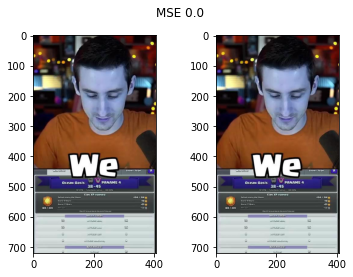

Since both the images were same MSE was zero as expected 


In [32]:
#Running Test on the same image
Target = cv2.imread("frame0.jpg")
img_to_compare = cv2.imread("frame0.jpg")
mse(Target,img_to_compare)
print ("Since both the images were same MSE was zero as expected ")


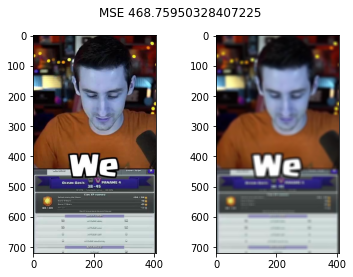

As you could see just by adding slight blur the MSE shot up by 400


In [38]:
#Added Blur and Reran the Test
Target = cv2.imread('frame0.jpg') 
edited = cv2.blur(img,(10,10)) 
mse(Target,edited)
print ("As you could see just by adding slight blur the MSE shot up by 400")

<img src="ssim.png">

<font color='burnt orange'>
<p style="font-family:Book Antiqua"><B> STRUCTURAL SIMILARITY INDEX: </B><BR>
To overcome this MSE limitation, I used the structural similarity index algorithm which perceives the change 
in structural information of the image by comparing local regions of the image instead of globally.<BR><BR>
SSIM value varies between -1 and 1, where 1 indicates perfect similarity.I leveraged the skimage.metrics structural simlarity function to write the below function that calculates and returns the SSIM score


In [43]:
#function to compare image using structural similarity

def img_comparision(imageA,imageB,title):
    
    Target = imageA
    img_to_compare = imageB
    
    #Read the user image and make the dimension same
    dim = (imageA.shape[1],imageA.shape[0])
    
    #img = cv2.imread(imageB, cv2.IMREAD_UNCHANGED)
    imageB = cv2.resize(imageB, dim, interpolation = cv2.INTER_AREA)
    
    #Convert to Greyscale
    imageA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
    imageB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)
    
    s = ssim(imageA,imageB)
    
    fig = plt.figure(title)
    plt.suptitle("SSIM %.2f" %(s))
    
    a = fig.add_subplot(1,2,1)
    plt.imshow(Target)
                 
    a = fig.add_subplot(1,2,2)
    plt.imshow(img_to_compare)
                 
    plt.show()

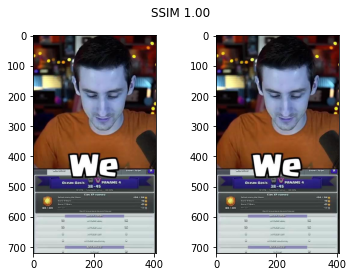

Since both the images were same SSIM score returned 1 as expected 


In [44]:
#Running Test on the same image
Target = cv2.imread("frame0.jpg")
img_to_compare = cv2.imread("frame0.jpg")
img_comparision(Target,img_to_compare,"Comparing Images")
print ("Since both the images were same SSIM score returned 1 as expected ")

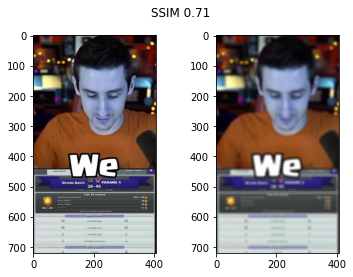

As you could see the SSIM score droped by only 0.29


In [47]:
#Added Blur and Reran the Test
Target = cv2.imread('frame0.jpg') 
edited = cv2.blur(img,(10,10)) 
img_comparision(Target,edited,"Comparing Images")
print ("As you could see the SSIM score droped by only 0.29")

<img src="mse vs ssim.png">

<font color='burnt orange'>
<p style="font-family:Book Antiqua"><B> Model Evaluation & Conclusion: </B><BR>
The SSIM method is clearly more involved than the MSE method, but the gist is that SSIM attempts to model the perceived change in the structural information of the image, whereas MSE is actually estimating the perceived errors. There is a subtle difference between the two, but the results are dramatic.<BR><BR>
MSE will calculate the mean square error between each pixels for the two images we are comparing. Whereas SSIM will do the opposite and look for similarities within pixels; i.e. if the pixels in the two images line up and or have similar pixel density values.<BR><BR>
With that said I knew I was heading in the right directions so I started training and tweaking model. To conclude my observation a SSIM score of 0.65 hits the sweet spot of predicting two images are similar to each other.<BR><BR>
Now that I know the problem, process & statistical algorithm required to address our goal, it was time to start organizing our work and package our learning to move to next phase.I created a git repo where I have saved all my work, you can easily download the repo and run the image_app.py code using streamlit to see the model in action. 
<a href="https://github.com/sachinvithaldalvi/Burnt-Base-Image-App-Capston-Project">Visit my github page for capstone project - Burnt Base</a> <BR><BR>
One critical improvement I managed to introduce during the wrapup was the ability to compare target image with the frame extracted from the list of YouTube video on the fly without the necessity to save the images on our local machine
<p style="font-family:Book Antiqua"><B> Limitation & Next Steps: </B><BR>
Unpon running multiple test I observed that one of the limitation of the model is performance and the fact that the dimension of the target image has to be same which really affects the ssim as we have to resize the target image.<BR><BR>
For Next steps I would like to concentrate on the following itmes:
- Identify a way to filter out similar frames While extracting the frames from given YouTube video <BR>
- Enhance the image resizing code to retain aspect ratio and dimension equality for both Target & comparing frames <BR> - Build bots on commonly used apps such as Discord, Line etc to publish the model <BR>
- To achieve the goals we set from the get go ie to help Clash of Clan Gamming community, we need to evolve our model to recognize the features inside an image and its positioning to compare with the frams from YouTube without the need of dimension equality. This can be done using the OBR or SIFT algorithm in the open CV library
    



In [48]:
#Example Code to evolve the model in the future:
# 2) Check for similarities between the 2 images using SIFT, we identify the keypoints ie feature and their descriptors

#original = cv2.imread("frame70.jpg")
original = cv2.imread("Test.jpg")
#image_to_compare = cv2.imread("Compare copy.jpg")
image_to_compare = cv2.imread("Eagle_Artillery4.png")

sift = cv2.xfeatures2d.SIFT_create()
kp_1, desc_1 = sift.detectAndCompute(original, None)
kp_2, desc_2 = sift.detectAndCompute(image_to_compare, None)


index_params = dict(algorithm=0, trees=5)
search_params = dict()
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(desc_1, desc_2, k=2)
print (len(matches))

14765


67


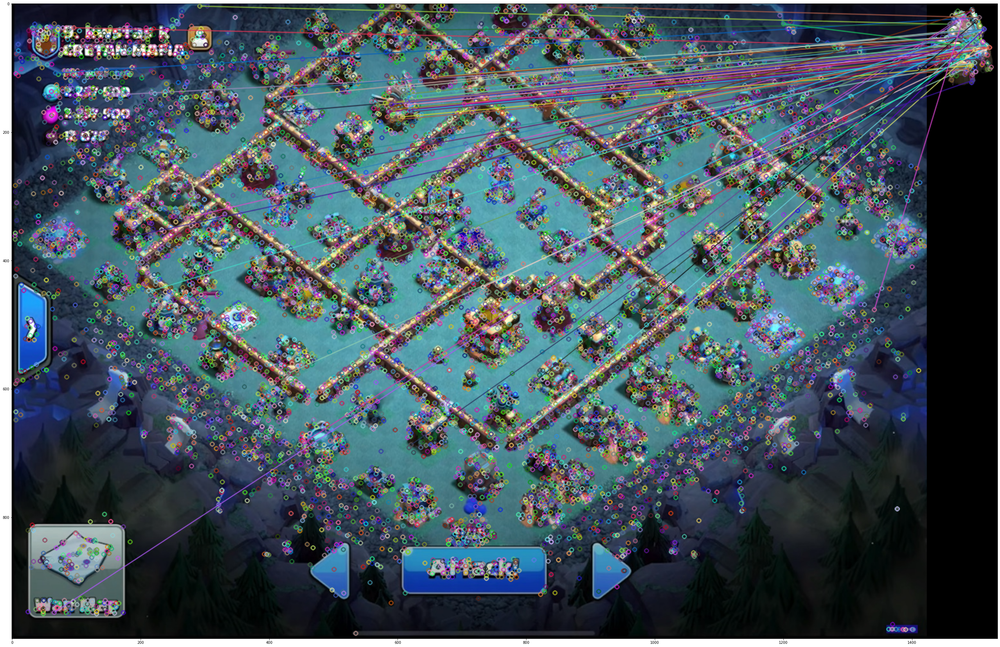

In [50]:
#pip install opencv-contrib-python
#Filter good point based on distance between the keypoints 
good_points = []
ratio = 0.7
for m, n in matches:
    if m.distance < ratio*n.distance:
        good_points.append(m)
        
print(len(good_points))
result = cv2.drawMatches(original, kp_1, image_to_compare, kp_2, good_points, None)
plt.figure(figsize=(50,50))
plt.imshow(result)

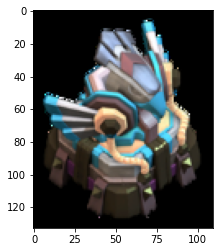

In [52]:
plt.imshow(image_to_compare)

<font color='burnt orange'>
<p style="font-family:Book Antiqua"><B> Future Goal - Object Recognition: </B><BR>
My goal for the future is to dive into the Clash of Clan problem statement and to evolve our model to Classify the key features within an image and indentify their position in the target image and then compare their positions with frames extracted from the video.<BR><BR>
We can then set a threshold to find the images with the image and check their position to deem a match is found. Also, to enhance the performace I would like to explore how can I leverat the AWS EC2 instance. 